# Dataset Overview

The Agricultural CO2 Emission Dataset originates from a fusion of multiple datasets primarily sourced from the Food and Agriculture Organization (FAO) and the Intergovernmental Panel on Climate Change (IPCC). Refined through the cleansing, preprocessing, and amalgamation of approximately twelve individual datasets, the resulting dataset offers a comprehensive view of CO2 emissions specifically tied to the agri-food sector.

The Global Comprehensive Country Dataset contains diverse indicators across all nations worldwide, including demographic statistics, economic indicators, environmental factors, healthcare metrics, educational statistics, etc. Given its comprehensive representation of every country, this dataset is crucial for conducting in-depth analyses and facilitating cross-country comparisons.

In this project, we aim to analyze the significant impact of CO2 emissions from agriculture on country-wide temperature and global warming contributions by using both the agricultural CO2 emission dataset and the global comprehensive country dataset. This combination of data sources not only provides an overall view of emissions within the agri-food sector but also contextualizes these emissions within socio-economic, demographic, and environmental factors across nations worldwide.

# Variable Overview

Within this analysis, the following variables stand as the main features:
*  Countries: This categorical variable denotes the countries being analyzed. Considering the geographical diversity, socio-economic differences, and policy variations among countries, analyzing emissions and temperature changes in different nations enables a deep understanding of the global impact of agricultural practices.
*  CO2 Emissions: This variable accounts for emissions of carbon dioxide released when organic soils are drained.
*  Average Temperature (°C): This variable signifies the yearly average temperature increase in degrees Celsius. It serves as a critical indicator of climate change trends.
*  Year: Tracking emissions and temperature changes every year allows for the identification of temporal trends, potential correlations, and the impact of evolving agricultural practices.



# Data Cleaning

# Data Visualization

In [ ]:
import pandas as pd

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import confusion_matrix

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score


from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

df1 = pd.read_csv('Agrofood_co2_emission.csv')
df2 = pd.read_csv('world-data-2023.csv')

countries_df1 = set(df1['Area'])
countries_df2 = set(df2['Country'])

common_countries = list(countries_df1.intersection(countries_df2))

print("Dataset Valules Individual: \n", "Agrofood:",
      len(df1['Area']),"\nWorld Data: ", len(df2['Country']))

print("Dataset Intersection: ", common_countries)
print("Number of Dataset Intersections", len(common_countries))

#Create new datframes that include only the intersecting countries
df1_common = df1[df1['Area'].isin(common_countries)]
df2_common = df2[df2['Country'].isin(common_countries)]
# df1_common
# print(df1_common.shape)
df2_common

Dataset Valules Individual: 
 Agrofood: 6965 
World Data:  195
Dataset Intersection:  ['Bosnia and Herzegovina', 'Belarus', 'Slovenia', 'Cyprus', 'Pakistan', 'Sudan', 'Chile', 'Finland', 'Uruguay', 'Tonga', 'Mongolia', 'Italy', 'Ukraine', 'North Macedonia', 'Botswana', 'Saint Vincent and the Grenadines', 'Marshall Islands', 'Andorra', 'Egypt', 'Vanuatu', 'Romania', 'Monaco', 'Liechtenstein', 'Estonia', 'Greece', 'Rwanda', 'Burkina Faso', 'Jamaica', 'Canada', 'Fiji', 'Algeria', 'South Africa', 'Switzerland', 'Brazil', 'Sri Lanka', 'Yemen', 'Zimbabwe', 'Central African Republic', 'Saint Lucia', 'Armenia', 'Mexico', 'Uganda', 'Argentina', 'Burundi', 'Lebanon', 'Spain', 'Israel', 'Cameroon', 'Niger', 'Iceland', 'Iraq', 'Morocco', 'Tuvalu', 'Sweden', 'Malaysia', 'Belgium', 'Saudi Arabia', 'Sierra Leone', 'Nepal', 'Lesotho', 'Democratic Republic of the Congo', 'Equatorial Guinea', 'Suriname', 'New Zealand', 'Palau', 'Guinea-Bissau', 'Colombia', 'Myanmar', 'Belize', 'Ecuador', 'Afghanistan', 

,Country,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Afghanistan,60,AF,58.10%,"652,230","323,000",32.49,93.0,Kabul,"8,672",...,78.40%,0.28,"38,041,754",48.90%,9.30%,71.40%,11.12%,"9,797,273",33.939110,67.709953
1,Albania,105,AL,43.10%,"28,748","9,000",11.78,355.0,Tirana,"4,536",...,56.90%,1.20,"2,854,191",55.70%,18.60%,36.60%,12.33%,"1,747,593",41.153332,20.168331
2,Algeria,18,DZ,17.40%,"2,381,741","317,000",24.28,213.0,Algiers,"150,006",...,28.10%,1.72,"43,053,054",41.20%,37.20%,66.10%,11.70%,"31,510,100",28.033886,1.659626
3,Andorra,164,AD,40.00%,468,NaN,7.20,376.0,Andorra la Vella,469,...,36.40%,3.33,"77,142",NaN,NaN,NaN,NaN,"67,873",42.506285,1.521801
4,Angola,26,AO,47.50%,"1,246,700","117,000",40.73,244.0,Luanda,"34,693",...,33.40%,0.21,"31,825,295",77.50%,9.20%,49.10%,6.89%,"21,061,025",-11.202692,17.873887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188,Uzbekistan,79,UZ,62.90%,"447,400","68,000",23.30,998.0,Tashkent,"91,811",...,42.70%,2.37,"33,580,650",65.10%,14.80%,31.60%,5.92%,"16,935,729",41.377491,64.585262
189,Vanuatu,25,VU,15.30%,"12,189",NaN,29.60,678.0,Port Vila,147,...,8.90%,0.17,"299,882",69.90%,17.80%,8.50%,4.39%,"76,152",-15.376706,166.959158
192,Yemen,56,YE,44.60%,"527,968","40,000",30.45,967.0,Sanaa,"10,609",...,81.00%,0.31,"29,161,922",38.00%,NaN,26.60%,12.91%,"10,869,523",15.552727,48.516388
193,Zambia,25,ZM,32.10%,"752,618","16,000",36.19,260.0,Lusaka,"5,141",...,27.50%,1.19,"17,861,030",74.60%,16.20%,15.60%,11.43%,"7,871,713",-13.133897,27.849332


Machine Learning Model/Processing

We created a new dataframe to extract data only for top 20 countries with the highest CO2 emissions for further analysis.

['China', 'Brazil', 'Indonesia', 'India', 'Democratic Republic of the Congo', 'Canada', 'Japan', 'Mexico', 'Germany', 'Australia', 'Myanmar', 'Argentina', 'Thailand', 'Italy', 'Colombia', 'France', 'Nigeria', 'Malaysia', 'Pakistan', 'Peru']


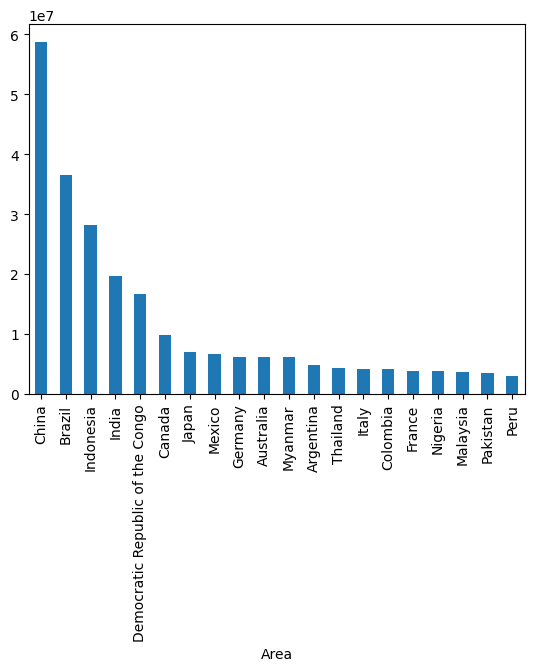

In [ ]:
#Predict the change in CO2 emmisions over time
#Compare with 2023 dataset
#Record the relationhsip between CO2 emmiisions and average temperature

#Display top 20 countries with the highest CO2 emmissions
areasEmissions= df1_common.groupby('Area')['total_emission'].sum()
top20Areas = areasEmissions.sort_values(ascending=False).head(20)

top20Areas.plot.bar()

top20Names = top20Areas.index.tolist()
print(top20Names)


In [ ]:
#Create df with just the top20
df1_top = df1_common[df1_common['Area'].isin(top20Names)]
df1_top

,Area,Year,Savanna fires,Forest fires,Crop Residues,Rice Cultivation,Drained organic soils (CO2),Pesticides Manufacturing,Food Transport,Forestland,...,Manure Management,Fires in organic soils,Fires in humid tropical forests,On-farm energy use,Rural population,Urban population,Total Population - Male,Total Population - Female,total_emission,Average Temperature °C
248,Argentina,1990,2779.6920,1097.1782,1965.4995,914.3008,5128.5140,689.0,2920.1255,-40102.7293,...,2173.3488,0.0000,541.3267,6077.2277,4260175.0,28469564.0,16063515.0,16574141.0,114303.061593,0.330083
249,Argentina,1991,2779.6920,1097.1782,2144.2348,676.3176,5128.5140,699.0,3143.7014,-40102.7293,...,2148.9266,0.0000,541.3267,4813.0080,4206419.0,28987499.0,16298168.0,16807594.0,112979.755893,0.193083
250,Argentina,1992,2779.6920,1097.1782,2248.5663,1103.0880,5128.5140,631.0,3514.5046,-40102.7293,...,2184.3961,0.0000,541.3267,6846.9016,4192854.0,29462297.0,16529209.0,17039077.0,114888.847106,-0.214083
251,Argentina,1993,2779.6920,1097.1782,2235.4830,1094.8560,5128.5140,571.0,3733.8100,-40102.7293,...,2177.4310,0.0000,541.3267,7553.7725,4177901.0,29933016.0,16757748.0,17269492.0,115580.587991,0.125417
252,Argentina,1994,2779.6920,1097.1782,2233.5385,1108.1056,5128.5140,693.0,3935.7432,-40102.7293,...,2241.3239,0.0000,541.3267,8927.2478,4160961.0,30397154.0,16989567.0,17499129.0,118040.630691,0.626417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6156,Thailand,2016,365.7965,3147.7477,2515.2077,48070.3341,984.4792,1056.0,7568.8012,291.4707,...,3251.2801,27.6323,2165.4650,10402.0091,35500674.0,33362840.0,34486044.0,36120993.0,194570.409300,1.587667
6157,Thailand,2017,261.6961,3277.1612,2573.0376,48005.0373,984.4792,1126.0,8282.7272,291.4707,...,3208.9083,0.0000,2627.3777,9368.4560,35071057.0,33966456.0,34594141.0,36304062.0,195444.638200,1.135667
6158,Thailand,2018,126.5102,1493.7156,2554.1203,47683.6946,985.9499,1142.0,8350.4053,291.4707,...,3174.2634,0.0000,1219.0445,10133.5496,34627095.0,34556078.0,34671370.0,36456433.0,194562.365700,1.102917
6159,Thailand,2019,350.7215,4542.4826,2303.5573,43942.9265,1024.4826,881.0,8579.7657,291.4707,...,3160.2194,0.0000,3434.9933,10331.5100,34173268.0,35132892.0,34723388.0,36584375.0,199757.463200,1.728833


Area
Afghanistan    2.279756e+05
Albania        1.145863e+05
Algeria        1.253680e+06
Andorra        1.639142e+05
Angola         2.798010e+06
                   ...     
Uzbekistan     1.104037e+06
Vanuatu        1.065991e+05
Yemen          3.925977e+05
Zambia         2.431215e+06
Zimbabwe       1.074258e+06
Name: total_emission, Length: 167, dtype: float64


<Axes: xlabel='total_emission', ylabel='Average Temperature °C'>

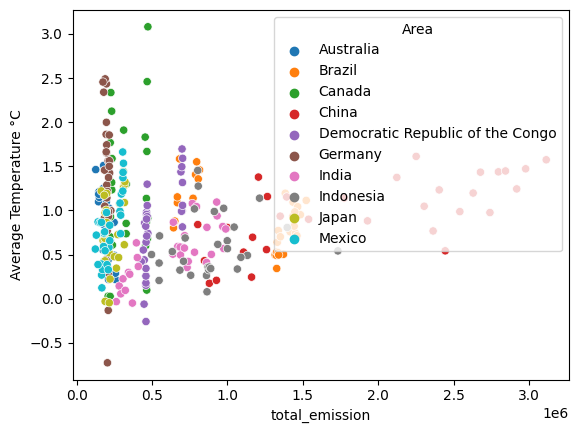

In [ ]:
##Visualisations
#Q: how can I show all plots at once
##Line graphs:

##Scatter Plots
#Agrofood_co2
# filtered_df1 = df1[df1['Area'].isin(['India', 'China', 'Pakistan', 'Russian Federation', 'Indonesia','France', 'Belgium', 'Italy'])]
# sns.scatterplot(x='total_emission', y='Average Temperature °C', hue ='Area', data=filtered_df1)

areasEmissions= df1_common.groupby('Area')['total_emission'].sum()
print(areasEmissions)

top10Areas = areasEmissions.sort_values(ascending=False).head(10)

# top20Areas.plot.bar()

top10Names = top10Areas.index.tolist()
df1_top10 = df1_common[df1_common['Area'].isin(top10Names)]

# print(top20Names)
sns.scatterplot(x='total_emission', y='Average Temperature °C', hue ='Area', data=df1_top10)


<Axes: xlabel='Agricultural Land( %)', ylabel='Co2-Emissions'>

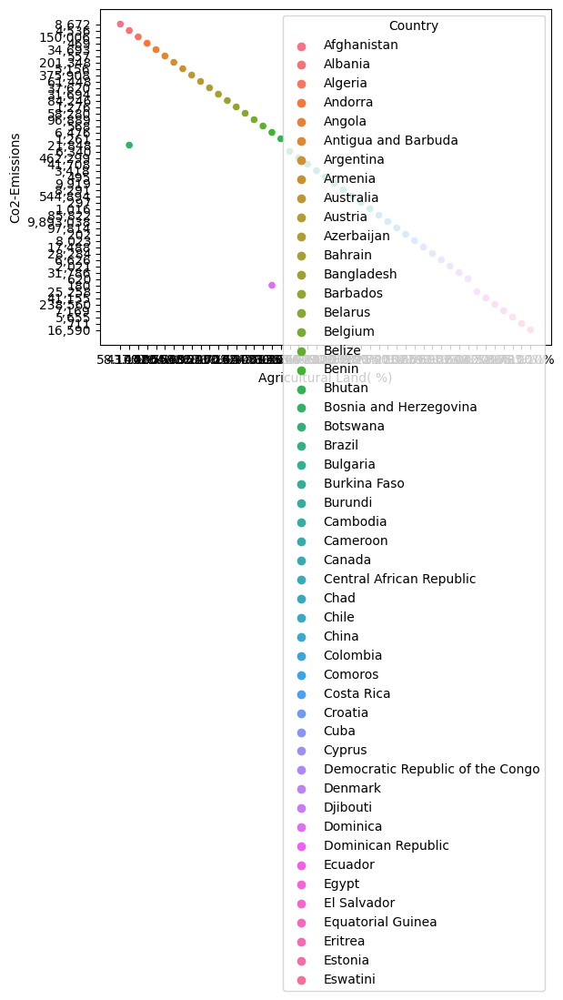

In [ ]:
#world-data

sns.scatterplot(x='Agricultural Land( %)', y='Co2-Emissions', hue ='Country', data=df2_common.head(50))

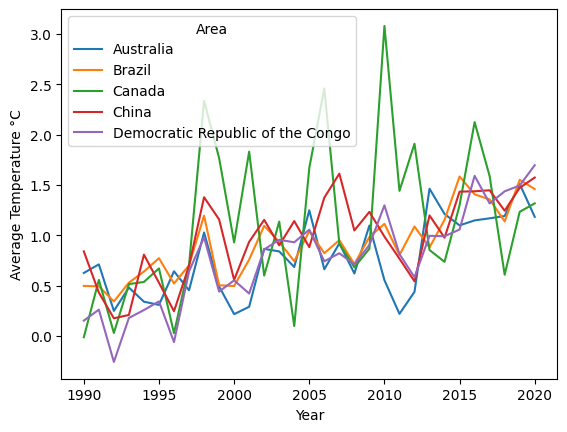

In [ ]:
##Line graphs
sns.lineplot(x='Year',y='Average Temperature °C',hue='Area',data=df1_top10.head(155));
# df1_top
# df1_top10.head(5)

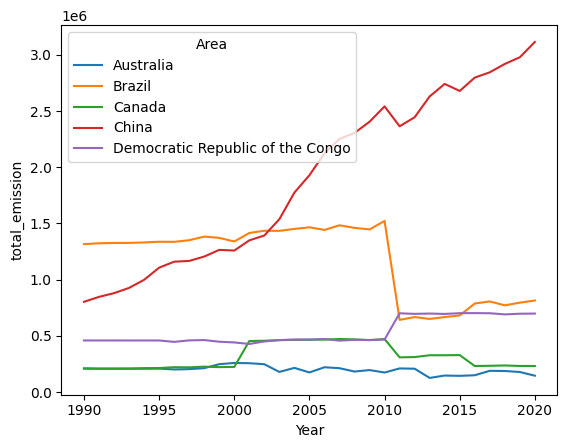

In [ ]:
sns.lineplot(x='Year',y='total_emission',hue='Area',data=df1_top10.head(155));

# **Train and Test Data**

In [ ]:
#separate train and test data

df1_train, df1_test = train_test_split(df1_common,
                                     train_size = 0.7,
                                     test_size = 0.3,
                                     random_state = 42)
print(len(df1_train))
print(len(df1_test))
# print(df1_train)

3525
1511


In [ ]:
#separate train and test data

df1_top_train, df1_top_test = train_test_split(df1_top,
                                     train_size = 0.7,
                                     test_size = 0.3,
                                     random_state = 42)
print(len(df1_top_train))
print(len(df1_top_test))
# print(df1_train)

434
186


In [ ]:
#separate train and test data
#split differently: maybe do for the whole data test
df2_train, df2_test = train_test_split(df2,
                                     train_size = 0.7,
                                     test_size = 0.3,
                                     random_state = 42)
print(len(df2_train))
print(len(df2_test))
# print(df_test)

136
59


Analysis:

# Starter Models

year v.s temperature

Simple Linear Regression

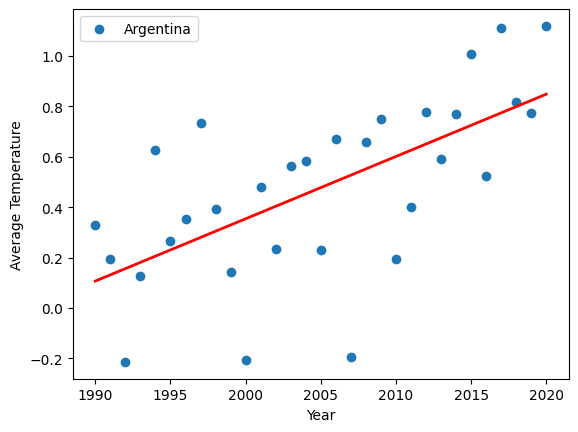

R-squared scores: 0.4


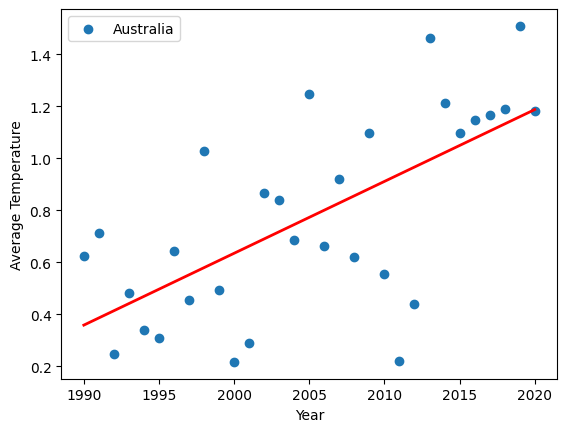

R-squared scores: 0.43


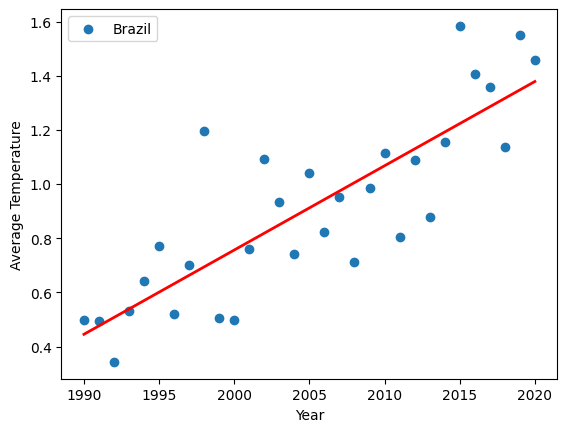

R-squared scores: 0.69


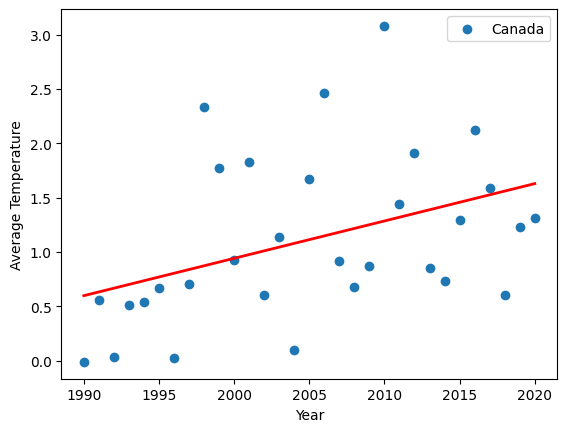

R-squared scores: 0.17


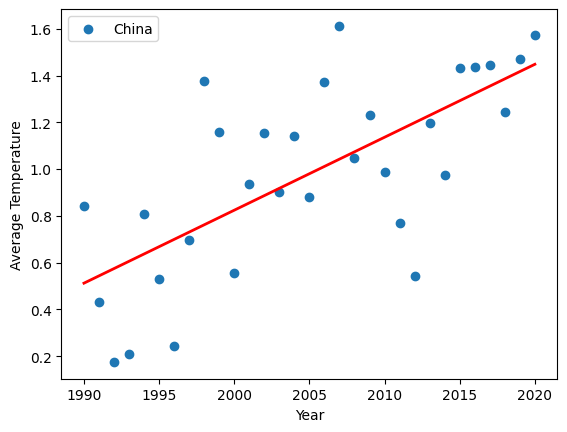

R-squared scores: 0.48


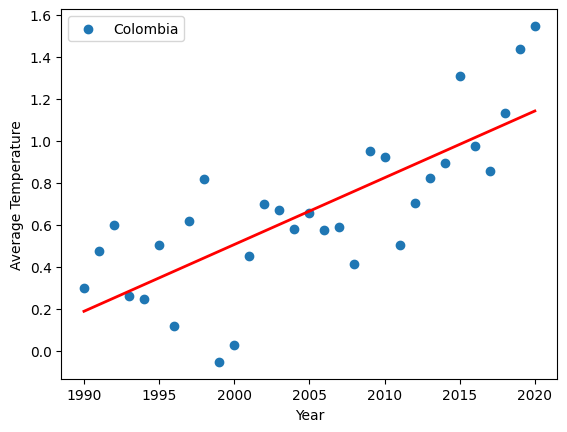

R-squared scores: 0.58


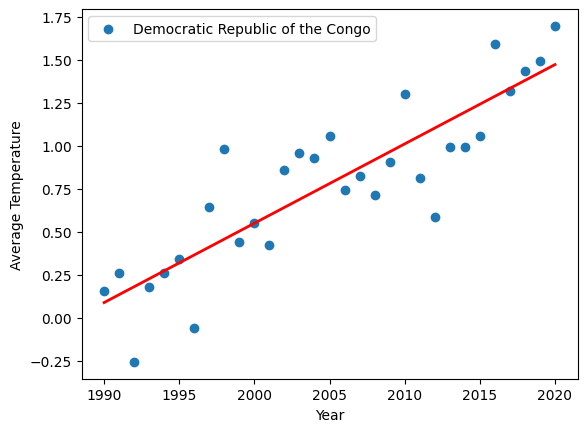

R-squared scores: 0.76


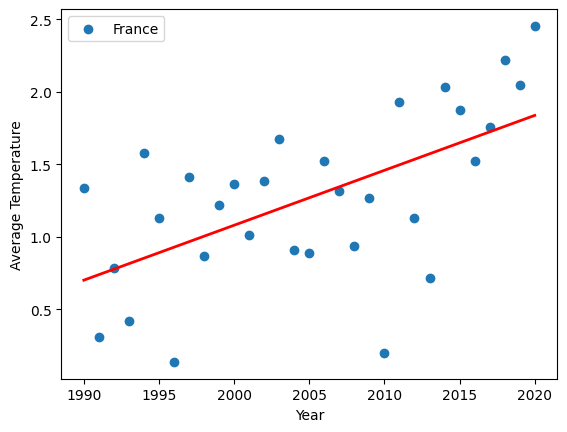

R-squared scores: 0.35


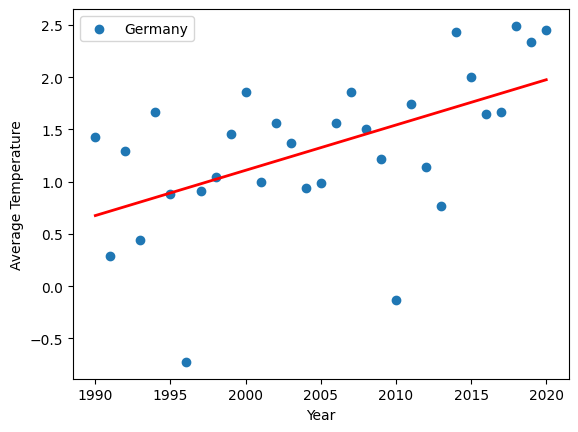

R-squared scores: 0.29


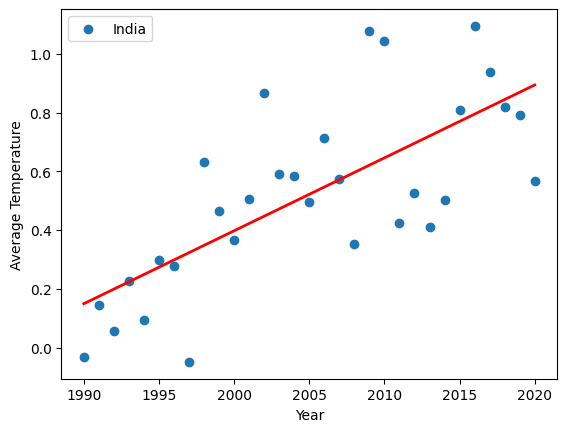

R-squared scores: 0.52


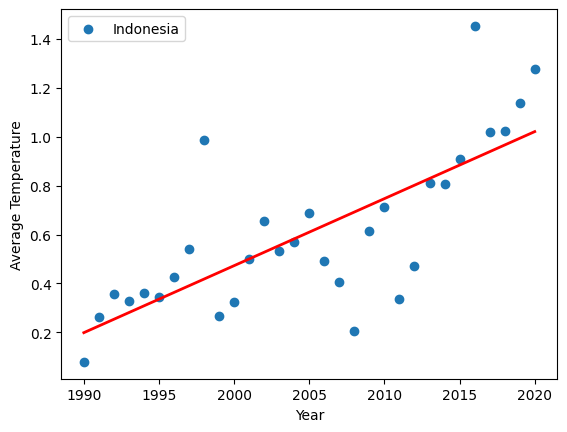

R-squared scores: 0.56


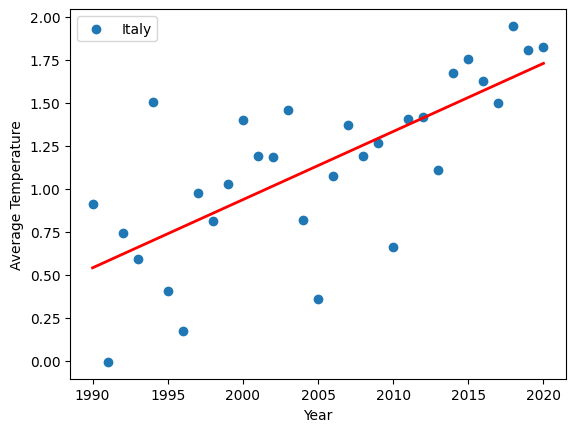

R-squared scores: 0.52


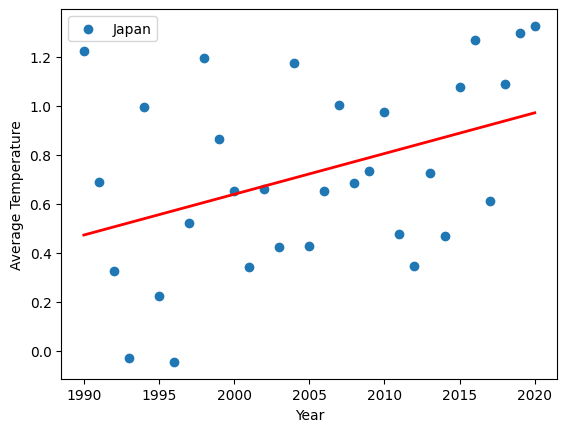

R-squared scores: 0.16


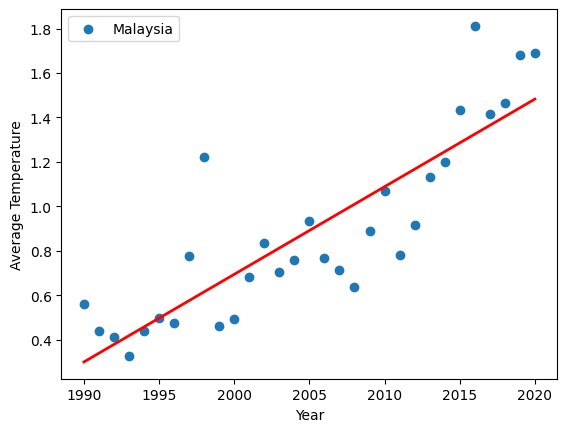

R-squared scores: 0.73


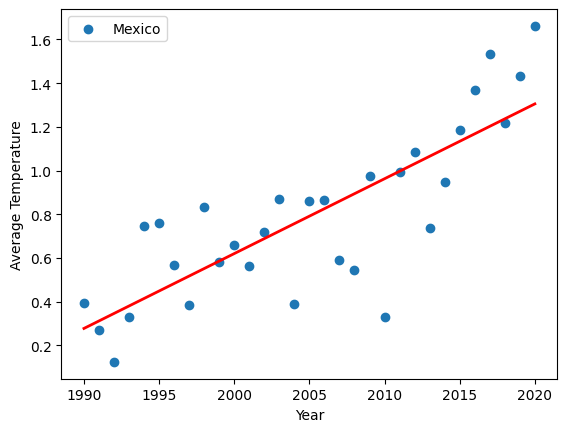

R-squared scores: 0.65


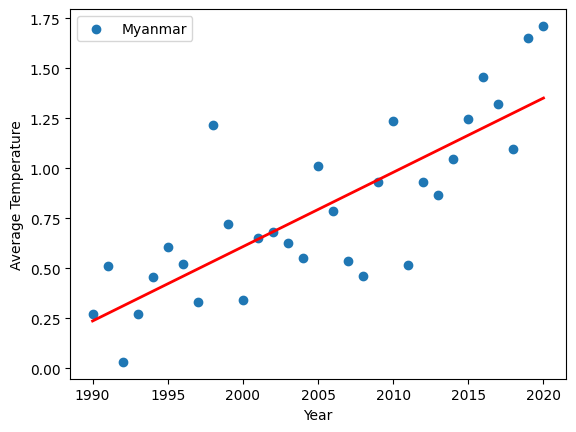

R-squared scores: 0.64


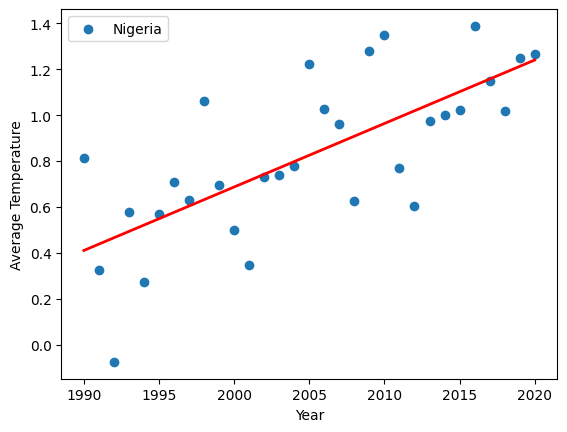

R-squared scores: 0.52


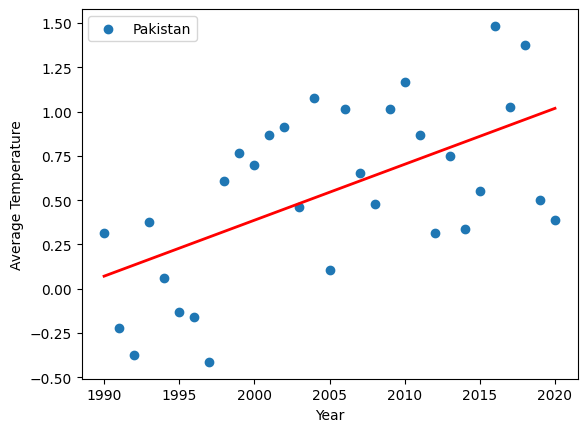

R-squared scores: 0.34


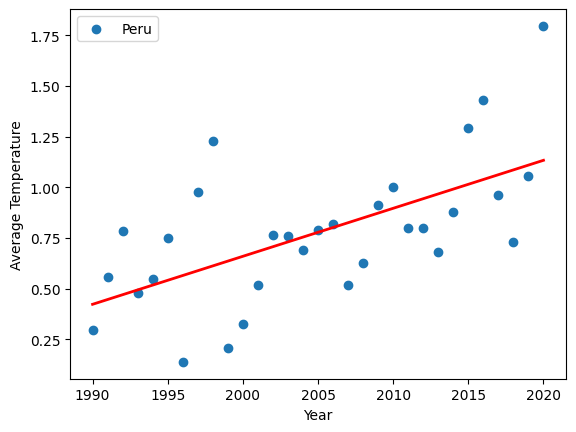

R-squared scores: 0.38


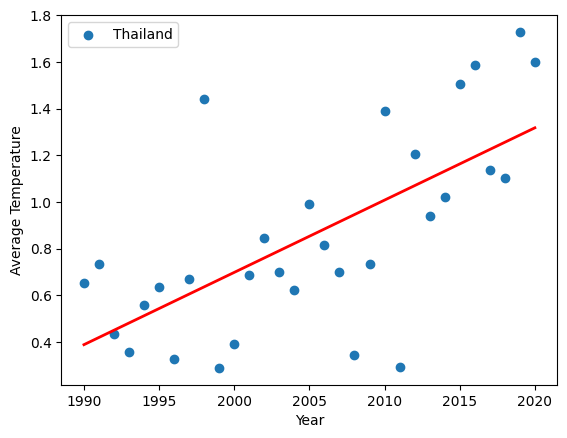

R-squared scores: 0.44


In [ ]:
chunk_size = 31

total_iterations = 20

country_info = {}

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size

    x_var = df1_top["Year"].iloc[start_index:end_index]
    y_var = df1_top["Average Temperature °C"].iloc[start_index:end_index]

    country_name = df1_top["Area"].iloc[start_index]

    x_var = x_var.to_numpy().reshape(-1, 1)
    y_var = y_var.to_numpy().reshape(-1, 1)

    # Train model
    model = LinearRegression()
    model.fit(x_var, y_var)
    y_pred = model.predict(x_var)

    # Plot scatterplot
    plt.scatter(x_var, y_var, label=country_name)

    # Plot regression line
    plt.plot(x_var, y_pred, color='red', linewidth=2)

    # Label axes
    plt.xlabel("Year")
    plt.ylabel("Average Temperature")

    plt.legend()

    plt.show()

    r2 = r2_score(y_var, y_pred)
    print('R-squared scores:', round(r2, 2))

Polynomials with degree of 4

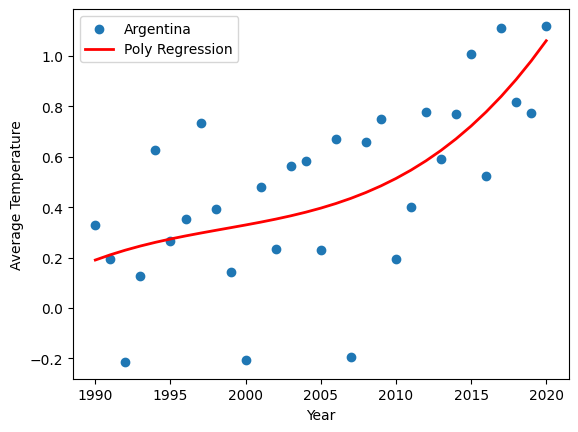

R-squared score: 0.45


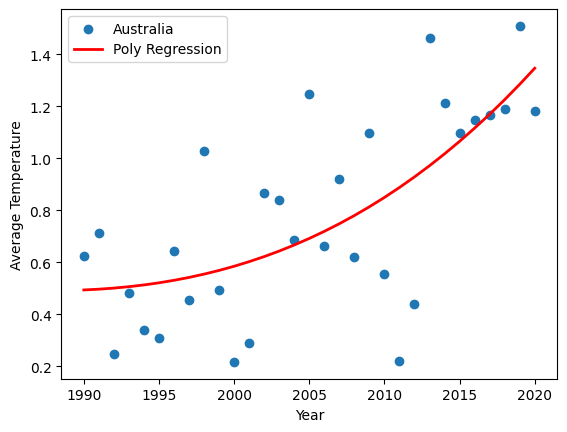

R-squared score: 0.47


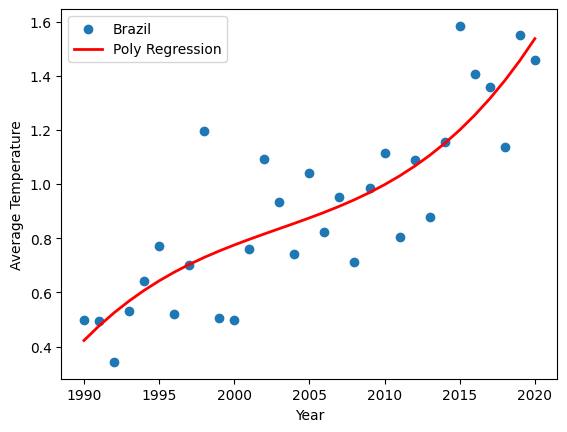

R-squared score: 0.72


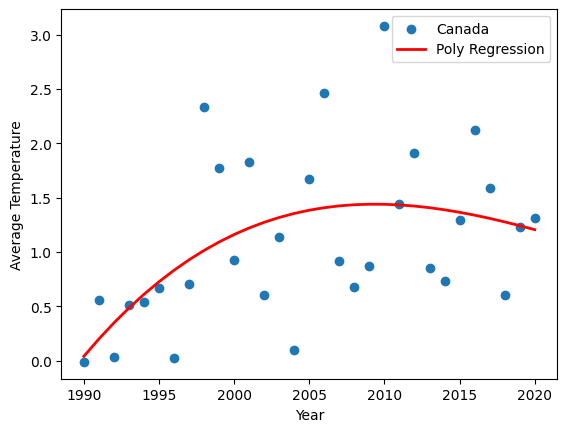

R-squared score: 0.27


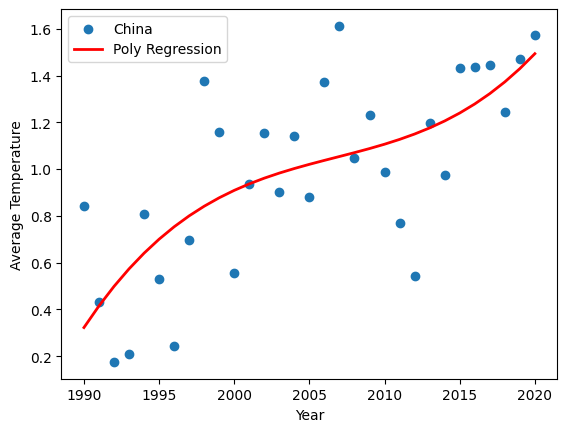

R-squared score: 0.5


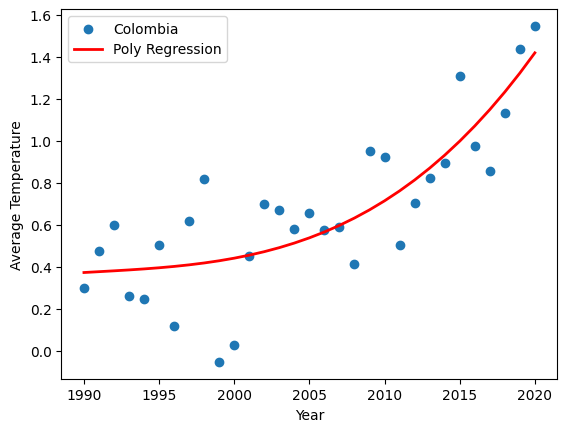

R-squared score: 0.68


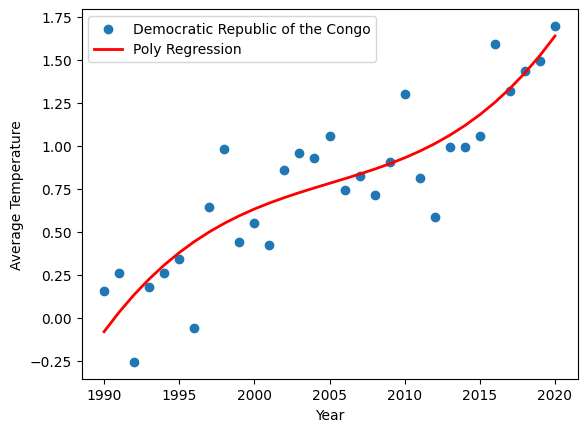

R-squared score: 0.78


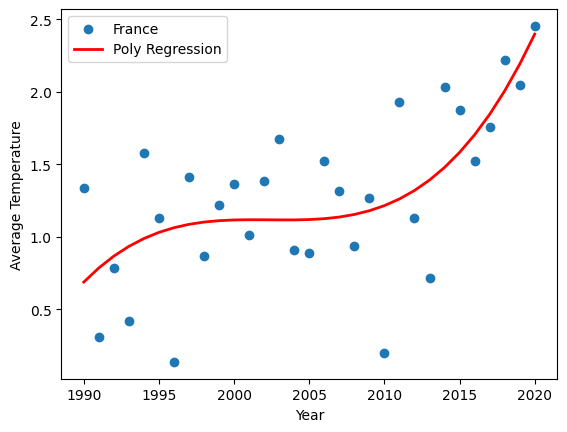

R-squared score: 0.46


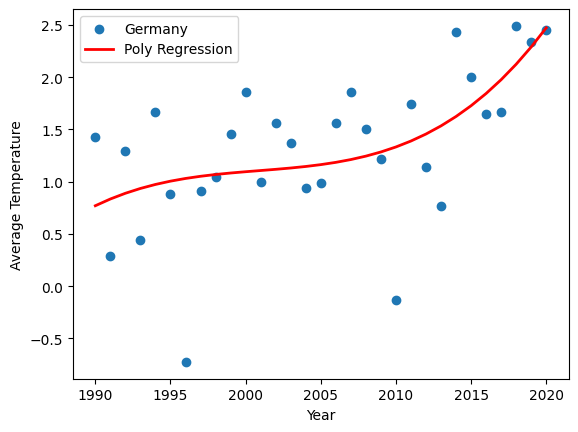

R-squared score: 0.35


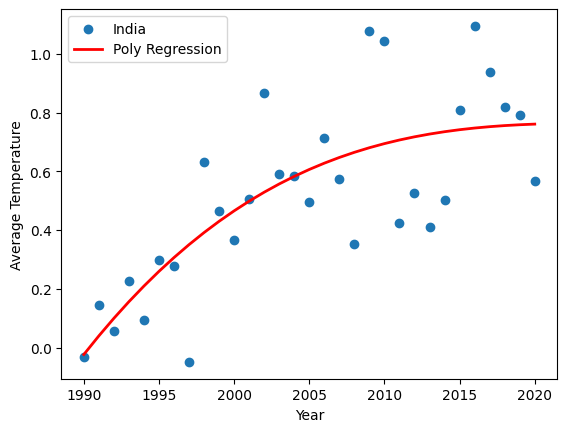

R-squared score: 0.58


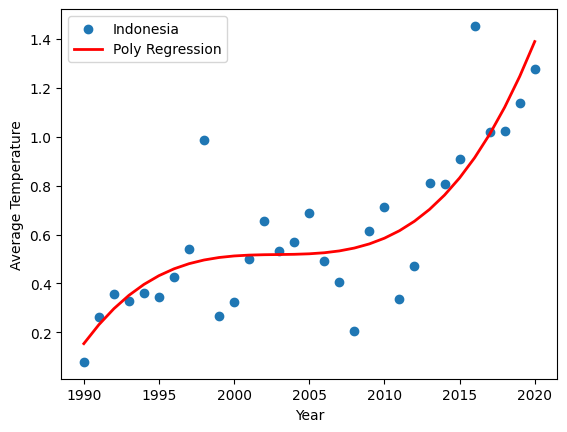

R-squared score: 0.7


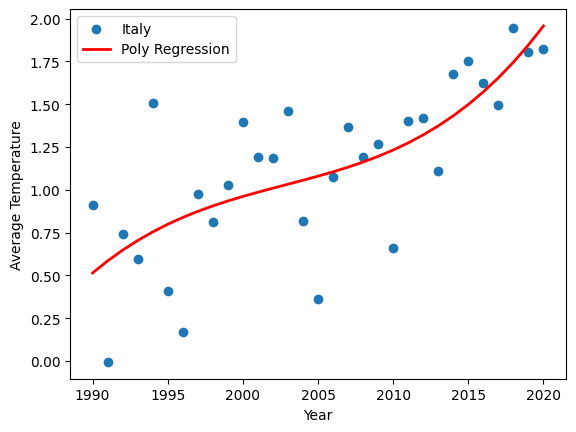

R-squared score: 0.54


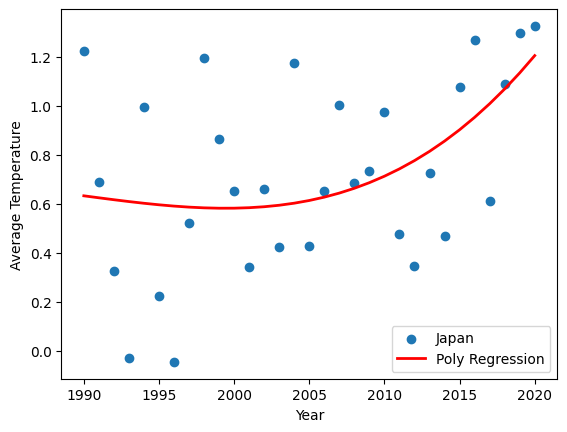

R-squared score: 0.22


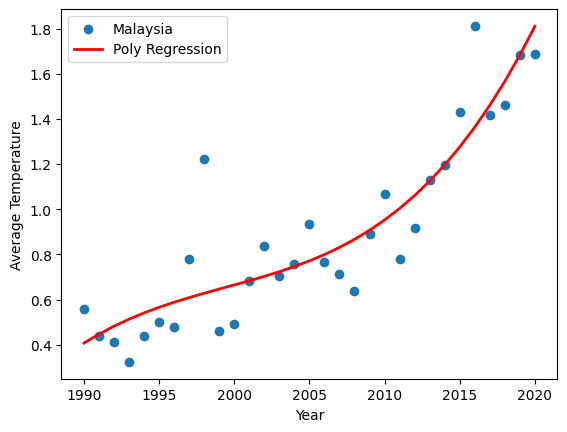

R-squared score: 0.81


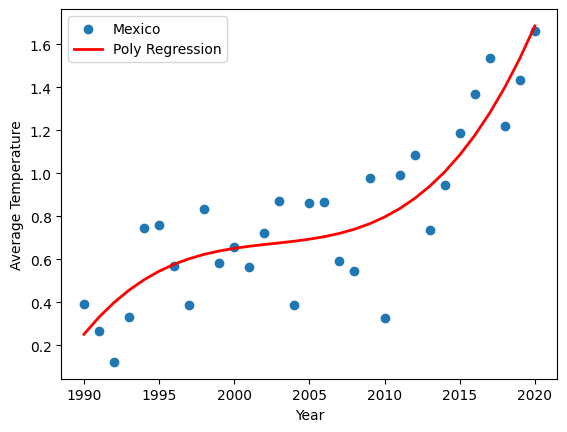

R-squared score: 0.76


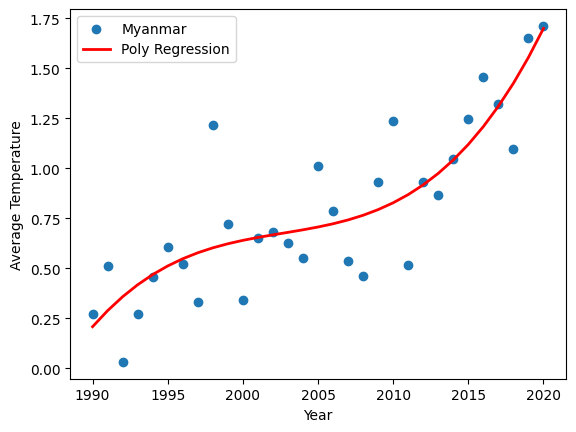

R-squared score: 0.72


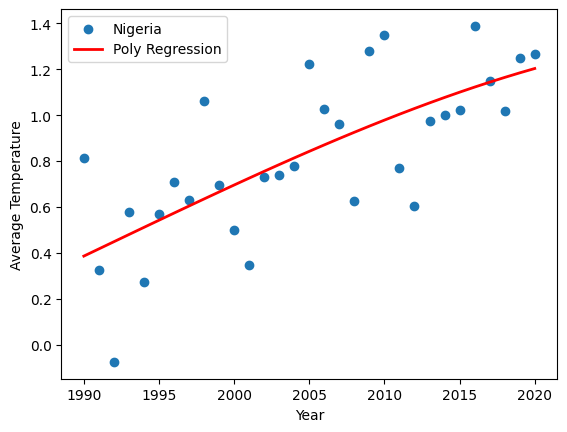

R-squared score: 0.52


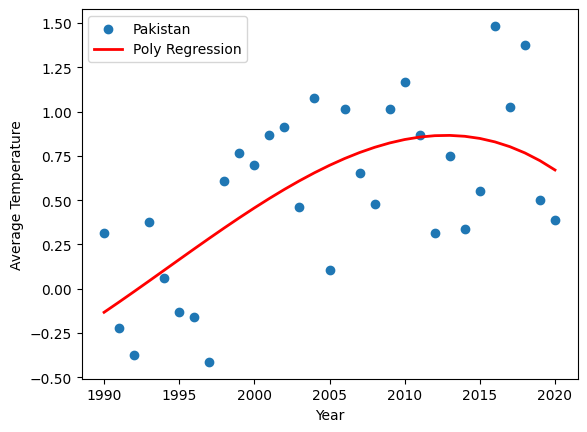

R-squared score: 0.42


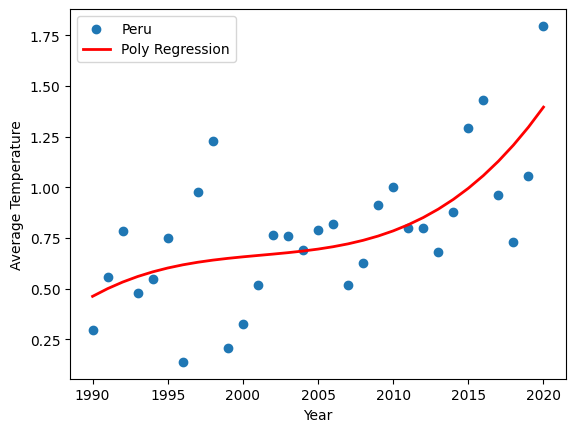

R-squared score: 0.44


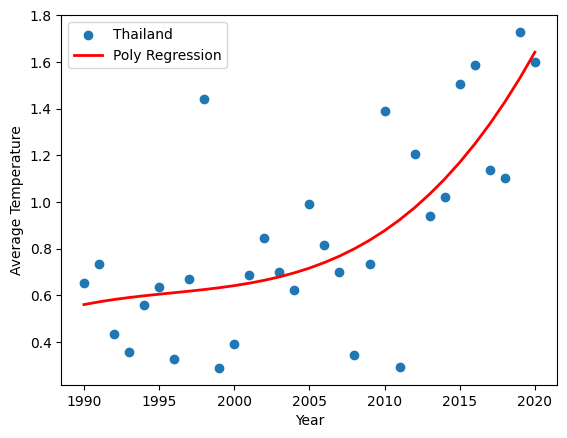

R-squared score: 0.53


In [ ]:
chunk_size = 31
total_iterations = 20

country_info = {}

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size

    x_var = df1_top["Year"].iloc[start_index:end_index]
    y_var = df1_top["Average Temperature °C"].iloc[start_index:end_index]

    country_name = df1_top["Area"].iloc[start_index]

    x_var = x_var.to_numpy().reshape(-1, 1)
    y_var = y_var.to_numpy().reshape(-1, 1)

    # Create polynomial features
    degree = 4
    poly_features = PolynomialFeatures(degree=degree)
    x_poly = poly_features.fit_transform(x_var)

    # Train model
    model = LinearRegression()
    model.fit(x_poly, y_var)
    y_pred = model.predict(x_poly)

    # Plot scatterplot
    plt.scatter(x_var, y_var, label=country_name)

    # Sort the values of x before line plot
    sort_axis = np.argsort(x_var.flatten())
    plt.plot(x_var[sort_axis], y_pred[sort_axis], color='red', linewidth=2, label='Poly Regression')

    # Label axes
    plt.xlabel("Year")
    plt.ylabel("Average Temperature")

    plt.legend()

    plt.show()

    r2 = r2_score(y_var, y_pred)
    print('R-squared score:', round(r2, 2))

Split and train dataset with polynomials degree of 4

Argentina: Train R-squared score - 0.47, Test R-squared score - 0.22
Australia: Train R-squared score - 0.52, Test R-squared score - -0.76
Brazil: Train R-squared score - 0.79, Test R-squared score - 0.42
Canada: Train R-squared score - 0.39, Test R-squared score - -0.42
China: Train R-squared score - 0.67, Test R-squared score - -1.71
Colombia: Train R-squared score - 0.73, Test R-squared score - 0.52
Democratic Republic of the Congo: Train R-squared score - 0.8, Test R-squared score - 0.6
France: Train R-squared score - 0.53, Test R-squared score - -0.17
Germany: Train R-squared score - 0.4, Test R-squared score - -0.22
India: Train R-squared score - 0.66, Test R-squared score - 0.06
Indonesia: Train R-squared score - 0.73, Test R-squared score - 0.53
Italy: Train R-squared score - 0.6, Test R-squared score - 0.17
Japan: Train R-squared score - 0.45, Test R-squared score - -1.23
Malaysia: Train R-squared score - 0.87, Test R-squared score - 0.56
Mexico: Train R-squared score - 0.74, 

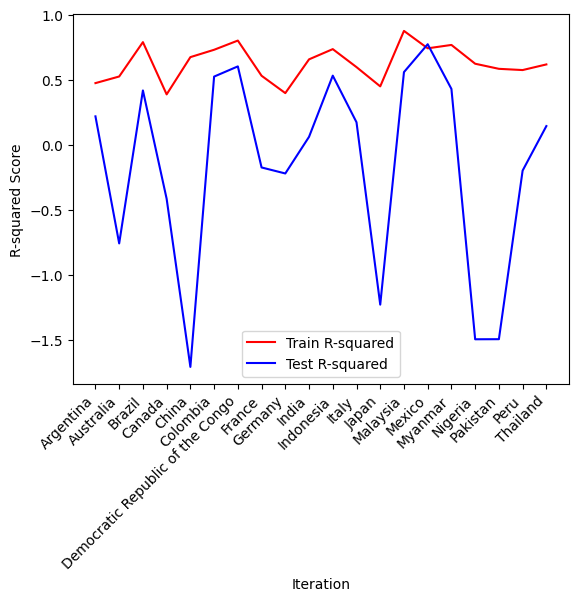

In [ ]:
chunk_size = 31
total_iterations = 20

train_scores = []
test_scores = []

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size

    x_var = df1_top["Year"].iloc[start_index:end_index]
    y_var = df1_top["Average Temperature °C"].iloc[start_index:end_index]

    country_name = df1_top["Area"].iloc[start_index]

    x_var = x_var.to_numpy().reshape(-1, 1)
    y_var = y_var.to_numpy().reshape(-1, 1)

    # Create polynomial features
    degree = 4
    poly_features = PolynomialFeatures(degree=degree)
    x_poly = poly_features.fit_transform(x_var)

    # Split data into train and test sets (70% train, 30% test)
    x_train, x_test, y_train, y_test = train_test_split(x_poly, y_var, test_size=0.3, random_state=42)

    # Train model on the training set
    model = LinearRegression()
    model.fit(x_train, y_train)

    # Predictions on both training and test sets
    y_pred_train = model.predict(x_train)
    y_pred_test = model.predict(x_test)

    # Compute R-squared scores for both training and test sets
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)

    print(f'{country_name}: Train R-squared score - {round(r2_train, 2)}, Test R-squared score - {round(r2_test, 2)}')

    train_scores.append(r2_train)
    test_scores.append(r2_test)

# Plot the R-squared scores for train and test sets
plt.plot(train_scores, 'red', label='Train R-squared')
plt.plot(test_scores, 'blue', label='Test R-squared')
plt.xlabel("Iteration")
plt.ylabel("R-squared Score")
plt.xticks(range(total_iterations), [df1_top["Area"].iloc[i * chunk_size] for i in range(total_iterations)], rotation=45, ha='right')
plt.legend()
plt.show()

Split and train dataset with polynomials degree of 6

Argentina: Train R-squared score - 0.47, Test R-squared score - 0.22
Australia: Train R-squared score - 0.52, Test R-squared score - -0.76
Brazil: Train R-squared score - 0.79, Test R-squared score - 0.42
Canada: Train R-squared score - 0.39, Test R-squared score - -0.41
China: Train R-squared score - 0.67, Test R-squared score - -1.7
Colombia: Train R-squared score - 0.73, Test R-squared score - 0.52
Democratic Republic of the Congo: Train R-squared score - 0.8, Test R-squared score - 0.6
France: Train R-squared score - 0.53, Test R-squared score - -0.17
Germany: Train R-squared score - 0.4, Test R-squared score - -0.22
India: Train R-squared score - 0.66, Test R-squared score - 0.06
Indonesia: Train R-squared score - 0.73, Test R-squared score - 0.53
Italy: Train R-squared score - 0.6, Test R-squared score - 0.18
Japan: Train R-squared score - 0.45, Test R-squared score - -1.23
Malaysia: Train R-squared score - 0.87, Test R-squared score - 0.56
Mexico: Train R-squared score - 0.74, T

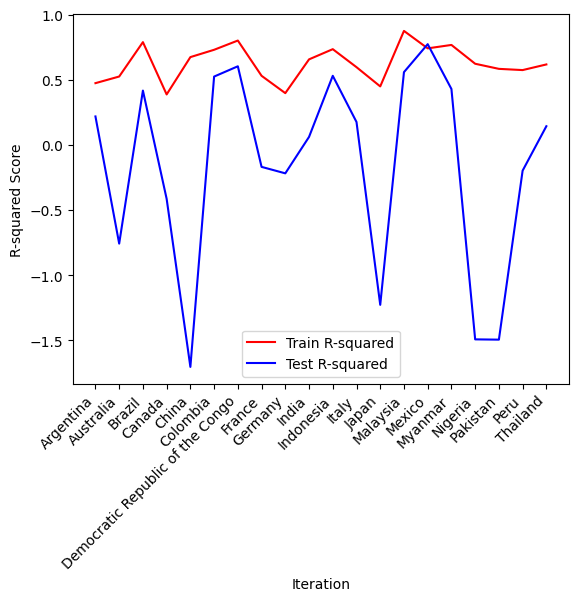

In [ ]:
chunk_size = 31
total_iterations = 20

train_scores = []
test_scores = []

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size

    x_var = df1_top["Year"].iloc[start_index:end_index]
    y_var = df1_top["Average Temperature °C"].iloc[start_index:end_index]

    country_name = df1_top["Area"].iloc[start_index]

    x_var = x_var.to_numpy().reshape(-1, 1)
    y_var = y_var.to_numpy().reshape(-1, 1)

    # Create polynomial features
    degree = 6
    poly_features = PolynomialFeatures(degree=degree)
    x_poly = poly_features.fit_transform(x_var)

    # Split data into train and test sets (70% train, 30% test)
    x_train, x_test, y_train, y_test = train_test_split(x_poly, y_var, test_size=0.3, random_state=42)

    # Train model on the training set
    model = LinearRegression()
    model.fit(x_train, y_train)

    # Predictions on both training and test sets
    y_pred_train = model.predict(x_train)
    y_pred_test = model.predict(x_test)

    # Compute R-squared scores for both training and test sets
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)

    print(f'{country_name}: Train R-squared score - {round(r2_train, 2)}, Test R-squared score - {round(r2_test, 2)}')

    train_scores.append(r2_train)
    test_scores.append(r2_test)

# Plot the R-squared scores for train and test sets
plt.plot(train_scores, 'red', label='Train R-squared')
plt.plot(test_scores, 'blue', label='Test R-squared')
plt.xlabel("Iteration")
plt.ylabel("R-squared Score")
plt.xticks(range(total_iterations), [df1_top["Area"].iloc[i * chunk_size] for i in range(total_iterations)], rotation=45, ha='right')
plt.legend()
plt.show()

year v.s total emission

Simple linear regression

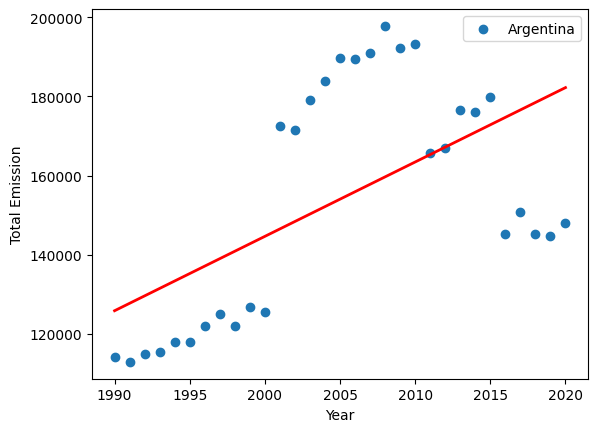

R-squared scores: 0.33


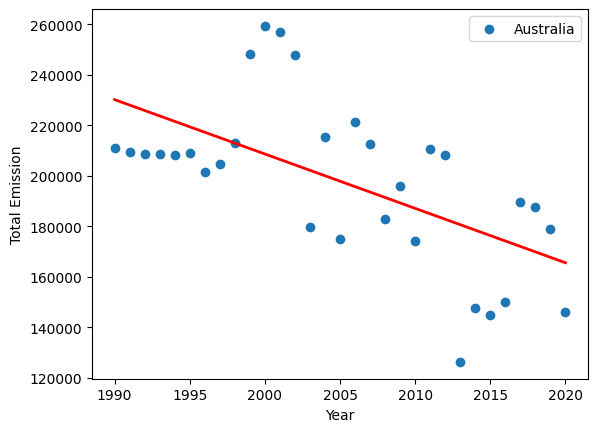

R-squared scores: 0.36


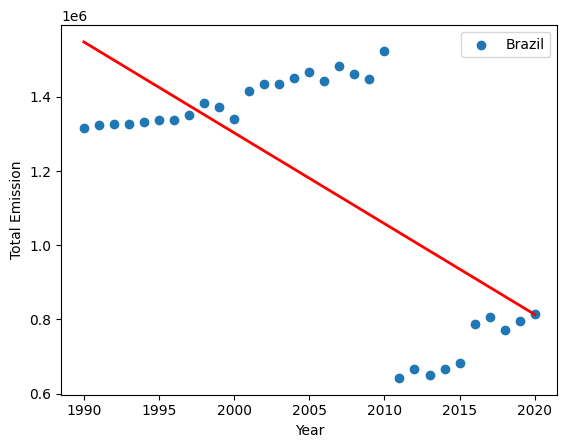

R-squared scores: 0.47


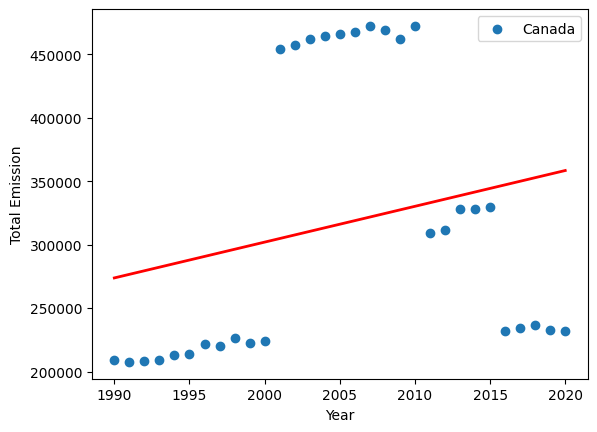

R-squared scores: 0.05


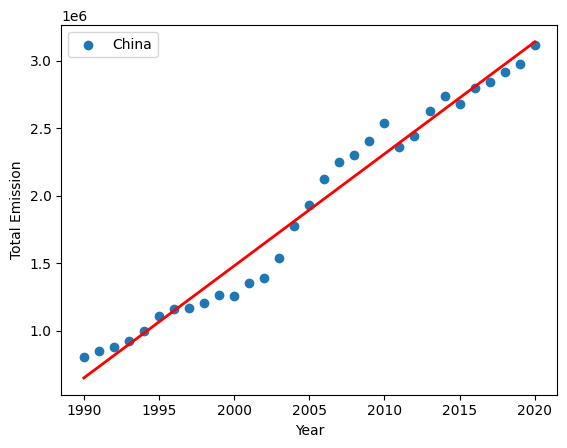

R-squared scores: 0.97


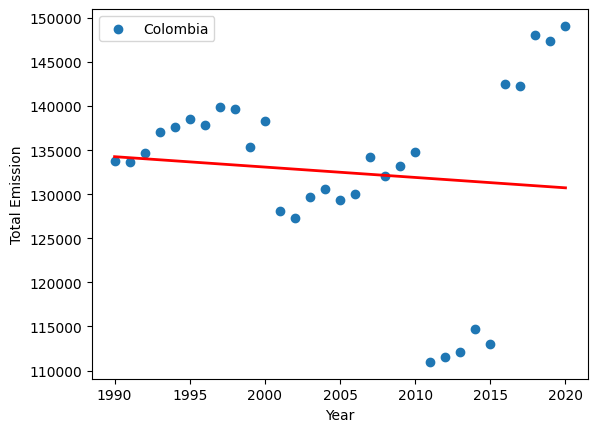

R-squared scores: 0.01


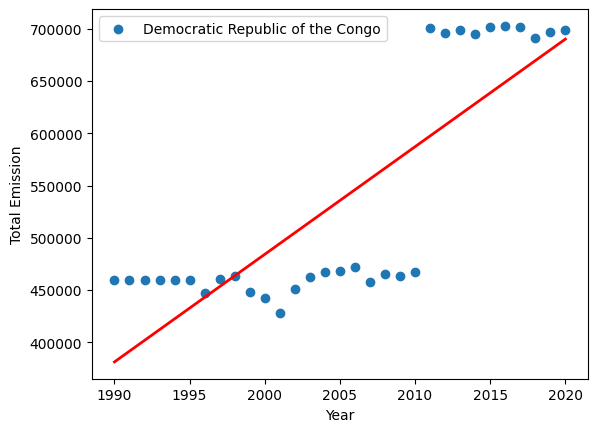

R-squared scores: 0.67


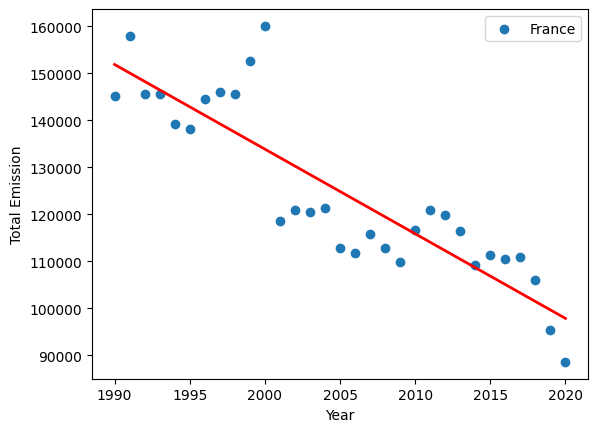

R-squared scores: 0.77


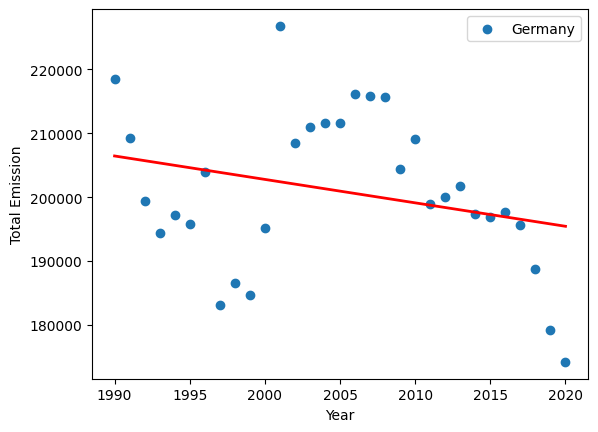

R-squared scores: 0.07


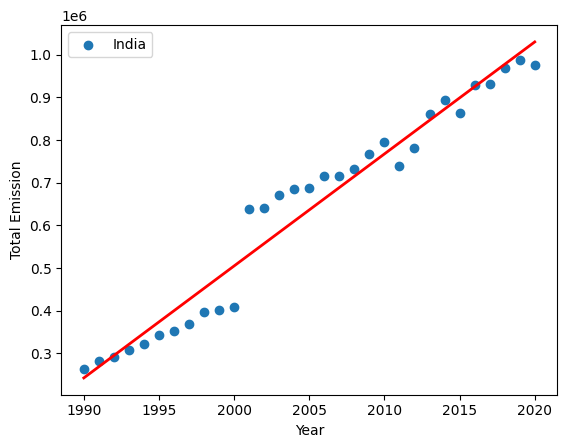

R-squared scores: 0.96


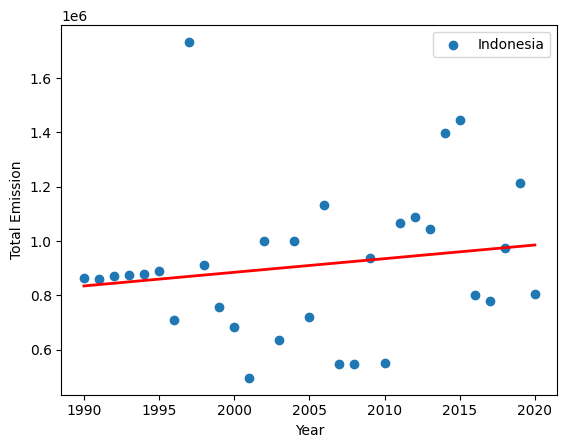

R-squared scores: 0.03


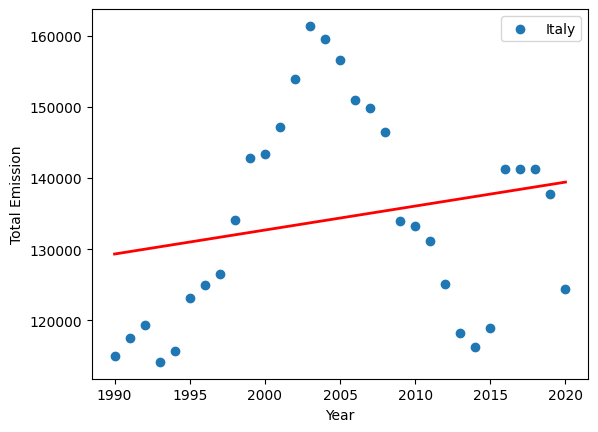

R-squared scores: 0.04


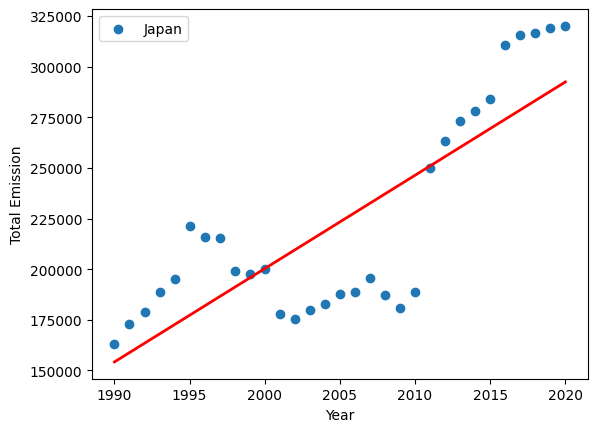

R-squared scores: 0.64


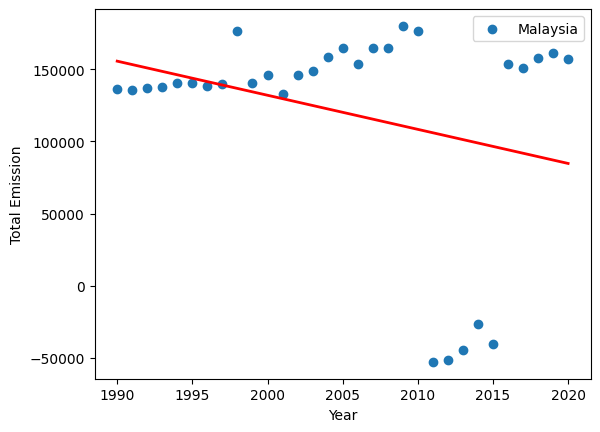

R-squared scores: 0.08


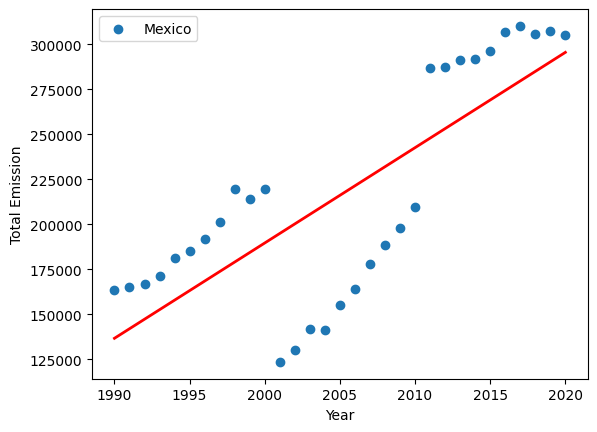

R-squared scores: 0.59


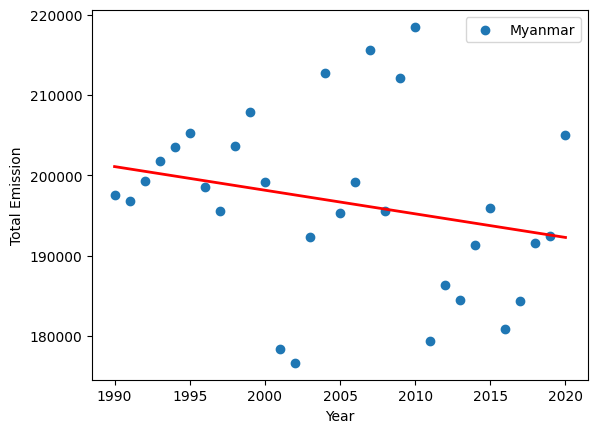

R-squared scores: 0.06


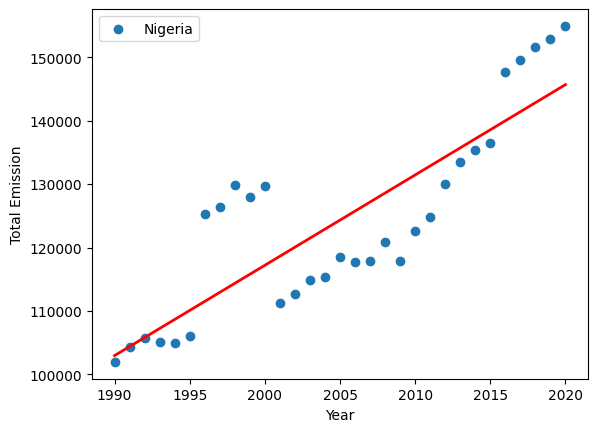

R-squared scores: 0.71


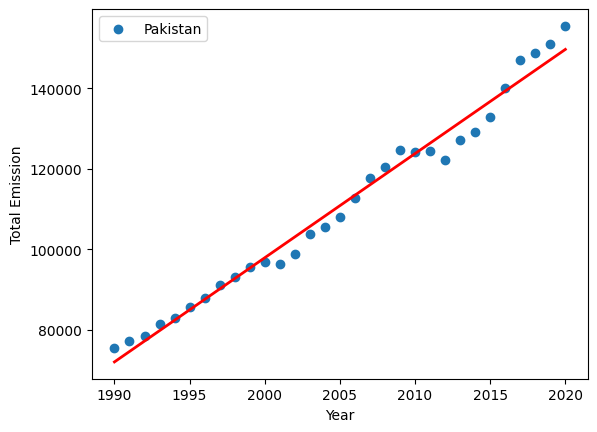

R-squared scores: 0.98


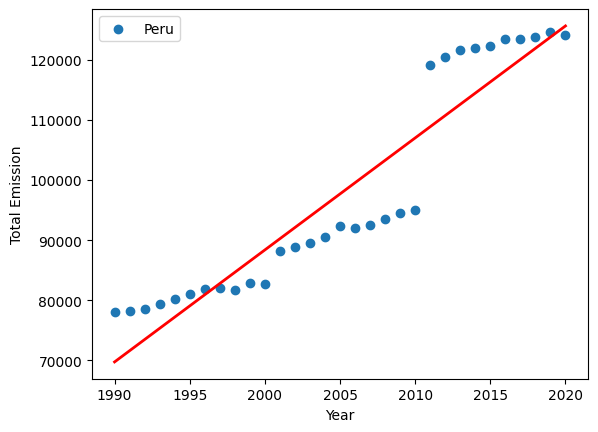

R-squared scores: 0.88


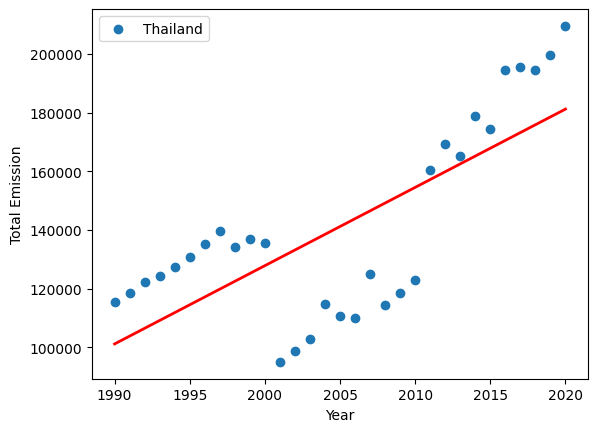

R-squared scores: 0.53


In [ ]:
chunk_size = 31

total_iterations = 20

country_info = {}

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size

    x_var = df1_top["Year"].iloc[start_index:end_index]
    y_var = df1_top["total_emission"].iloc[start_index:end_index]

    country_name = df1_top["Area"].iloc[start_index]

    x_var = x_var.to_numpy().reshape(-1, 1)
    y_var = y_var.to_numpy().reshape(-1, 1)

    # Train model
    model = LinearRegression()
    model.fit(x_var, y_var)
    y_pred = model.predict(x_var)

    # Plot scatterplot
    plt.scatter(x_var, y_var, label=country_name)

    # Plot regression line
    plt.plot(x_var, y_pred, color='red', linewidth=2)

    # Label axes
    plt.xlabel("Year")
    plt.ylabel("Total Emission")

    plt.legend()

    plt.show()
    r2 = r2_score(y_var, y_pred)
    print('R-squared scores:', round(r2, 2))

    country_info[country_name] = {'slope': model.coef_[0][0], 'intercept': model.intercept_[0]}

Polynomials with degree of 5

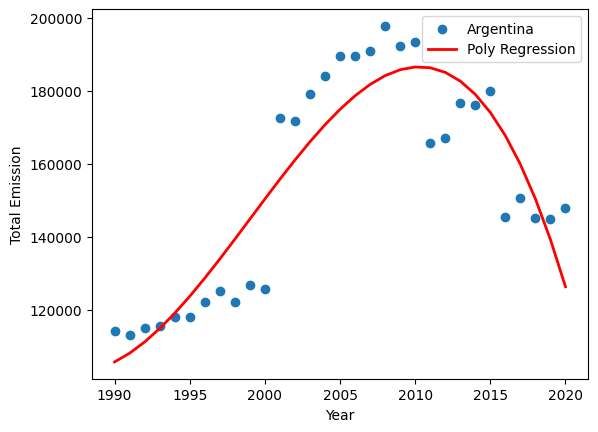

R-squared score: 0.82


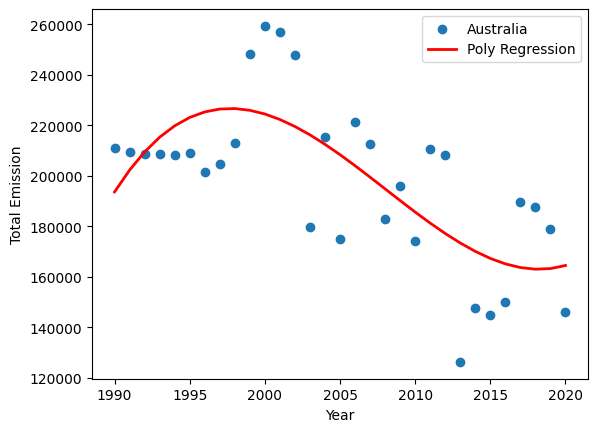

R-squared score: 0.5


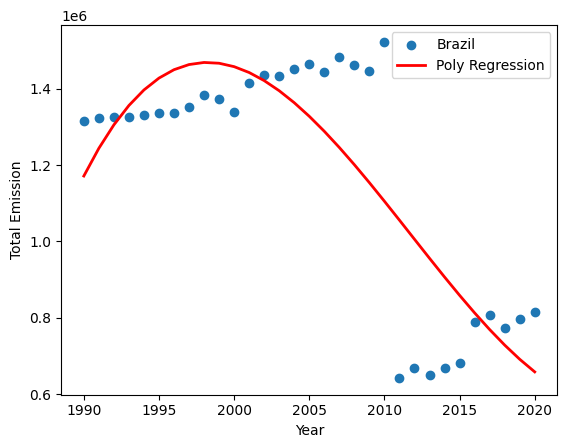

R-squared score: 0.67


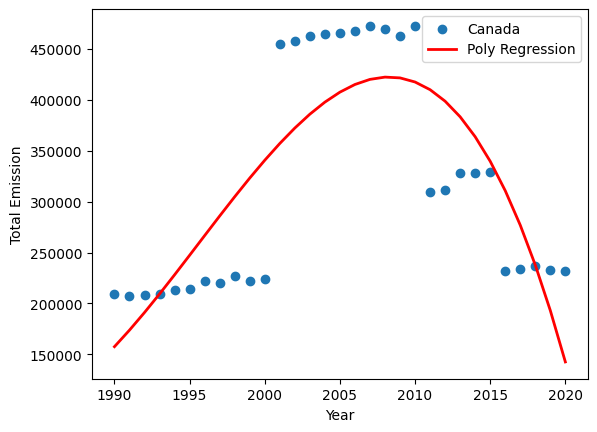

R-squared score: 0.66


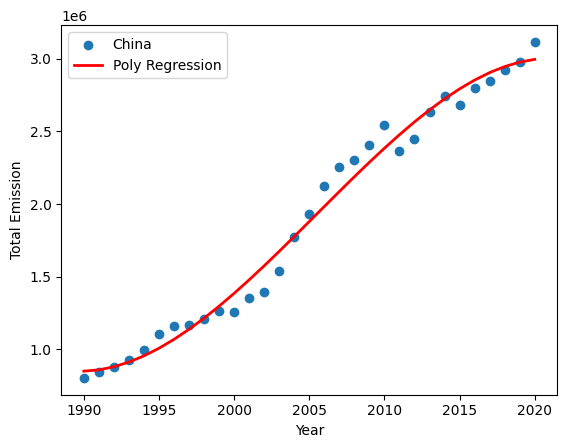

R-squared score: 0.98


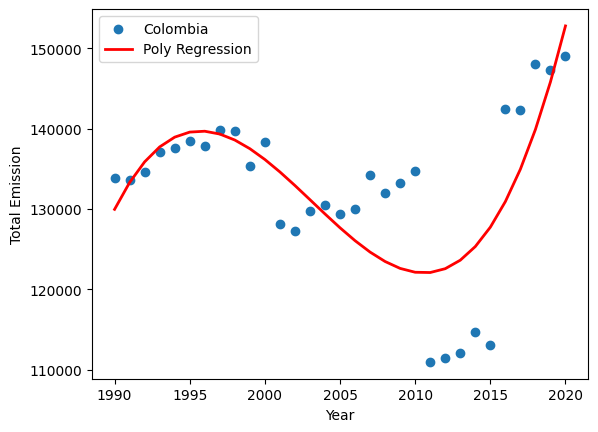

R-squared score: 0.53


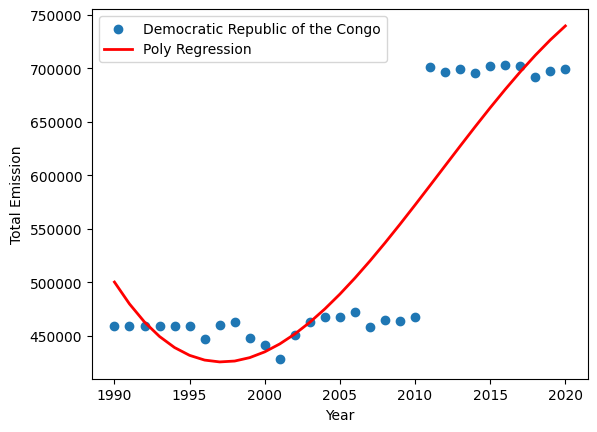

R-squared score: 0.82


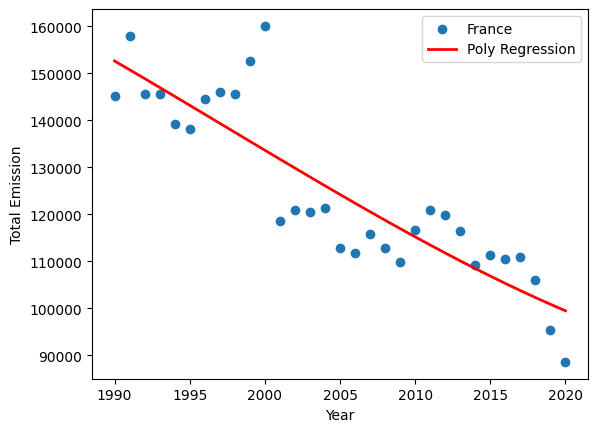

R-squared score: 0.77


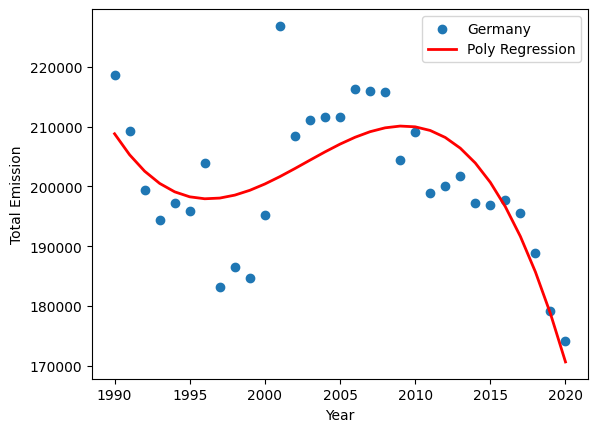

R-squared score: 0.55


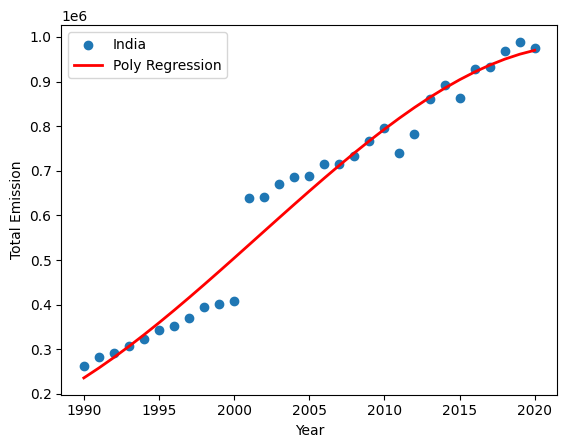

R-squared score: 0.96


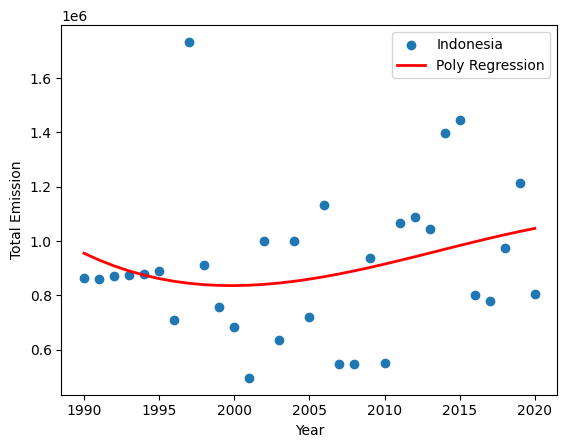

R-squared score: 0.06


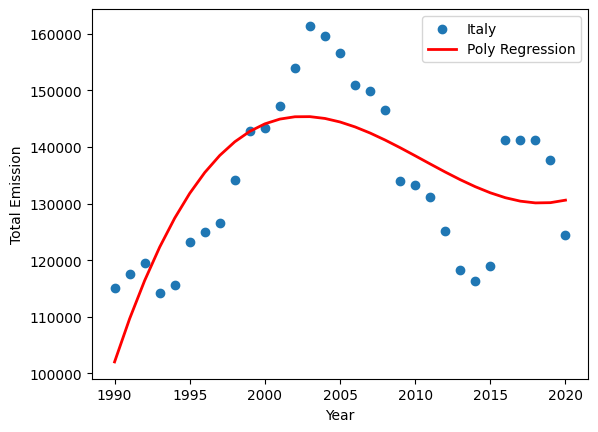

R-squared score: 0.52


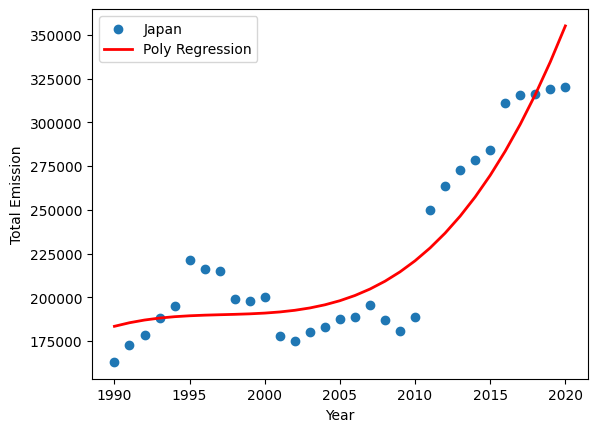

R-squared score: 0.85


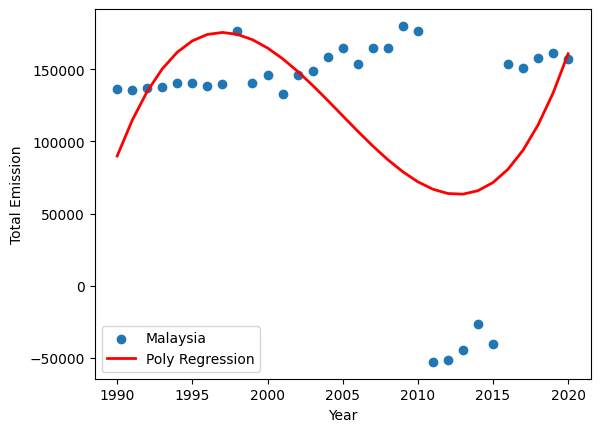

R-squared score: 0.29


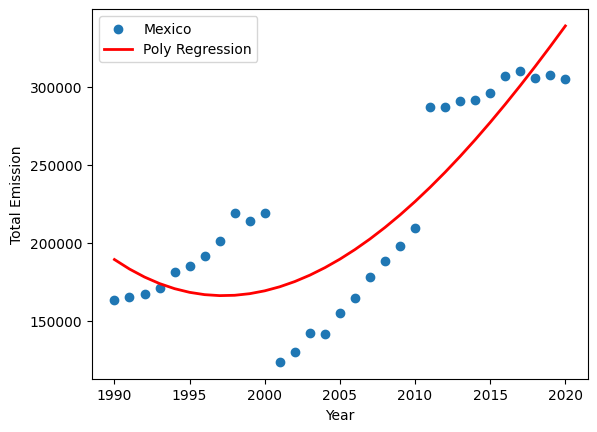

R-squared score: 0.74


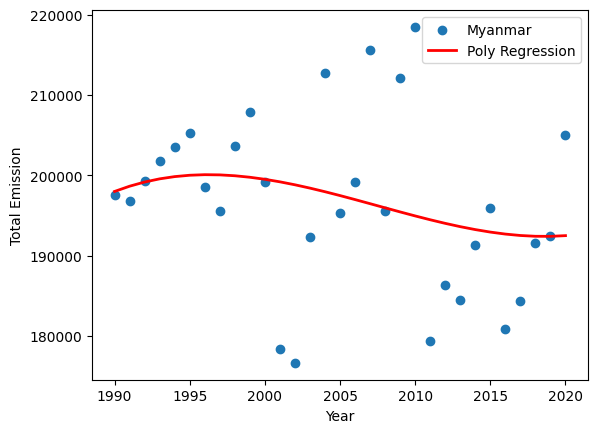

R-squared score: 0.07


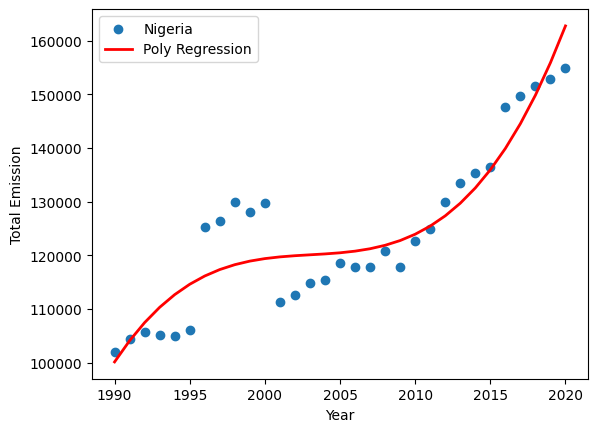

R-squared score: 0.85


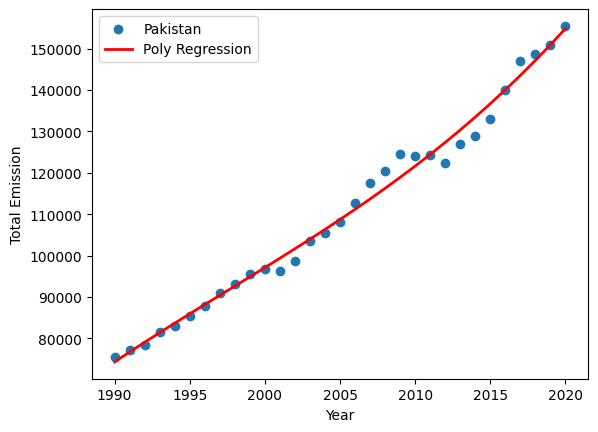

R-squared score: 0.99


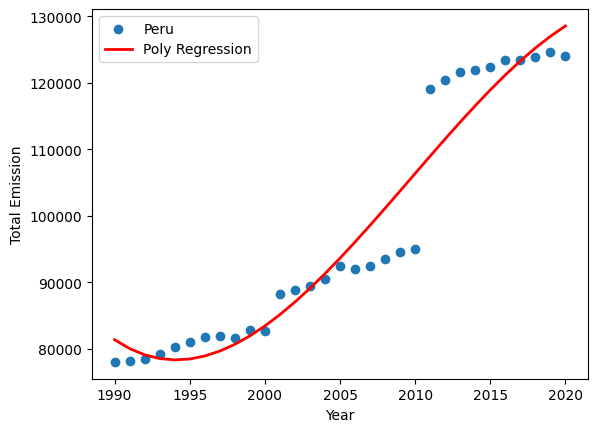

R-squared score: 0.93


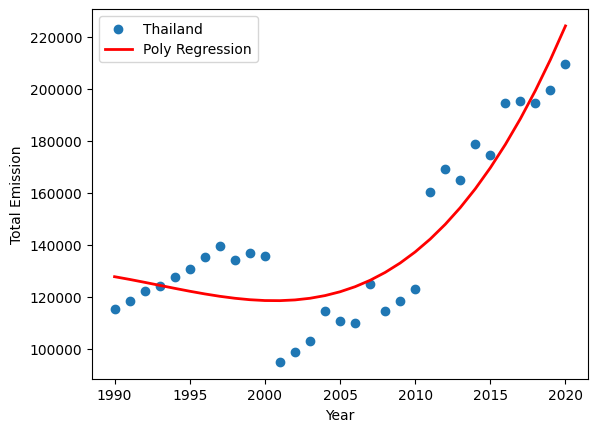

R-squared score: 0.82


In [ ]:
chunk_size = 31
total_iterations = 20

country_info = {}

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size

    x_var = df1_top["Year"].iloc[start_index:end_index]
    y_var = df1_top["total_emission"].iloc[start_index:end_index]

    country_name = df1_top["Area"].iloc[start_index]

    x_var = x_var.to_numpy().reshape(-1, 1)
    y_var = y_var.to_numpy().reshape(-1, 1)

    # Create polynomial features
    degree = 5
    poly_features = PolynomialFeatures(degree=degree)
    x_poly = poly_features.fit_transform(x_var)

    # Train model
    model = LinearRegression()
    model.fit(x_poly, y_var)
    y_pred = model.predict(x_poly)

    # Plot scatterplot
    plt.scatter(x_var, y_var, label=country_name)

    # Sort the values of x before line plot
    sort_axis = np.argsort(x_var.flatten())
    plt.plot(x_var[sort_axis], y_pred[sort_axis], color='red', linewidth=2, label='Poly Regression')

    # Label axes
    plt.xlabel("Year")
    plt.ylabel("Total Emission")

    plt.legend()

    plt.show()

    r2 = r2_score(y_var, y_pred)
    print('R-squared score:', round(r2, 2))

Split and train dataset with polynomials degree of 5

Argentina: Train R-squared score - 0.82, Test R-squared score - 0.79


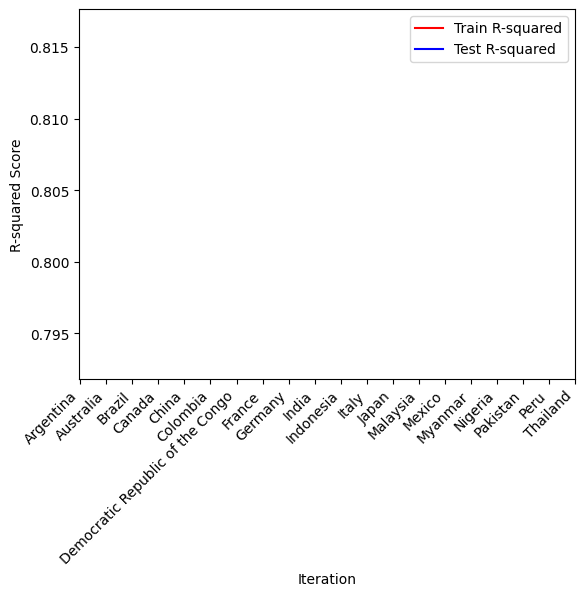

Australia: Train R-squared score - 0.52, Test R-squared score - 0.42


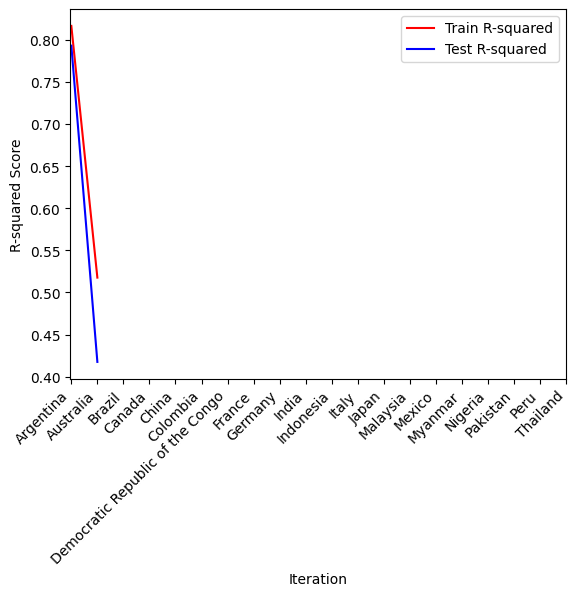

Brazil: Train R-squared score - 0.62, Test R-squared score - 0.74


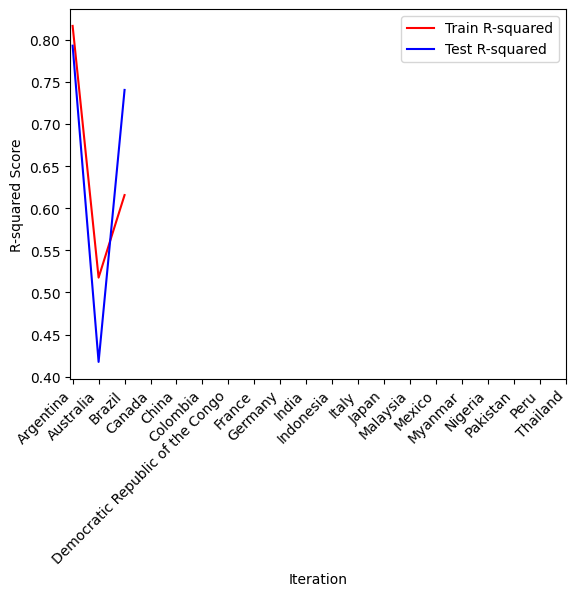

Canada: Train R-squared score - 0.68, Test R-squared score - 0.6


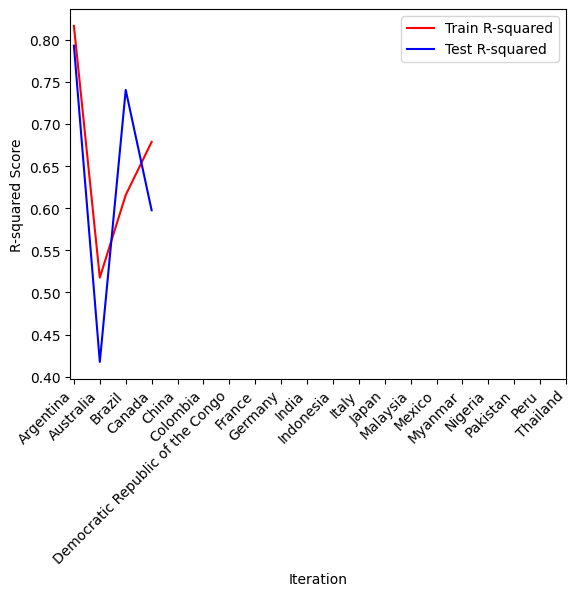

China: Train R-squared score - 0.98, Test R-squared score - 0.99


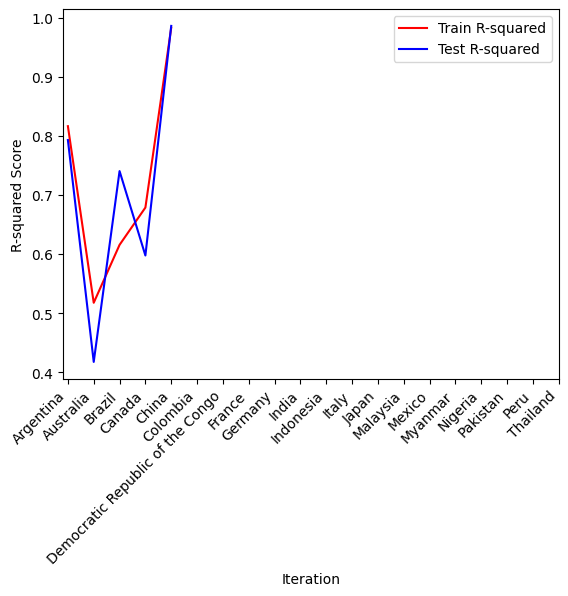

Colombia: Train R-squared score - 0.5, Test R-squared score - 0.57


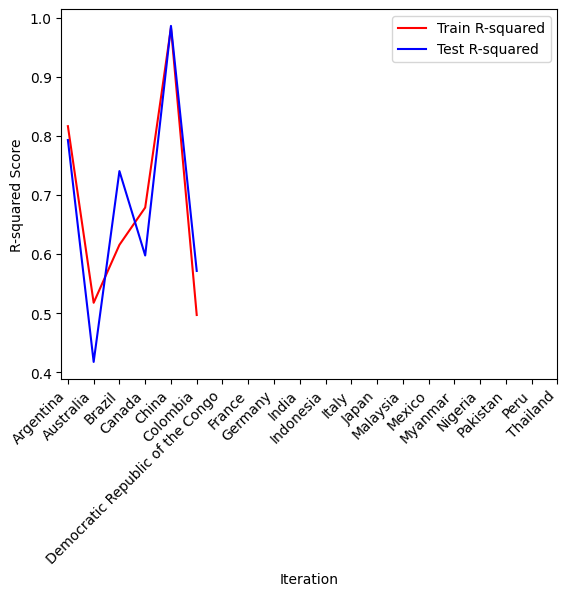

Democratic Republic of the Congo: Train R-squared score - 0.79, Test R-squared score - 0.87


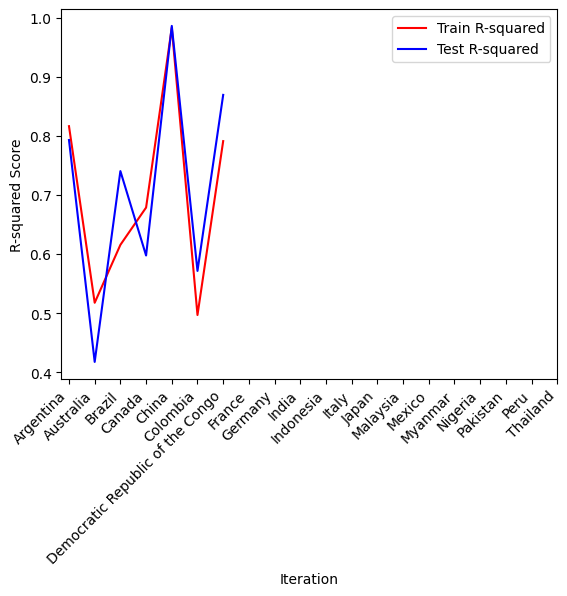

France: Train R-squared score - 0.78, Test R-squared score - 0.72


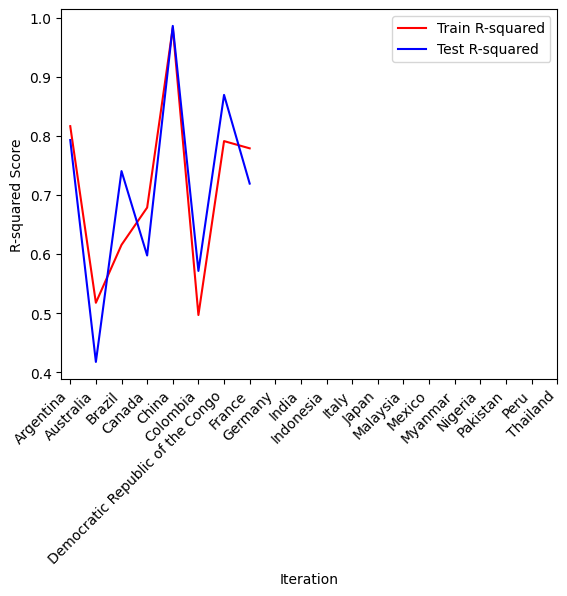

Germany: Train R-squared score - 0.54, Test R-squared score - 0.4


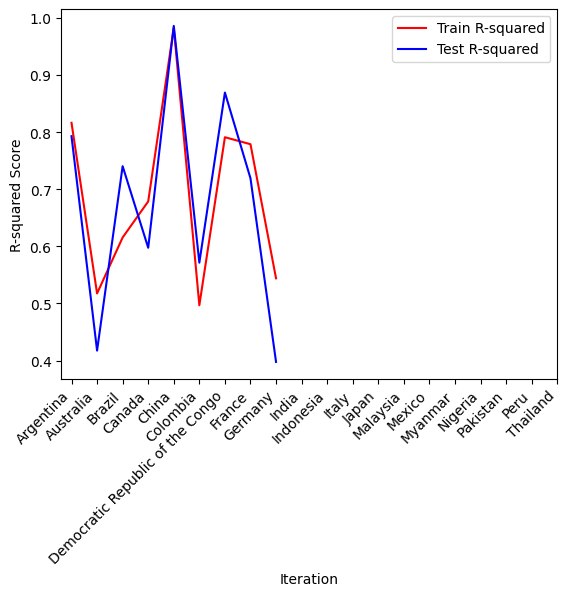

India: Train R-squared score - 0.96, Test R-squared score - 0.97


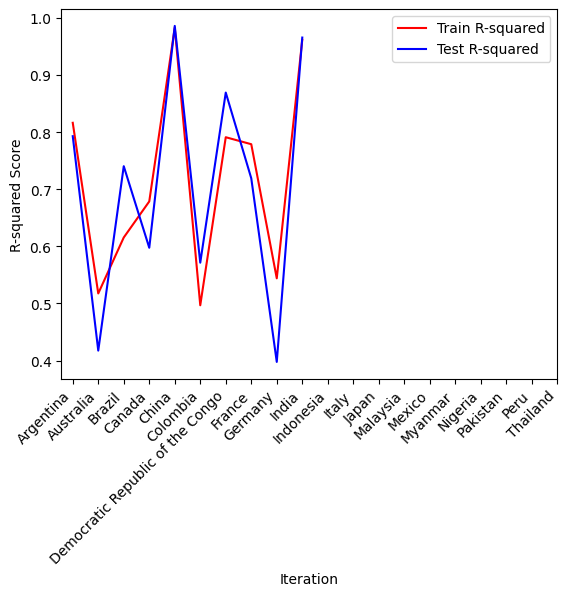

Indonesia: Train R-squared score - 0.02, Test R-squared score - 0.12


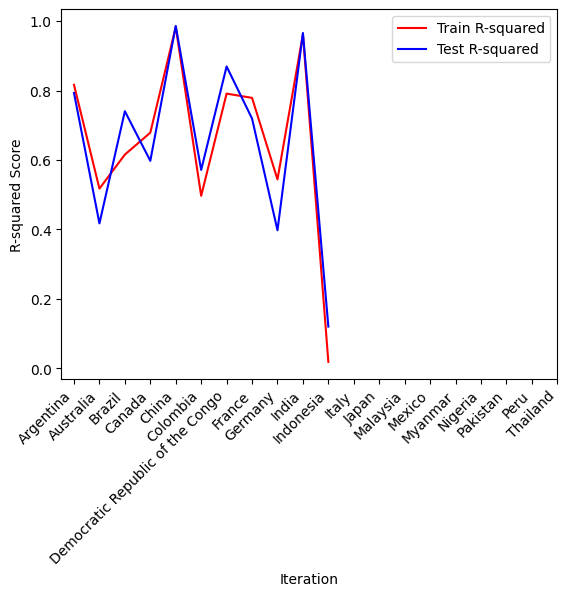

Italy: Train R-squared score - 0.58, Test R-squared score - 0.37


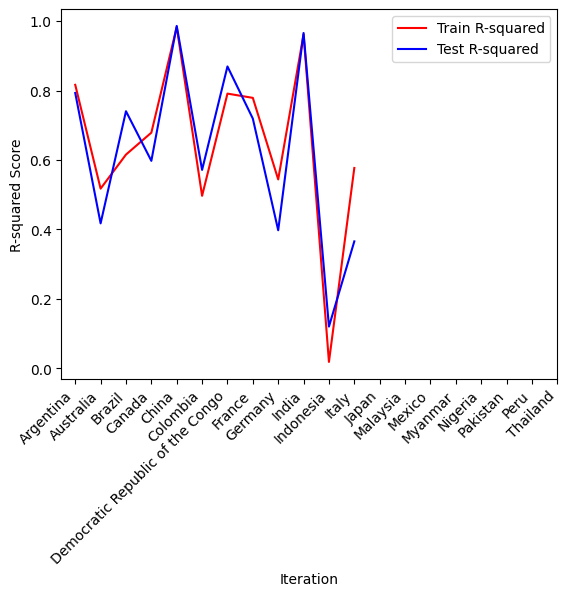

Japan: Train R-squared score - 0.82, Test R-squared score - 0.89


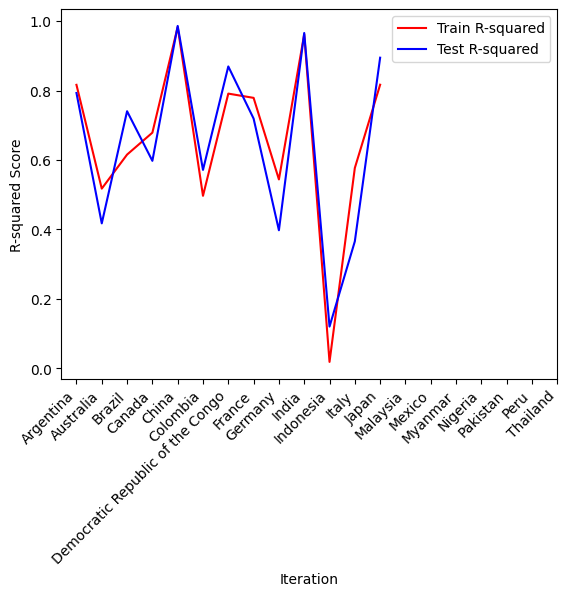

Malaysia: Train R-squared score - 0.22, Test R-squared score - 0.38


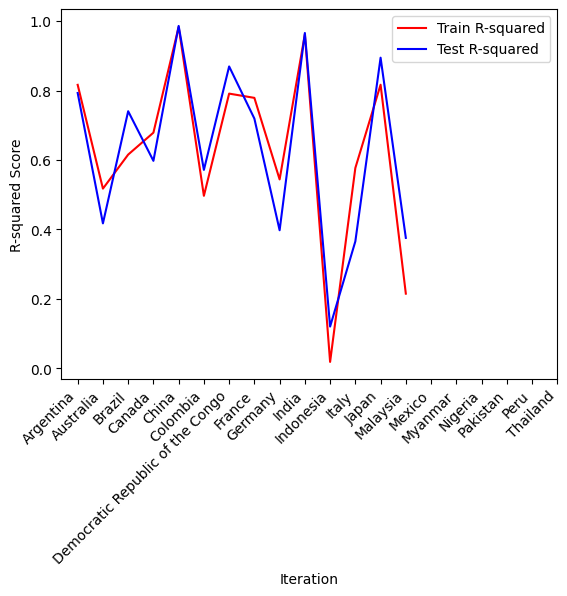

Mexico: Train R-squared score - 0.74, Test R-squared score - 0.7


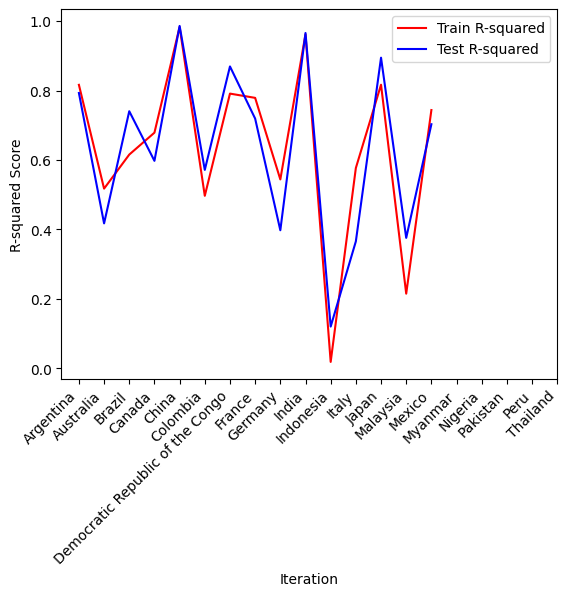

Myanmar: Train R-squared score - 0.03, Test R-squared score - 0.07


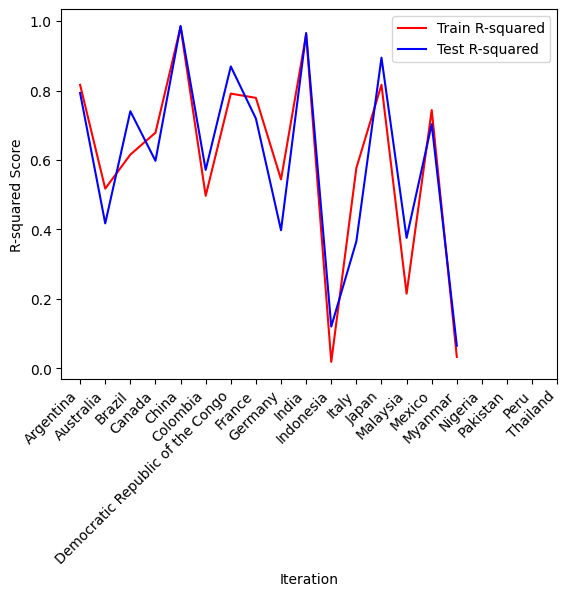

Nigeria: Train R-squared score - 0.85, Test R-squared score - 0.83


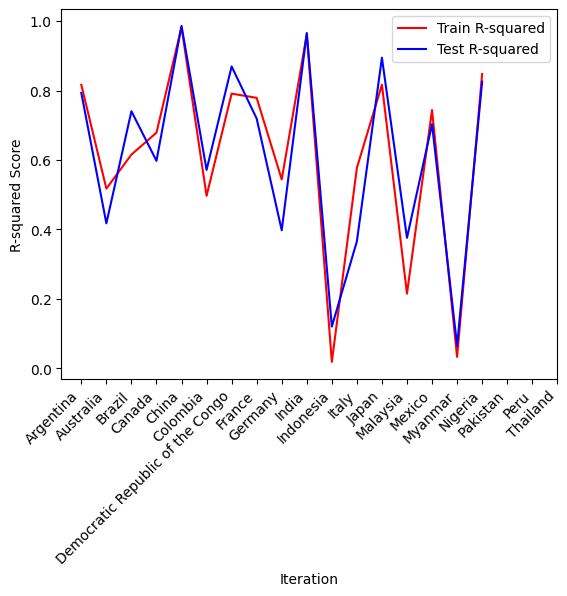

Pakistan: Train R-squared score - 0.99, Test R-squared score - 0.99


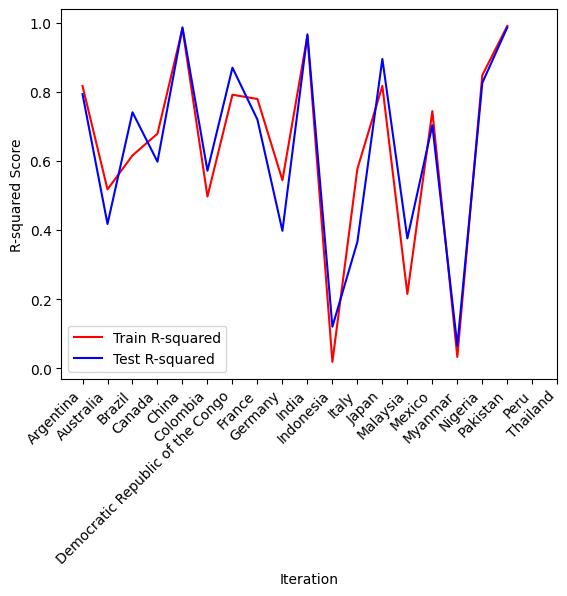

Peru: Train R-squared score - 0.91, Test R-squared score - 0.95


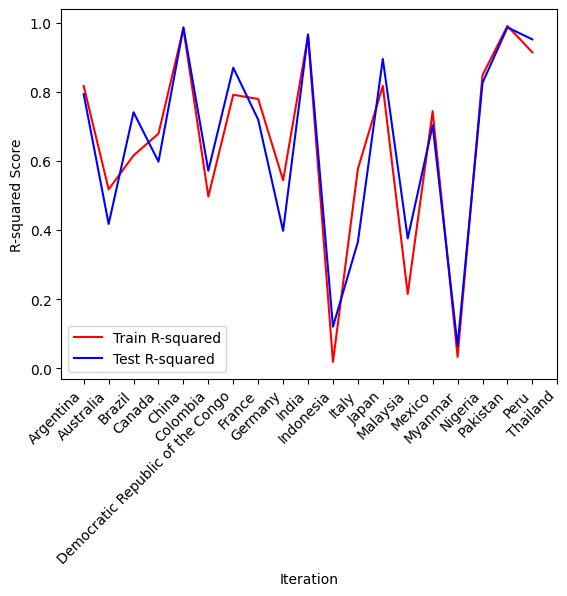

Thailand: Train R-squared score - 0.81, Test R-squared score - 0.83


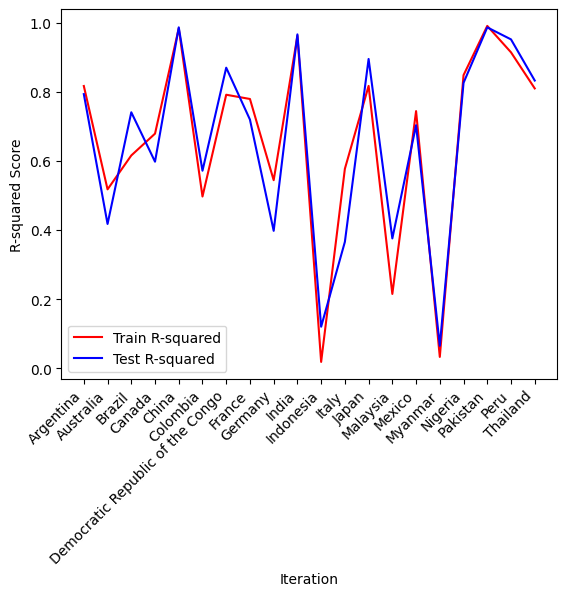

In [ ]:
chunk_size = 31
total_iterations = 20

train_scores = []
test_scores = []

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size

    x_var = df1_top["Year"].iloc[start_index:end_index]
    y_var = df1_top["total_emission"].iloc[start_index:end_index]

    country_name = df1_top["Area"].iloc[start_index]

    x_var = x_var.to_numpy().reshape(-1, 1)
    y_var = y_var.to_numpy().reshape(-1, 1)

    # Create polynomial features
    degree = 5
    poly_features = PolynomialFeatures(degree=degree)
    x_poly = poly_features.fit_transform(x_var)

    # Split data into train and test sets (70% train, 30% test)
    x_train, x_test, y_train, y_test = train_test_split(x_poly, y_var, test_size=0.3, random_state=42)

    # Train model on the training set
    model = LinearRegression()
    model.fit(x_train, y_train)

    # Predictions on both training and test sets
    y_pred_train = model.predict(x_train)
    y_pred_test = model.predict(x_test)

    # Compute R-squared scores for both training and test sets
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)

    print(f'{country_name}: Train R-squared score - {round(r2_train, 2)}, Test R-squared score - {round(r2_test, 2)}')

    train_scores.append(r2_train)
    test_scores.append(r2_test)

    # Plot the R-squared scores for train and test sets
    plt.plot(train_scores, 'red', label='Train R-squared')
    plt.plot(test_scores, 'blue', label='Test R-squared')
    plt.xlabel("Iteration")
    plt.ylabel("R-squared Score")
    plt.xticks(range(total_iterations), [df1_top["Area"].iloc[i * chunk_size] for i in range(total_iterations)], rotation=45, ha='right')
    plt.legend()
    plt.show()


<function matplotlib.pyplot.show(close=None, block=None)>

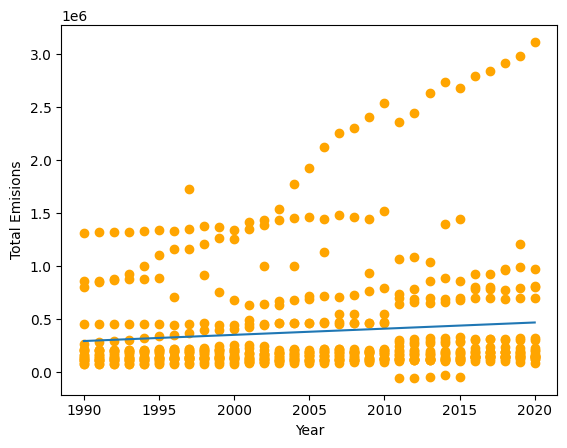

In [ ]:
indp = df1_top['Year']
dep = df1_top['total_emission']

m, b = np.polyfit(indp, dep, 1)

plt.plot(indp, m*indp + b)

plt.scatter(indp, dep, color='orange')
plt.xlabel('Year')
plt.ylabel('Total Emisions')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

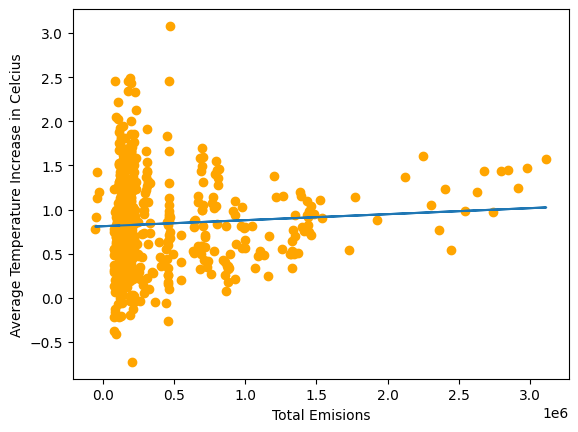

In [ ]:
indp = df1_top['total_emission']
dep = df1_top['Average Temperature °C']

m, b = np.polyfit(indp, dep, 1)

plt.plot(indp, m*indp + b)

plt.scatter(indp, dep, color='orange')
plt.xlabel('Total Emisions')
plt.ylabel('Average Temperature Increase in Celcius')
plt.show

#Random Forest Regression

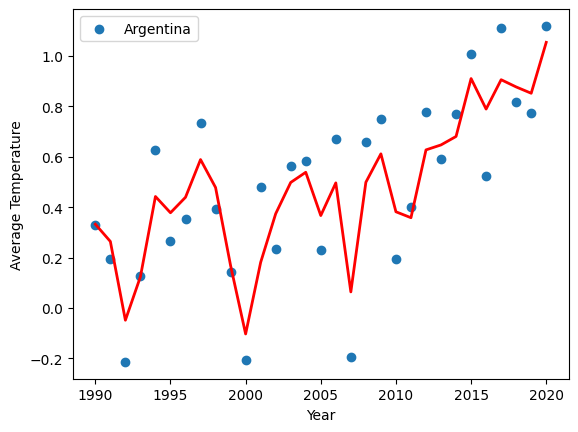

R-squared scores: 0.84


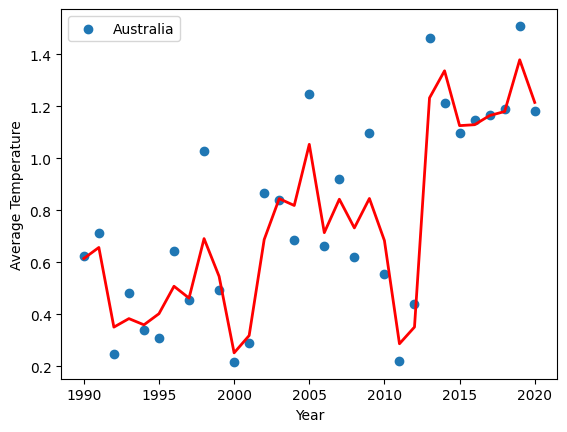

R-squared scores: 0.9


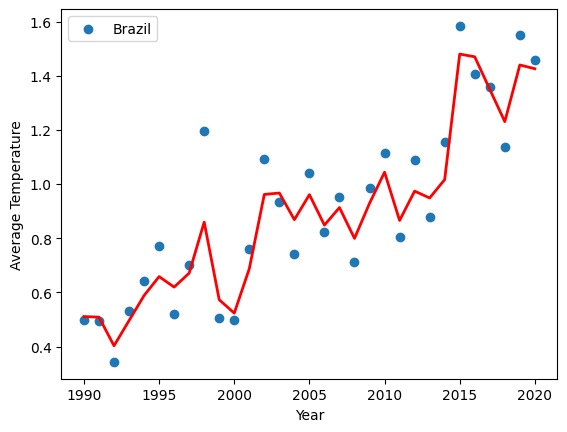

R-squared scores: 0.92


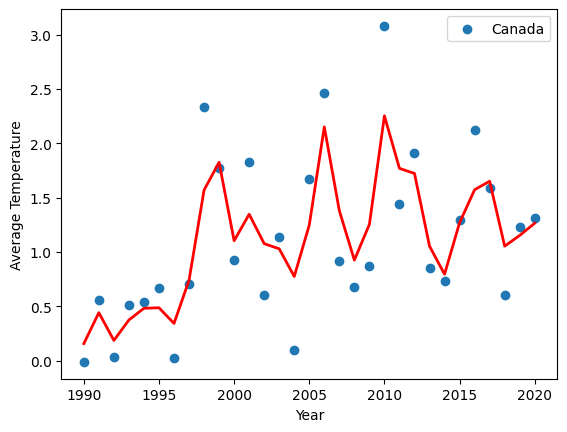

R-squared scores: 0.78


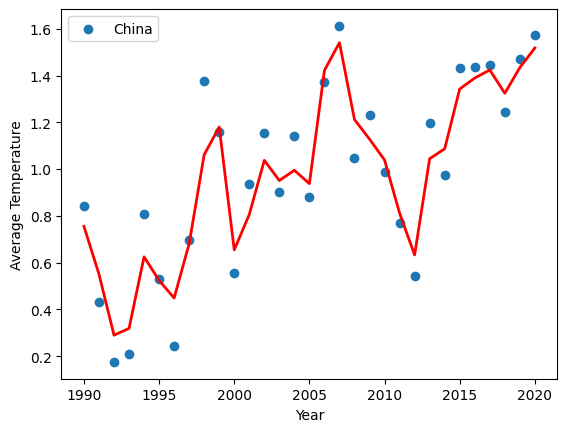

R-squared scores: 0.92


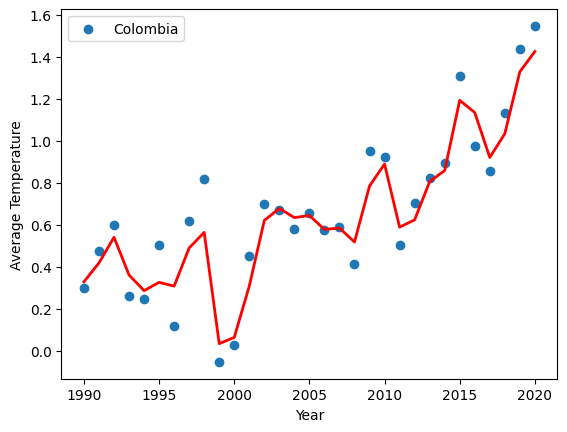

R-squared scores: 0.92


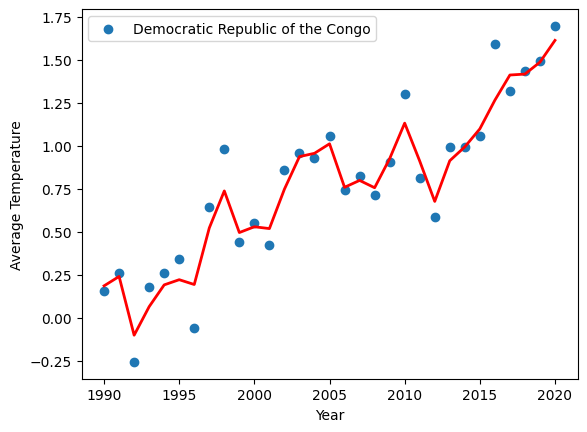

R-squared scores: 0.94


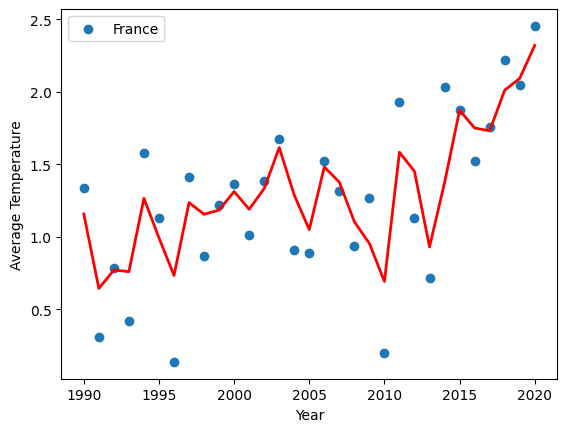

R-squared scores: 0.78


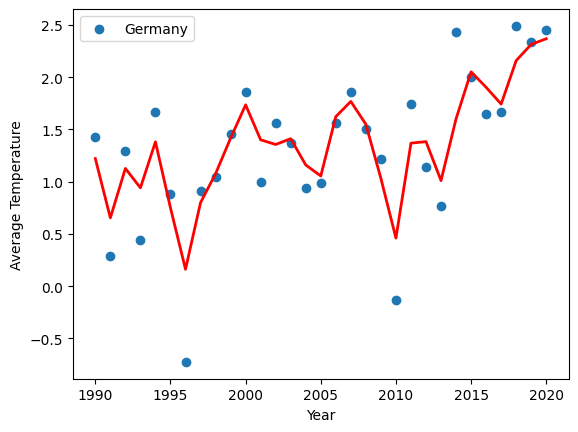

R-squared scores: 0.8


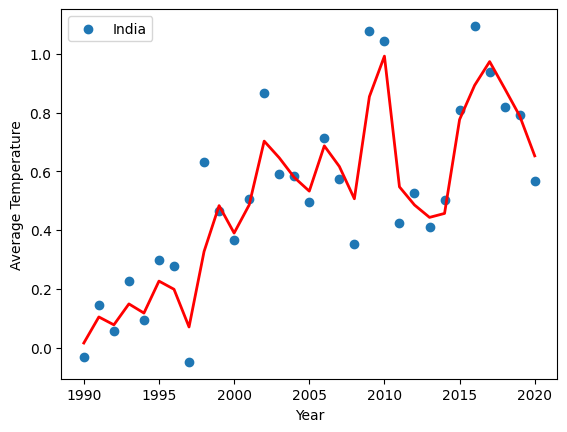

R-squared scores: 0.89


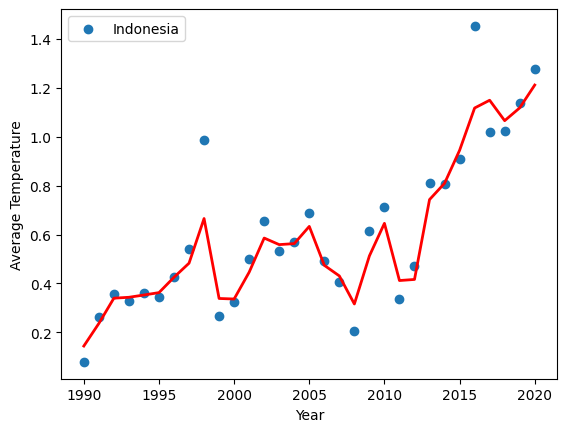

R-squared scores: 0.91


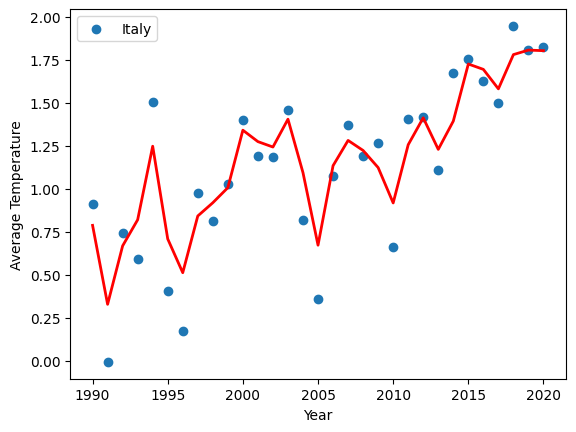

R-squared scores: 0.88


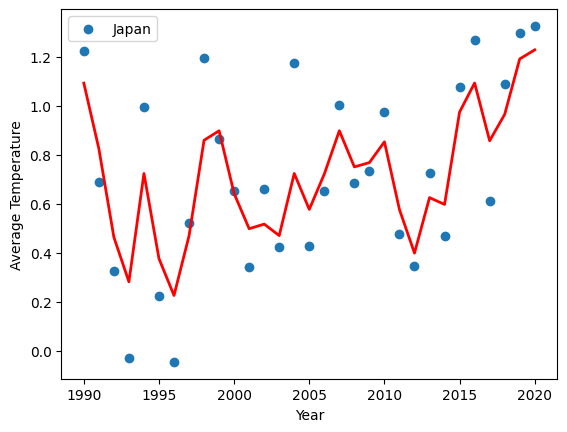

R-squared scores: 0.79


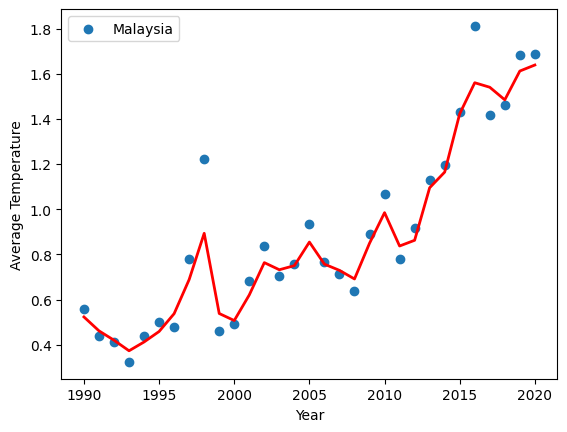

R-squared scores: 0.95


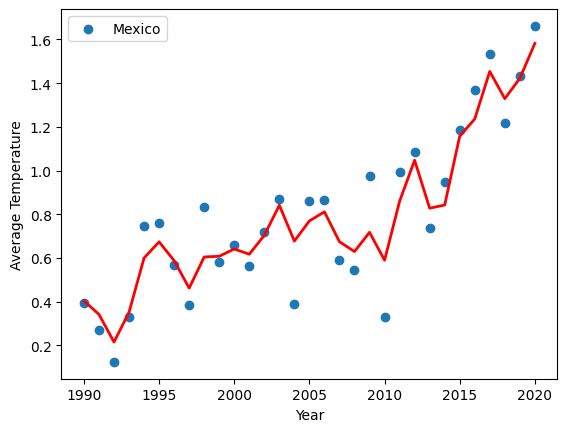

R-squared scores: 0.9


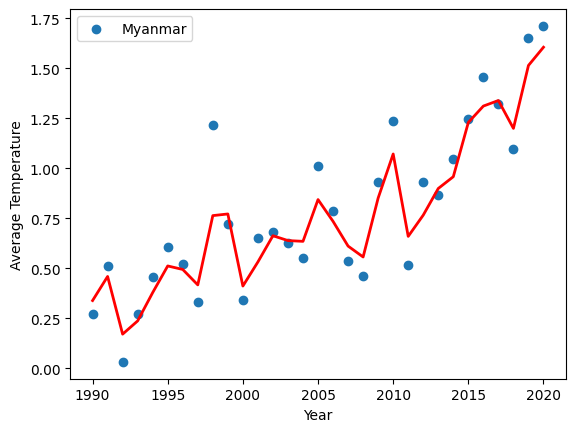

R-squared scores: 0.91


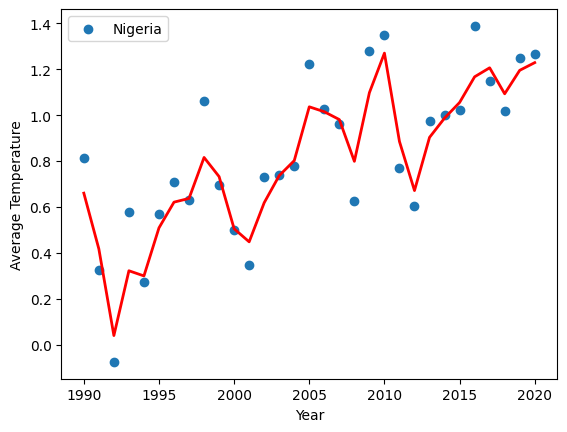

R-squared scores: 0.89


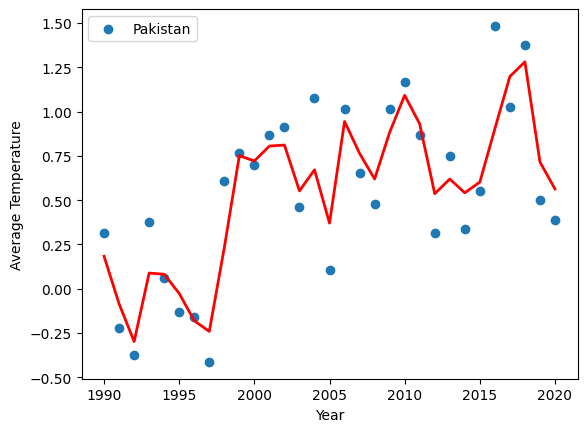

R-squared scores: 0.84


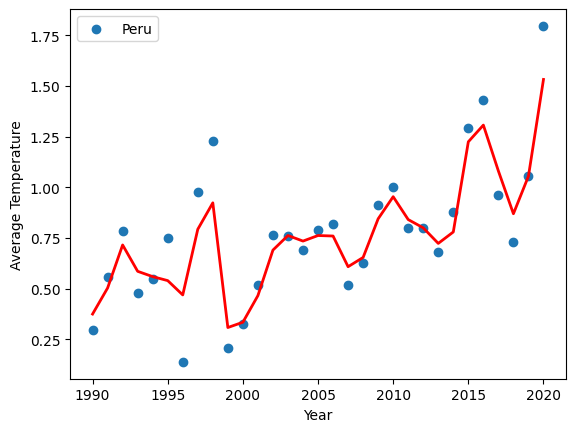

R-squared scores: 0.87


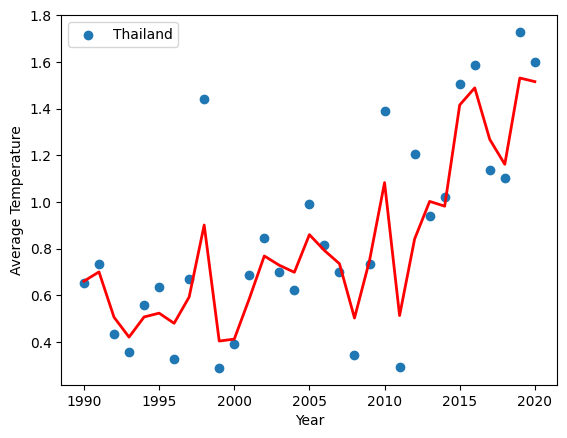

R-squared scores: 0.85


In [ ]:
# Without splitting the data
##Average temp over years
chunk_size = 31

total_iterations = 20

#country_info1 = {}

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size

    x_var = df1_top["Year"].iloc[start_index:end_index]
    y_var = df1_top["Average Temperature °C"].iloc[start_index:end_index]

    country_name = df1_top["Area"].iloc[start_index]

    x_var = x_var.to_numpy().reshape(-1, 1)

    # Fitting Random Forest Regression to the dataset
    regressor = RandomForestRegressor(n_estimators=10, random_state=0, oob_score=True)

    # Fit the regressor with x and y data
    regressor.fit(x_var, y_var)
    y_pred = regressor.predict(x_var)

    # Plot scatterplot
    plt.scatter(x_var, y_var, label=country_name)

    # Plot regression line
    plt.plot(x_var, y_pred, color='red', linewidth=2)

    # Label axes
    plt.xlabel("Year")
    plt.ylabel("Average Temperature")

    plt.legend()

    plt.show()
    #good r^z values
    r2 = r2_score(y_var, y_pred)
    print('R-squared scores:', round(r2, 2))


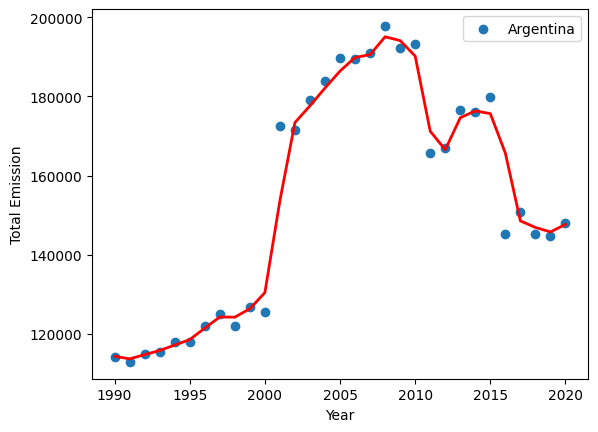

R-squared scores: 0.97


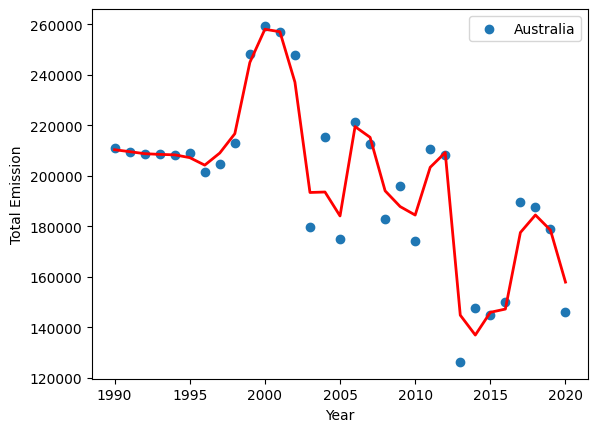

R-squared scores: 0.94


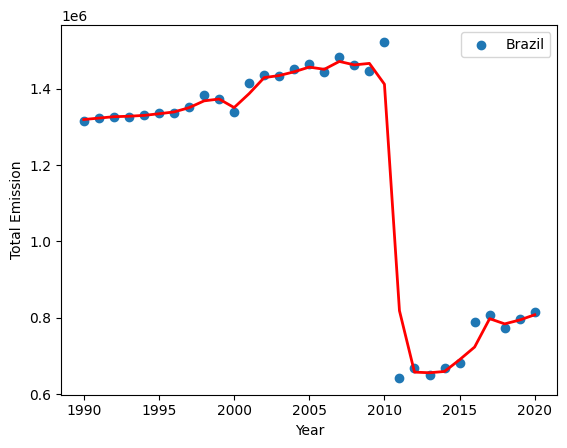

R-squared scores: 0.98


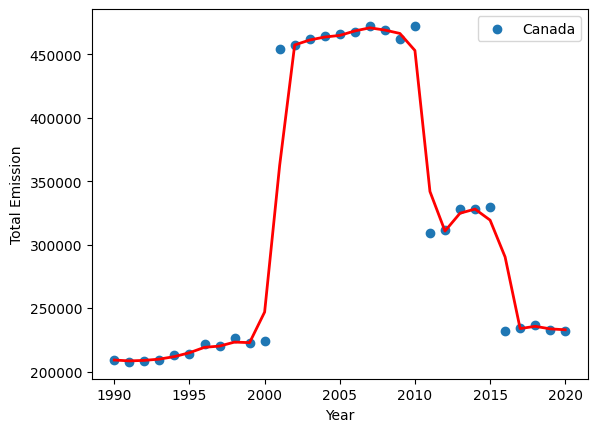

R-squared scores: 0.96


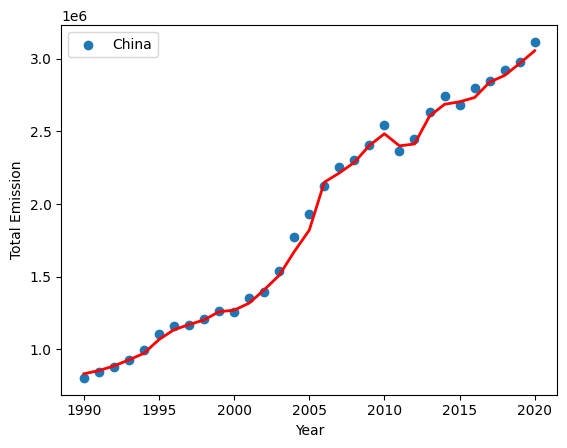

R-squared scores: 1.0


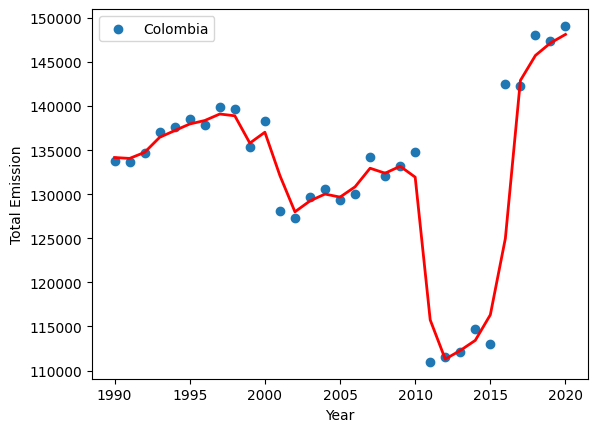

R-squared scores: 0.88


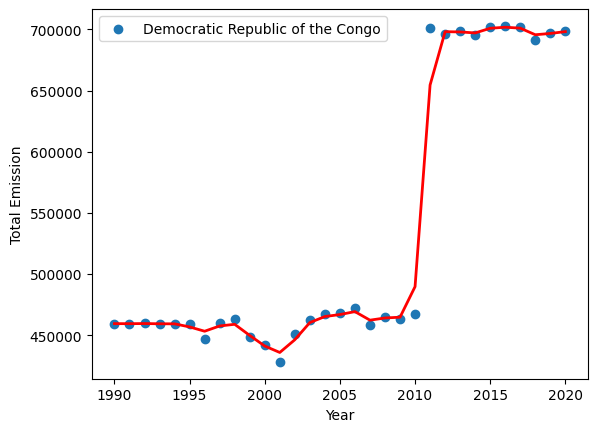

R-squared scores: 0.99


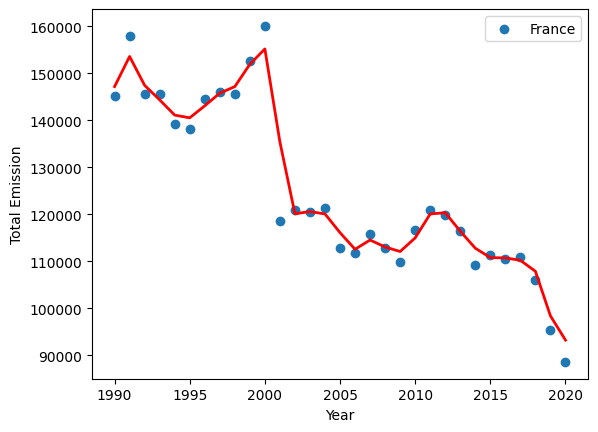

R-squared scores: 0.96


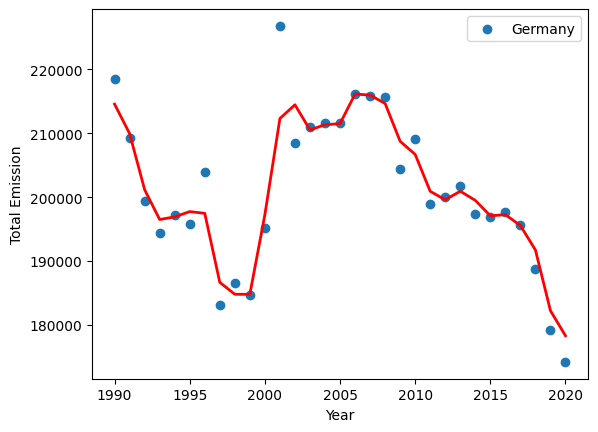

R-squared scores: 0.91


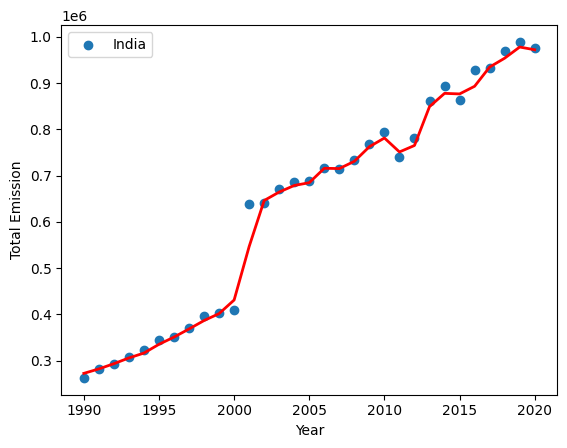

R-squared scores: 0.99


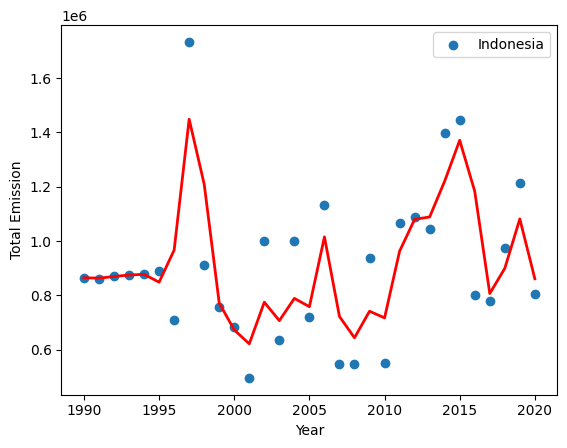

R-squared scores: 0.69


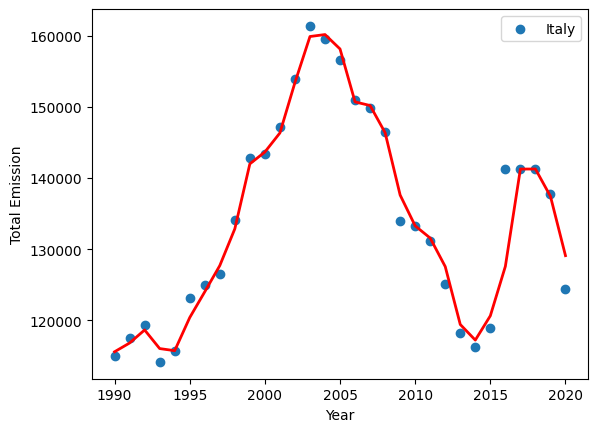

R-squared scores: 0.96


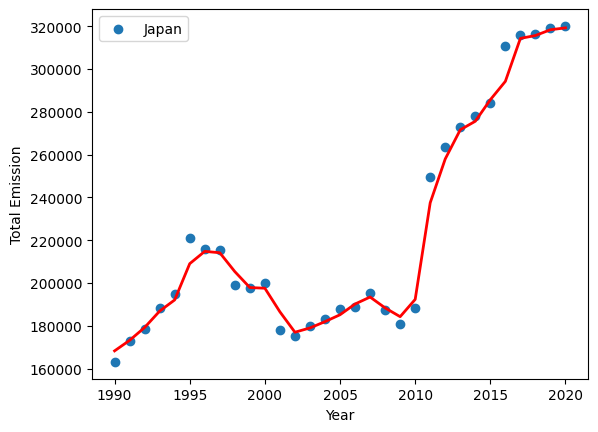

R-squared scores: 0.99


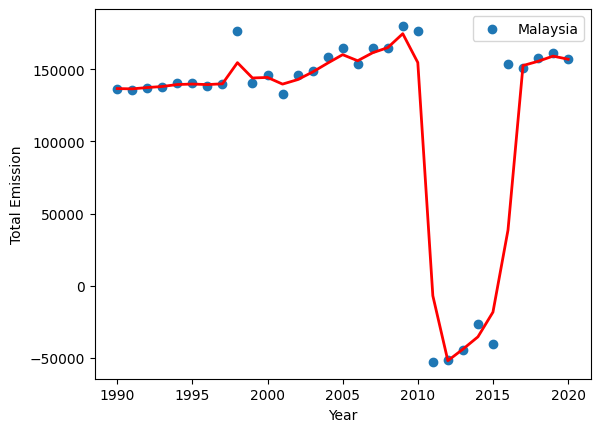

R-squared scores: 0.9


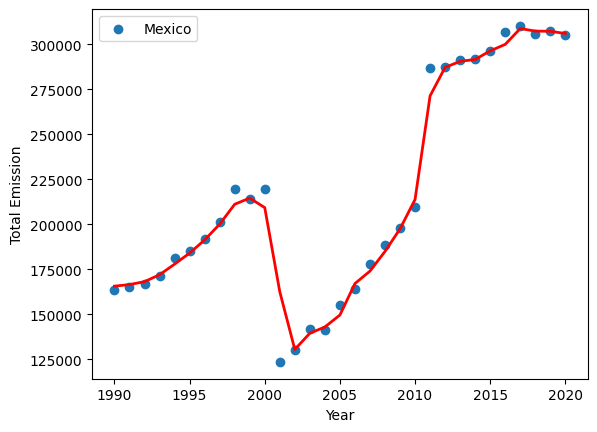

R-squared scores: 0.98


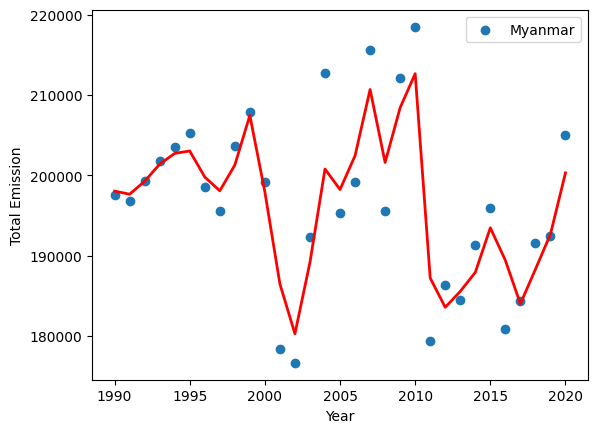

R-squared scores: 0.84


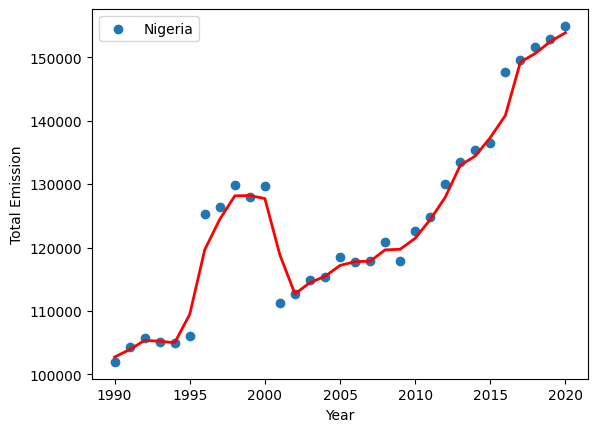

R-squared scores: 0.98


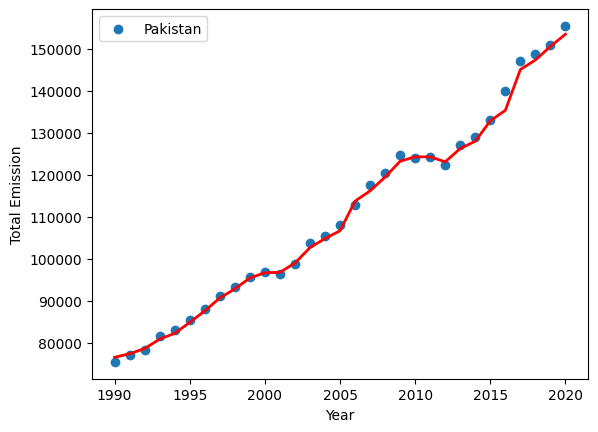

R-squared scores: 1.0


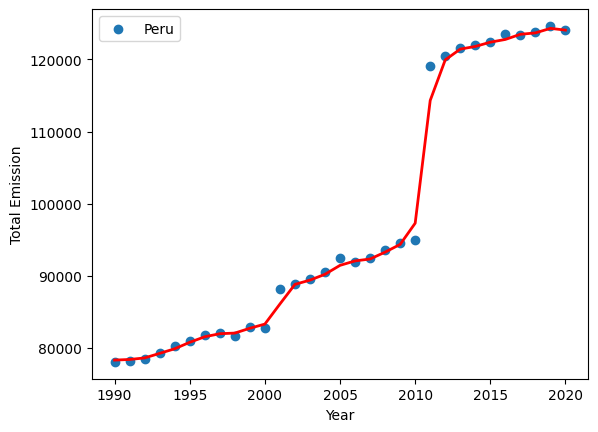

R-squared scores: 1.0


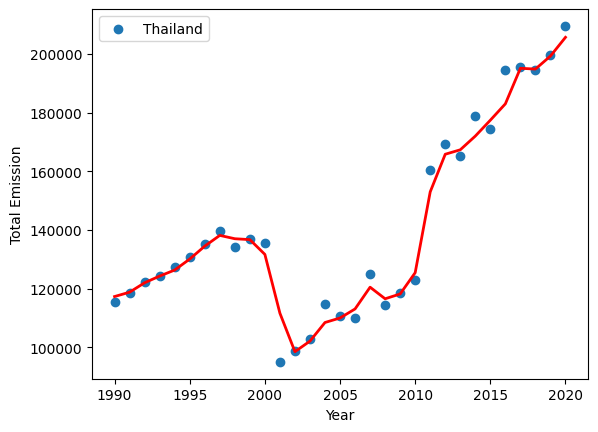

R-squared scores: 0.98


In [ ]:
#Without splitting the data
#Emissions over years
chunk_size = 31

total_iterations = 20

#country_info1 = {}

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size

    x_var = df1_top["Year"].iloc[start_index:end_index]
    y_var = df1_top["total_emission"].iloc[start_index:end_index]

    country_name = df1_top["Area"].iloc[start_index]

    x_var = x_var.to_numpy().reshape(-1, 1)

    # Fitting Random Forest Regression to the dataset
    regressor = RandomForestRegressor(n_estimators=10, random_state=0, oob_score=True)

    # Fit the regressor with x and y data
    regressor.fit(x_var, y_var)
    y_pred = regressor.predict(x_var)

    # Plot scatterplot
    plt.scatter(x_var, y_var, label=country_name)

    # Plot regression line
    plt.plot(x_var, y_pred, color='red', linewidth=2)

    # Label axes
    plt.xlabel("Year")
    plt.ylabel("Total Emission")

    plt.legend()

    plt.show()
    r2 = r2_score(y_var, y_pred)
    print('R-squared scores:', round(r2, 2))

Train Score: 0.47 Test Score: -1.16
Train Score: 0.67 Test Score: -0.61
Train Score: 0.43 Test Score: -2.56
Train Score: 0.49 Test Score: -0.21
Train Score: 0.28 Test Score: -0.09
Train Score: 0.65 Test Score: -0.46
Train Score: 0.76 Test Score: -4.98
Train Score: 0.46 Test Score: -0.19
Train Score: 0.78 Test Score: -3.88
Train Score: 0.74 Test Score: -0.19
Train Score: 0.55 Test Score: -0.02
Train Score: 0.52 Test Score: -0.11
Train Score: 0.32 Test Score: -0.89
Train Score: 0.43 Test Score: -1.19
Train Score: 0.45 Test Score: -11.81
Train Score: 0.37 Test Score: -0.2
Train Score: 0.48 Test Score: -0.04
Train Score: 0.72 Test Score: -4.38
Train Score: 0.34 Test Score: 0.12
Train Score: 0.29 Test Score: -0.2


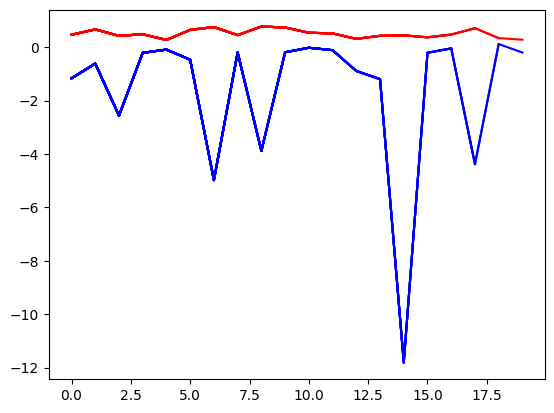

In [ ]:
##train and test scores
#for Emissions over years

chunk_size = 31

total_iterations = 20

#country_info1 = {}

train_scores=[]
test_scores=[]

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size


    x_train = df1_train["Year"].iloc[start_index:end_index]
    x_train = x_train.to_numpy().reshape(-1, 1)

    y_train= df1_train["total_emission"].iloc[start_index:end_index]

    x_test = df1_test["Year"].iloc[start_index:end_index]
    x_test = x_test.to_numpy().reshape(-1, 1)

    y_test= df1_test["total_emission"].iloc[start_index:end_index]

    country_name = df1_common["Area"].iloc[start_index]

    # # Fit the regressor with x and y data
    regressor = RandomForestRegressor(n_estimators=100, max_depth = 4, random_state=0, oob_score=True, max_features='sqrt')
    regressor.fit(x_train, y_train)
    y_pred = regressor.predict(x_train)

    R2_train= r2_score(y_train, y_pred)

    # #test model

    y_test_pred = regressor.predict(x_test)
    R2_test= r2_score(y_test, y_test_pred)

    train_scores.append(R2_train)
    test_scores.append(R2_test)

    print("Train Score:",round(R2_train,2),"Test Score:",round(R2_test,2))

    plt.plot(train_scores, 'red', label='Train Score')
    plt.plot(test_scores, 'blue', label='Test Score')

Train Score: 0.47 Test Score: -1.16
index:  0
area:  Afghanistan


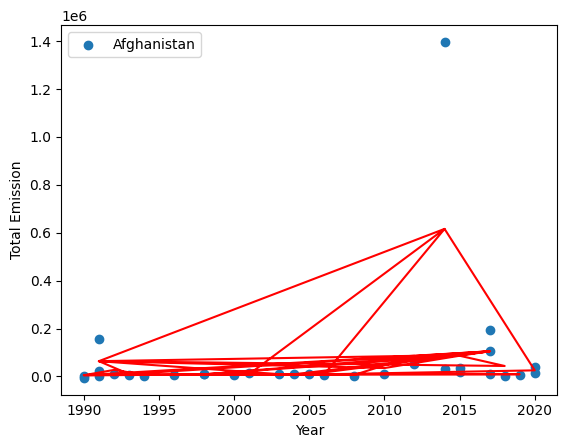

Train Score: 0.67 Test Score: -0.61
index:  31
area:  Albania


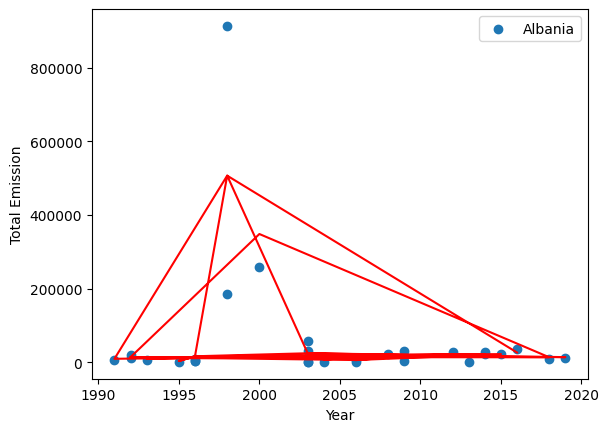

Train Score: 0.43 Test Score: -2.56
index:  62
area:  Algeria


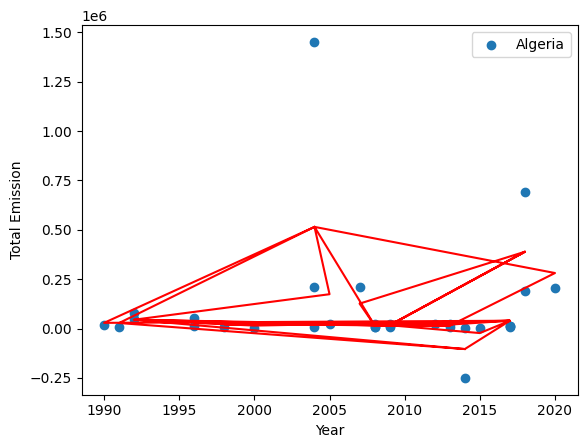

Train Score: 0.49 Test Score: -0.21
index:  93
area:  Andorra


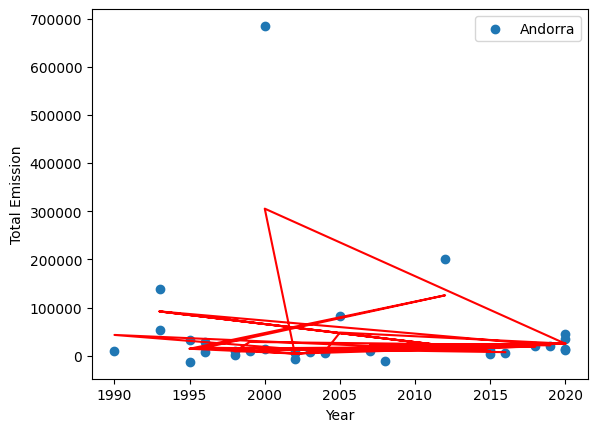

Train Score: 0.28 Test Score: -0.09
index:  124
area:  Angola


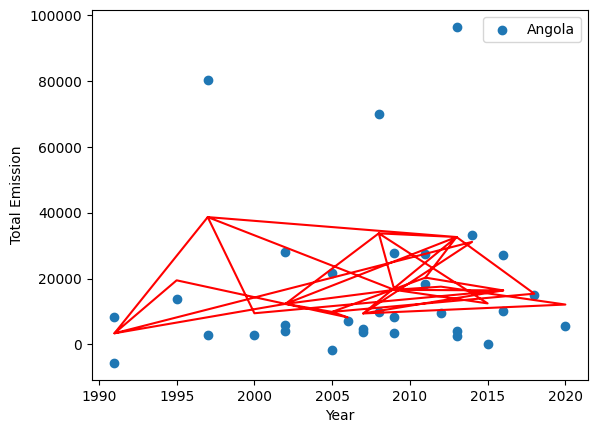

Train Score: 0.65 Test Score: -0.46
index:  155
area:  Antigua and Barbuda


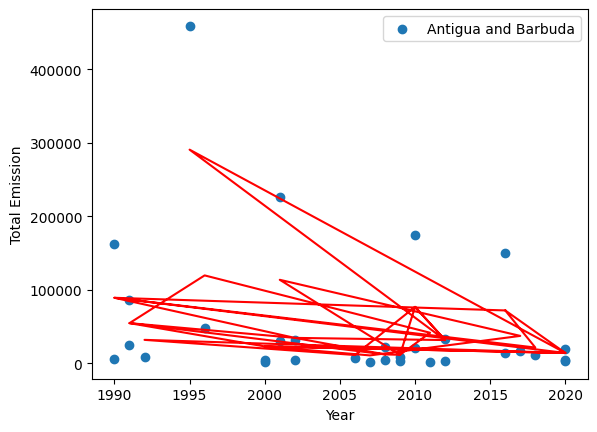

Train Score: 0.76 Test Score: -4.98
index:  186
area:  Argentina


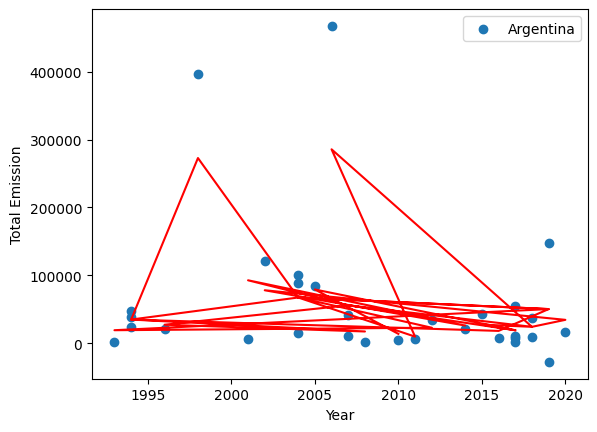

Train Score: 0.46 Test Score: -0.19
index:  217
area:  Armenia


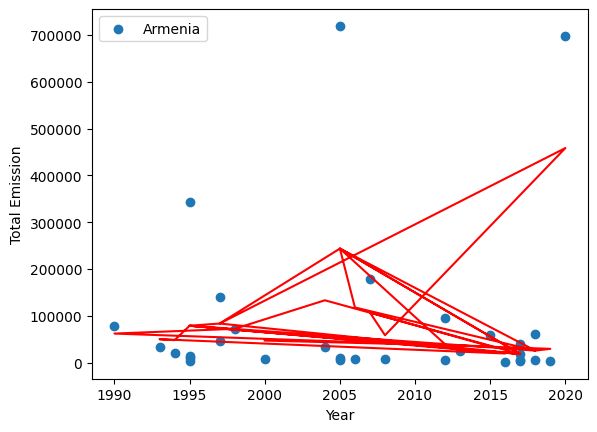

Train Score: 0.78 Test Score: -3.88
index:  248
area:  Australia


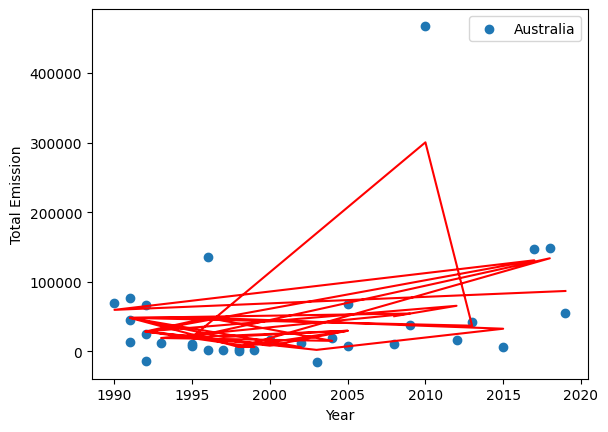

Train Score: 0.74 Test Score: -0.19
index:  279
area:  Austria


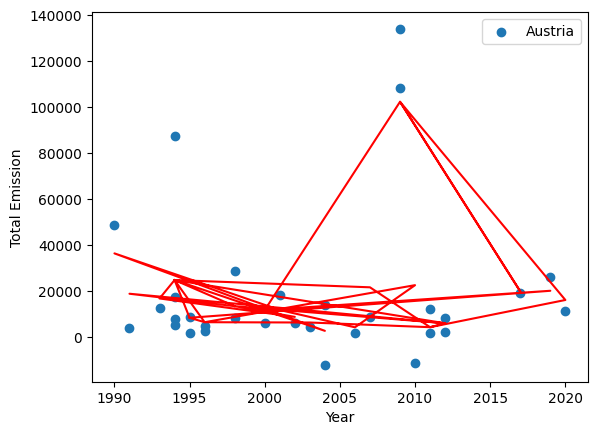

Train Score: 0.55 Test Score: -0.02
index:  310
area:  Azerbaijan


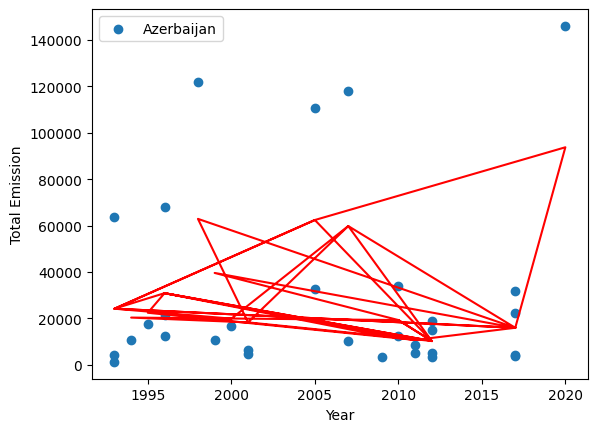

Train Score: 0.52 Test Score: -0.11
index:  341
area:  Bahrain


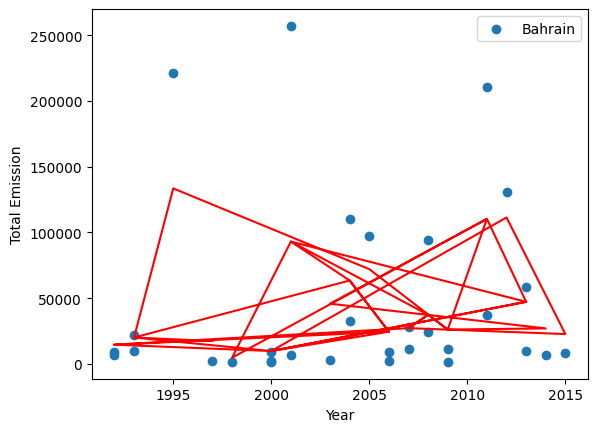

Train Score: 0.32 Test Score: -0.89
index:  372
area:  Bangladesh


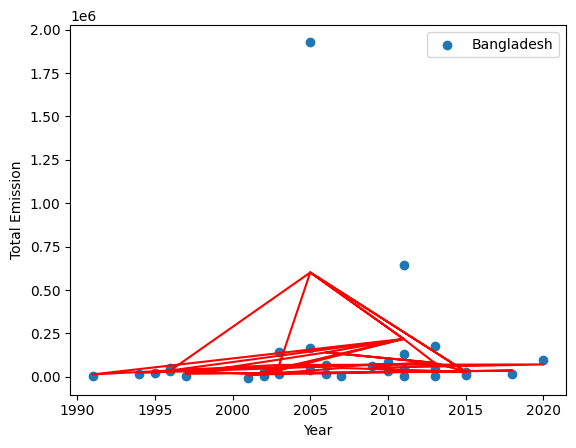

Train Score: 0.43 Test Score: -1.19
index:  403
area:  Barbados


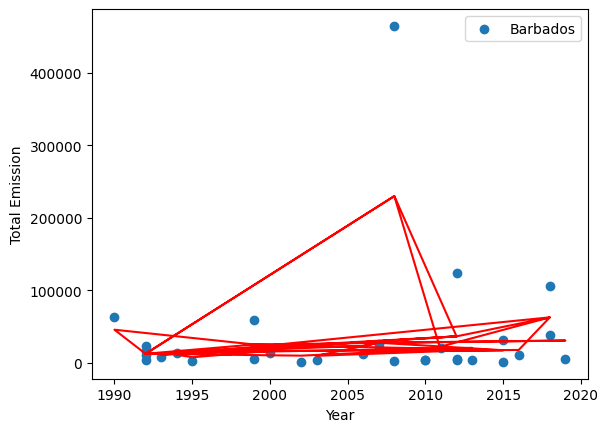

Train Score: 0.45 Test Score: -11.81
index:  434
area:  Belarus


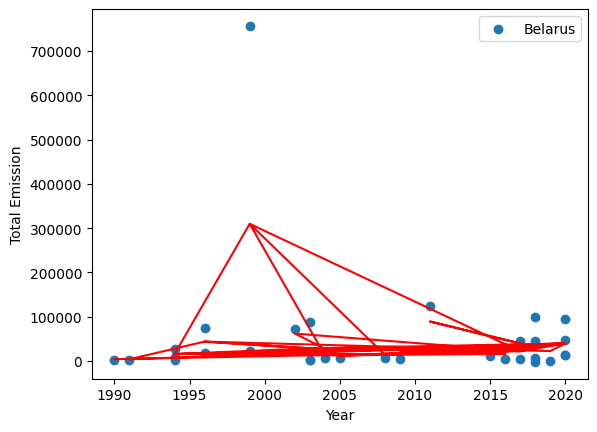

Train Score: 0.37 Test Score: -0.2
index:  465
area:  Belgium


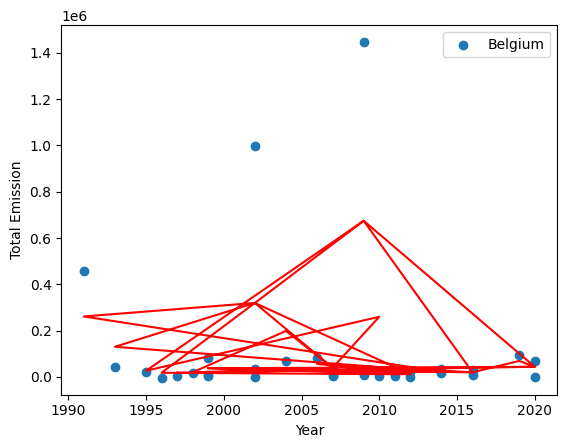

Train Score: 0.48 Test Score: -0.04
index:  496
area:  Belize


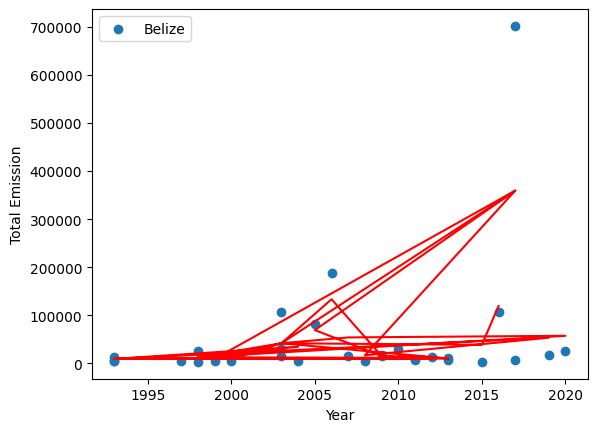

Train Score: 0.72 Test Score: -4.38
index:  527
area:  Benin


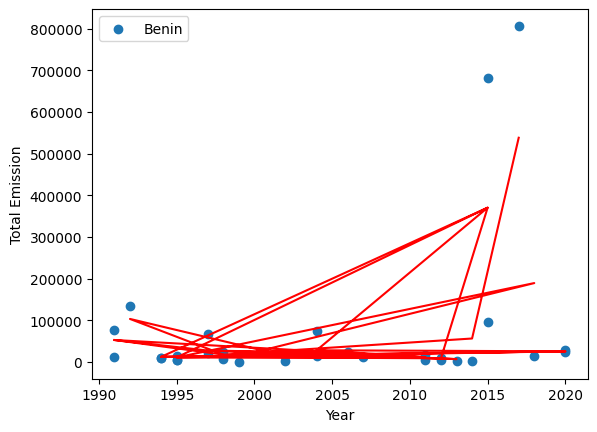

Train Score: 0.34 Test Score: 0.12
index:  558
area:  Bhutan


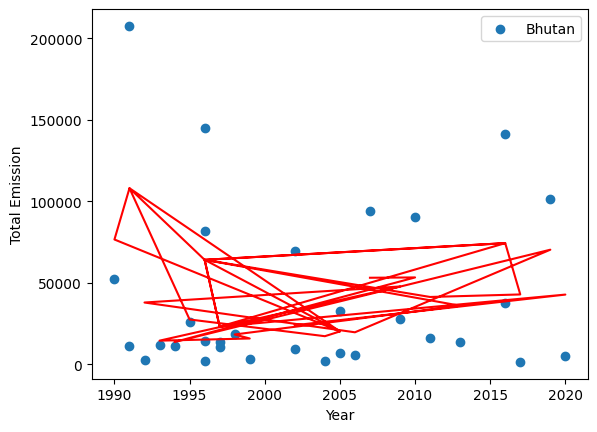

Train Score: 0.29 Test Score: -0.2
index:  589
area:  Bosnia and Herzegovina


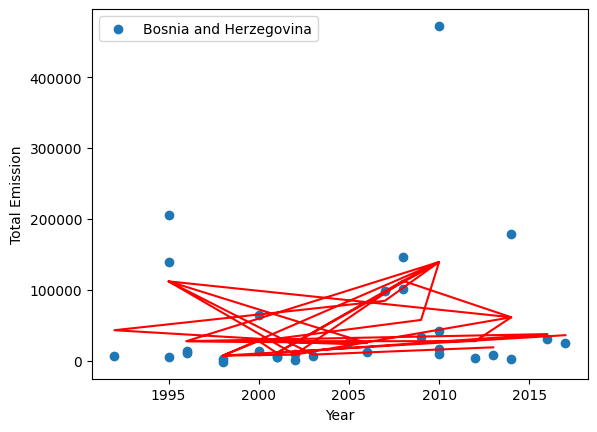

In [ ]:
##Emissions over years

chunk_size = 31

total_iterations = 20

#country_info1 = {}

train_scores=[]
test_scores=[]

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size
    x_train =df1_train["Year"].iloc[start_index:end_index]
    # print(x_train.shape)

    x_train=x_train.to_numpy().reshape(-1,1)

    y_train= df1_train["total_emission"].iloc[start_index:end_index]
    # y_train=y_train.to_numpy().reshape(-1, 1)
    #add more predictor variables
    x_test = df1_test["Year"].iloc[start_index:end_index]
    x_test=x_test.to_numpy().reshape(-1,1)


    y_test= df1_test["total_emission"].iloc[start_index:end_index]
    # y_test=y_test.to_numpy().reshape(-1, 1)

    country_name = df1_common["Area"].iloc[start_index]

    # # Fit the regressor with x and y data
    regressor = RandomForestRegressor(n_estimators=100, max_depth = 4, random_state=0, oob_score=True, max_features='sqrt')
    # regressor.fit(x_train, y_train)
    regressor.fit(x_train, y_train)
    # y_pred = regressor.predict(x_train)
    y_pred = regressor.predict(x_train)

    R2_train= r2_score(y_train, y_pred)

    # #test model

    y_test_pred = regressor.predict(x_test)
    R2_test= r2_score(y_test, y_test_pred)

    train_scores.append(R2_train)
    test_scores.append(R2_test)

    print("Train Score:",round(R2_train,2),"Test Score:",round(R2_test,2))

    # Plot scatterplot
    print("index: ", start_index)
    print("area: ", df1_common["Area"].iloc[start_index])
    plt.scatter(x_train, y_train, label=df1_common["Area"].iloc[start_index])
    #maybe smth else than scatter
    # # Plot regression line
    plt.plot(x_train, y_pred, color='red')

    # # # Label axes
    plt.xlabel("Year")
    plt.ylabel("Total Emission")

    plt.legend()

    plt.show()

In [ ]:
#GridSearchCV for total_emissions
from sklearn.model_selection import GridSearchCV

parameters = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [1,2,3,4],
    'max_features': ['Auto','sqrt'],
    'random_state': [0,42],
    'oob_score': [True, False]
}


grid = GridSearchCV(estimator=regressor,
                    param_grid=parameters,
                    )

# Fit the model
grid.fit(x_test, y_train)

# Assess the score
print(grid.best_score_)
print(grid.best_params_)

-3.408263221979081
{'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 100, 'oob_score': True, 'random_state': 0}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
400 fits failed out of a total of 800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
400 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py", line 340, in fit
    self._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ut

R2_train 0.24194523545009927
R2_test 0.060015708969679116
R2_train 0.6018002565517726
R2_test -0.7588335931559538
R2_train 0.405043085959398
R2_test 0.3199936581718551
R2_train 0.5446734725084014
R2_test -0.017391765162200423
R2_train 0.6468862660510646
R2_test 0.2198818389558186
R2_train 0.5249836820542979
R2_test 0.18164638165183788
R2_train 0.4389408991381091
R2_test 0.22037795444322983
R2_train 0.5607924929218799
R2_test 0.20233458328410026
R2_train 0.5607457576649044
R2_test 0.2365957810350443
R2_train 0.6619422874141923
R2_test 0.41025549872518396
R2_train 0.5689650134290158
R2_test 0.1354151803995931
R2_train 0.42219268434274715
R2_test 0.43794231088418323
R2_train 0.37669525335979404
R2_test 0.06650244398599481
R2_train 0.3125882130195168
R2_test 0.2686480531385923
R2_train 0.5196352612871769
R2_test 0.11071689454452827
R2_train 0.6248196736111121
R2_test 0.4752711723809361
R2_train 0.6499144854496866
R2_test 0.043024424861665134
R2_train 0.4103135576470067
R2_test 0.2616929433

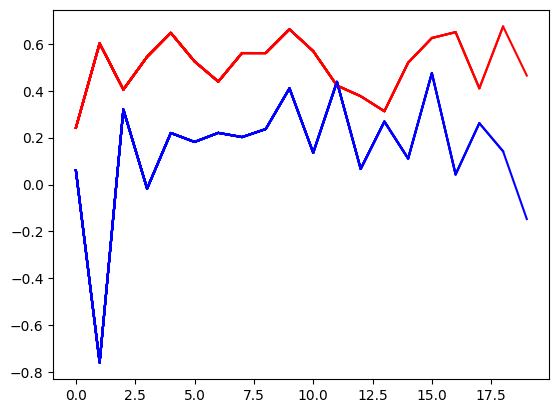

In [ ]:
#Train and test scores for temperature over years
chunk_size = 31

total_iterations = 20

#country_info1 = {}

train_scores=[]
test_scores=[]

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size
    x_train =df1_train["Year"].iloc[start_index:end_index]

    x_train=x_train.to_numpy().reshape(-1,1)

    y_train= df1_train["Average Temperature °C"].iloc[start_index:end_index]

    x_test = df1_test["Year"].iloc[start_index:end_index]
    x_test=x_test.to_numpy().reshape(-1,1)


    y_test= df1_test["Average Temperature °C"].iloc[start_index:end_index]

    country_name = df1_common["Area"].iloc[start_index]

    # # Fit the regressor with x and y data
    regressor1 = RandomForestRegressor(n_estimators=100, max_depth = 2, random_state=42)
    regressor1.fit(x_train, y_train)
    y_pred = regressor1.predict(x_train)

    R2_train= r2_score(y_train, y_pred)
    print("R2_train", R2_train)

    # #test model

    y_test_pred = regressor1.predict(x_test)
    R2_test= r2_score(y_test, y_test_pred)
    print("R2_test", R2_test)

    train_scores.append(R2_train)
    test_scores.append(R2_test)

    plt.plot(train_scores, 'red', label='Train Score')
    plt.plot(test_scores, 'blue', label='Test Score')

R2_train 0.24194523545009927
R2_test 0.060015708969679116
Train Score: 0.24 Test Score: 0.06
index:  0
area:  Afghanistan


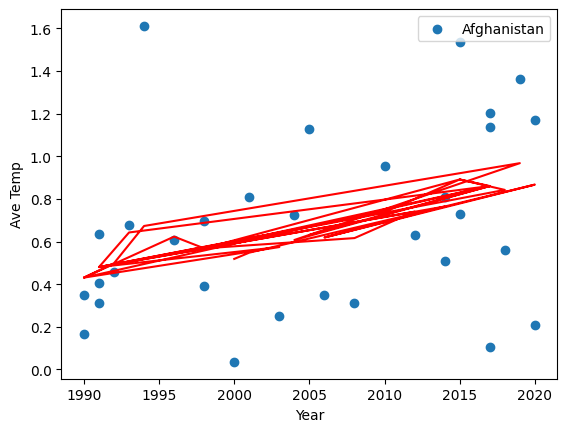

R2_train 0.6018002565517726
R2_test -0.7588335931559538
Train Score: 0.6 Test Score: -0.76
index:  31
area:  Albania


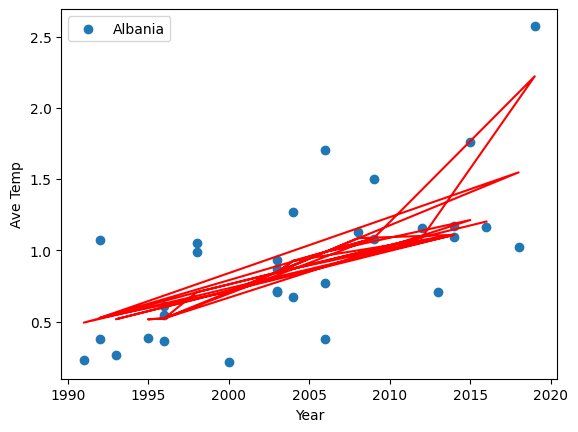

R2_train 0.405043085959398
R2_test 0.3199936581718551
Train Score: 0.41 Test Score: 0.32
index:  62
area:  Algeria


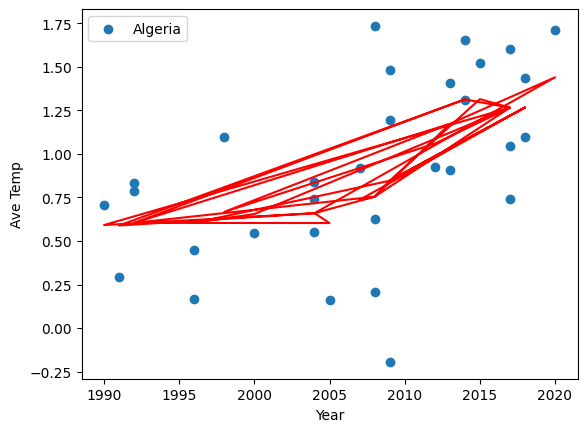

R2_train 0.5446734725084014
R2_test -0.017391765162200423
Train Score: 0.54 Test Score: -0.02
index:  93
area:  Andorra


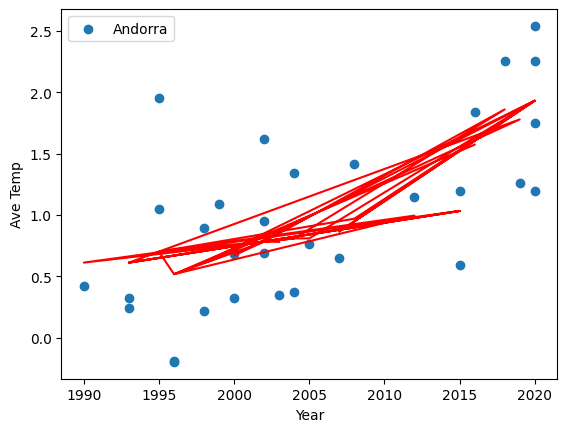

R2_train 0.6468862660510646
R2_test 0.2198818389558186
Train Score: 0.65 Test Score: 0.22
index:  124
area:  Angola


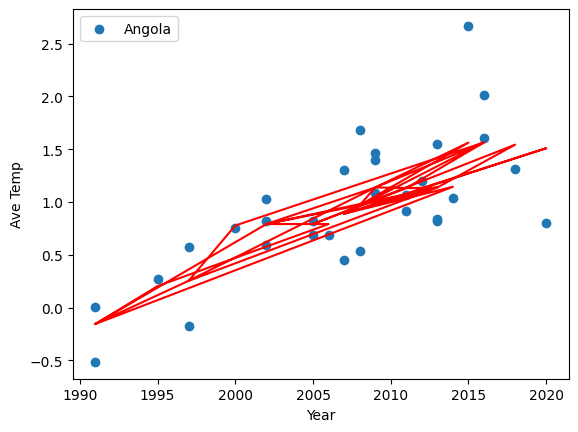

R2_train 0.5249836820542979
R2_test 0.18164638165183788
Train Score: 0.52 Test Score: 0.18
index:  155
area:  Antigua and Barbuda


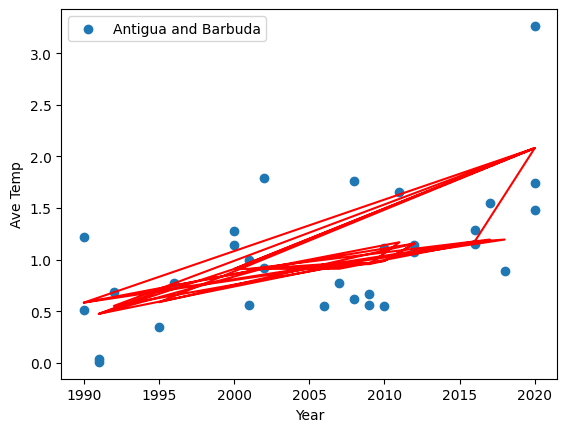

R2_train 0.4389408991381091
R2_test 0.22037795444322983
Train Score: 0.44 Test Score: 0.22
index:  186
area:  Argentina


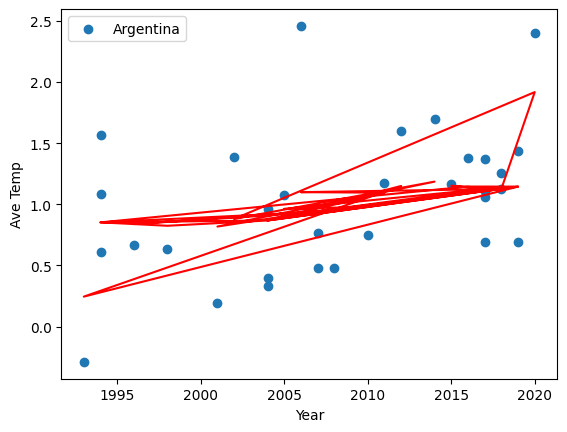

R2_train 0.5607924929218799
R2_test 0.20233458328410026
Train Score: 0.56 Test Score: 0.2
index:  217
area:  Armenia


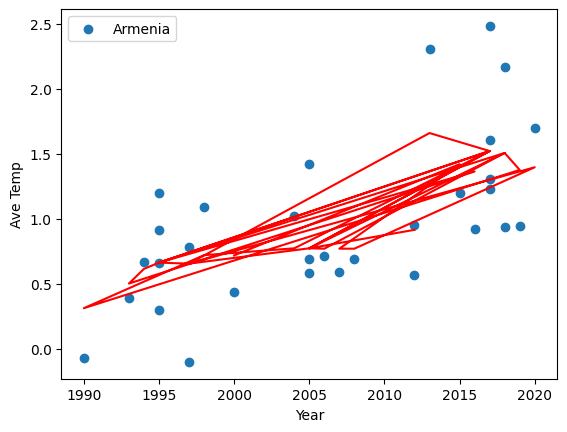

R2_train 0.5607457576649044
R2_test 0.2365957810350443
Train Score: 0.56 Test Score: 0.24
index:  248
area:  Australia


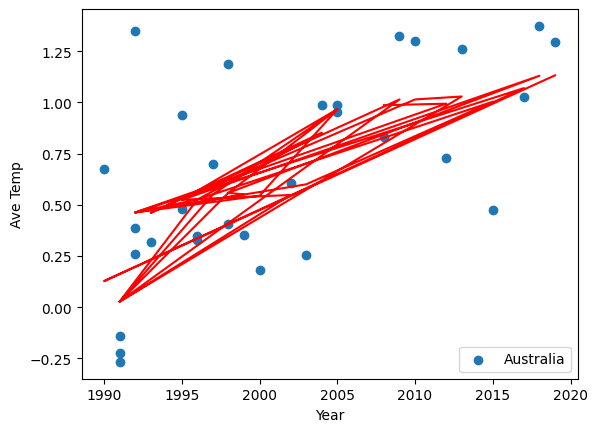

R2_train 0.6619422874141923
R2_test 0.41025549872518396
Train Score: 0.66 Test Score: 0.41
index:  279
area:  Austria


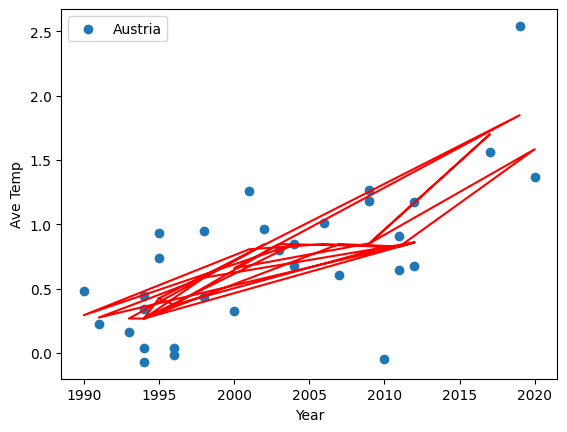

R2_train 0.5689650134290158
R2_test 0.1354151803995931
Train Score: 0.57 Test Score: 0.14
index:  310
area:  Azerbaijan


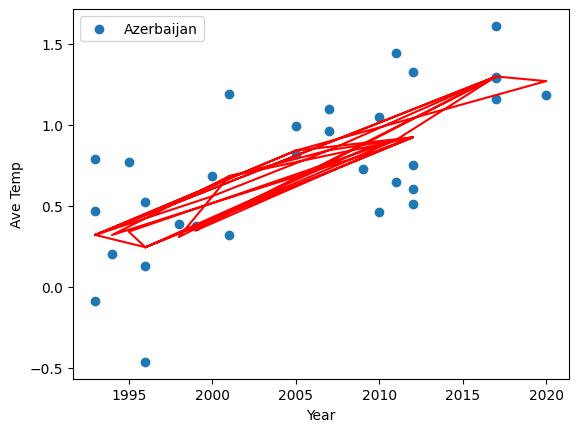

R2_train 0.42219268434274715
R2_test 0.43794231088418323
Train Score: 0.42 Test Score: 0.44
index:  341
area:  Bahrain


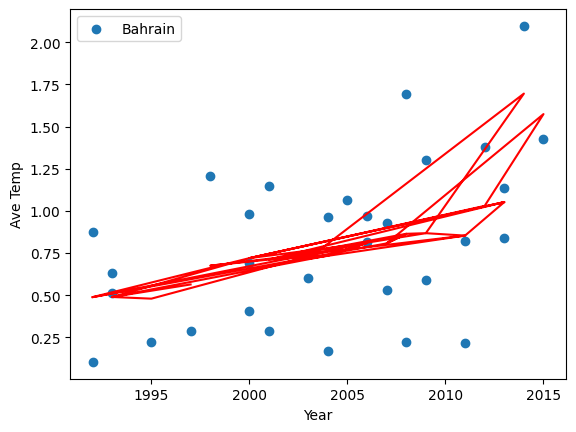

R2_train 0.37669525335979404
R2_test 0.06650244398599481
Train Score: 0.38 Test Score: 0.07
index:  372
area:  Bangladesh


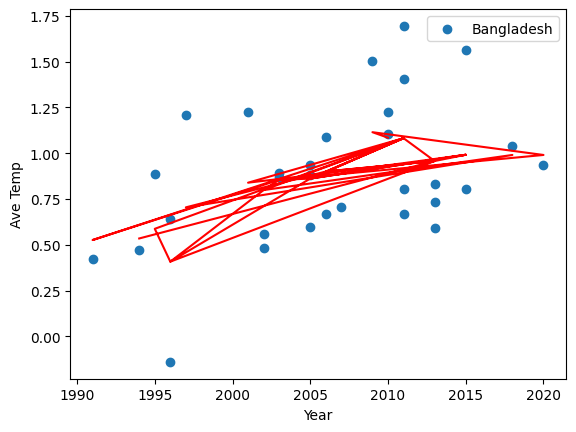

R2_train 0.3125882130195168
R2_test 0.2686480531385923
Train Score: 0.31 Test Score: 0.27
index:  403
area:  Barbados


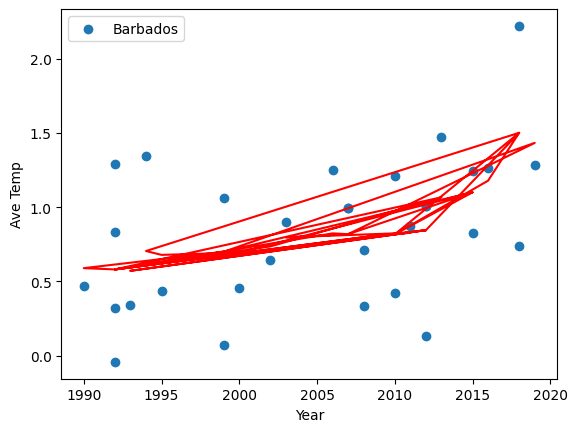

R2_train 0.5196352612871769
R2_test 0.11071689454452827
Train Score: 0.52 Test Score: 0.11
index:  434
area:  Belarus


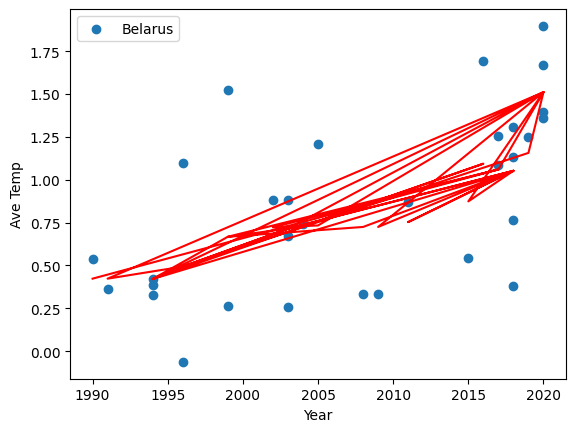

R2_train 0.6248196736111121
R2_test 0.4752711723809361
Train Score: 0.62 Test Score: 0.48
index:  465
area:  Belgium


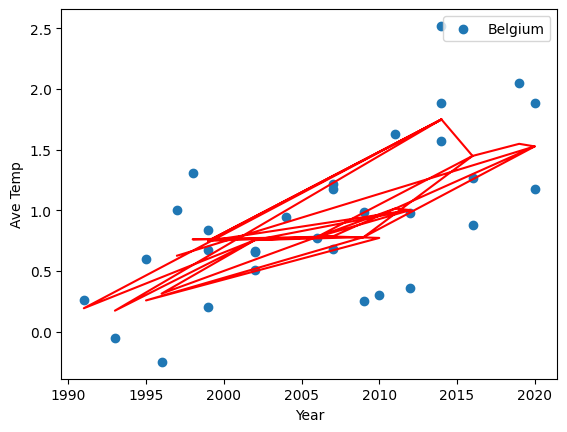

R2_train 0.6499144854496866
R2_test 0.043024424861665134
Train Score: 0.65 Test Score: 0.04
index:  496
area:  Belize


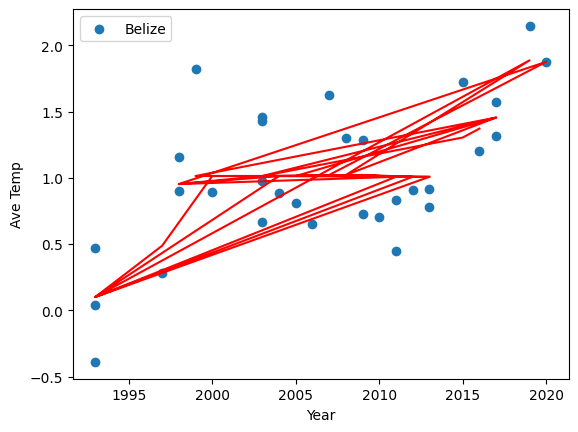

R2_train 0.4103135576470067
R2_test 0.2616929433822227
Train Score: 0.41 Test Score: 0.26
index:  527
area:  Benin


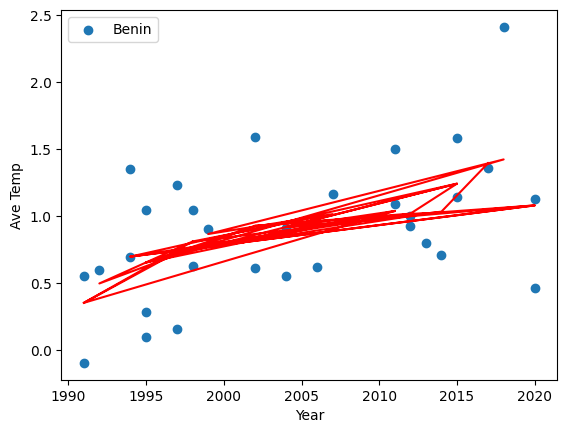

R2_train 0.6740429935258412
R2_test 0.1419042193596569
Train Score: 0.67 Test Score: 0.14
index:  558
area:  Bhutan


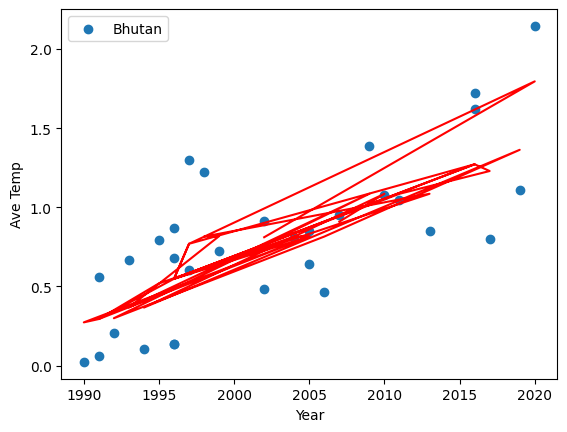

R2_train 0.46466610300889377
R2_test -0.14707448539135637
Train Score: 0.46 Test Score: -0.15
index:  589
area:  Bosnia and Herzegovina


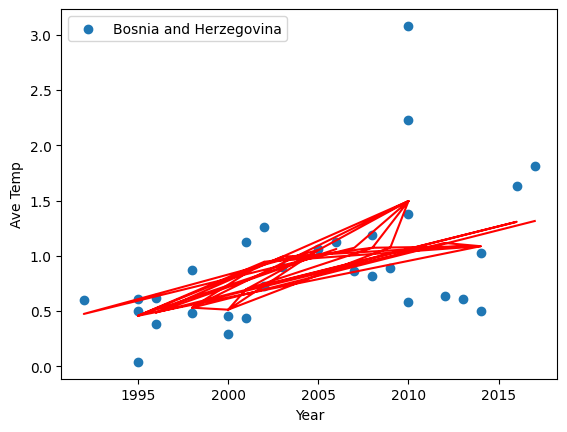

In [ ]:
##Temperature over years
chunk_size = 31

total_iterations = 20

#country_info1 = {}

train_scores=[]
test_scores=[]

# Iterate over the data in chunks
for i in range(total_iterations):
    start_index = i * chunk_size
    end_index = start_index + chunk_size
    x_train =df1_train["Year"].iloc[start_index:end_index]
    # print(x_train.shape)

    x_train=x_train.to_numpy().reshape(-1,1)

    y_train= df1_train["Average Temperature °C"].iloc[start_index:end_index]
    # y_train=y_train.to_numpy().reshape(-1, 1)
    #add more predictor variables
    x_test = df1_test["Year"].iloc[start_index:end_index]
    x_test=x_test.to_numpy().reshape(-1,1)


    y_test= df1_test["Average Temperature °C"].iloc[start_index:end_index]
    # y_test=y_test.to_numpy().reshape(-1, 1)

    country_name = df1_common["Area"].iloc[start_index]

    # # Fit the regressor with x and y data
    regressor1 = RandomForestRegressor(n_estimators=100, max_depth = 2, random_state=42)
    # regressor.fit(x_train, y_train)
    regressor1.fit(x_train, y_train)
    # y_pred = regressor.predict(x_train)
    y_pred = regressor1.predict(x_train)

    R2_train= r2_score(y_train, y_pred)
    print("R2_train", R2_train)

    # #test model

    y_test_pred = regressor1.predict(x_test)
    R2_test= r2_score(y_test, y_test_pred)
    print("R2_test", R2_test)

    train_scores.append(R2_train)
    test_scores.append(R2_test)

    print("Train Score:",round(R2_train,2),"Test Score:",round(R2_test,2))

    # Plot scatterplot
    print("index: ", start_index)
    print("area: ", df1_common["Area"].iloc[start_index])
    plt.scatter(x_train, y_train, label=country_name)
    #maybe smth else than scatter
    # # Plot regression line
    plt.plot(x_train, y_pred, color='red')

    # # # Label axes
    plt.xlabel("Year")
    plt.ylabel("Ave Temp")

    plt.legend()

    plt.show()

In [ ]:
#GridSearchCV on Ave Temp Model
parameters = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [1,2,3,4,10,15]
}

grid = GridSearchCV(estimator=regressor1,
                    param_grid=parameters,
                    )

# Fit the model
grid.fit(x_test, y_train)

# Assess the score
print(grid.best_score_)
print(grid.best_params_)

-3.885068750311645
{'max_depth': 4, 'n_estimators': 100}


**Neural Network Regression**

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping
from keras.layers import BatchNormalization

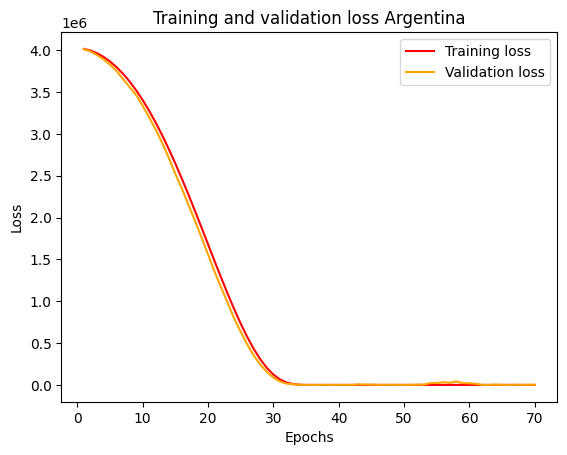

1/1 [==============================] - 0s 24ms/step


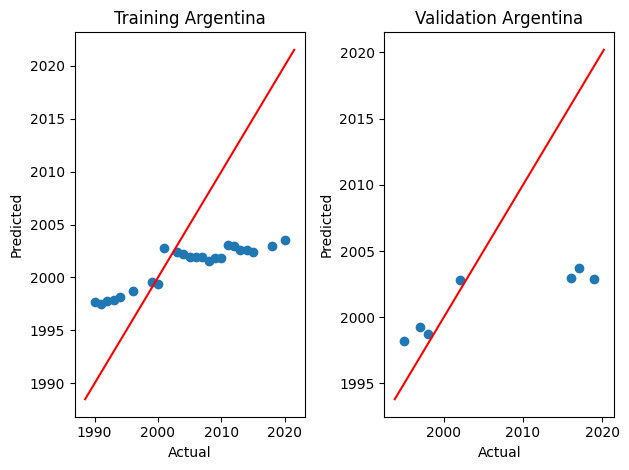

1/1 [==============================] - 0s 40ms/step


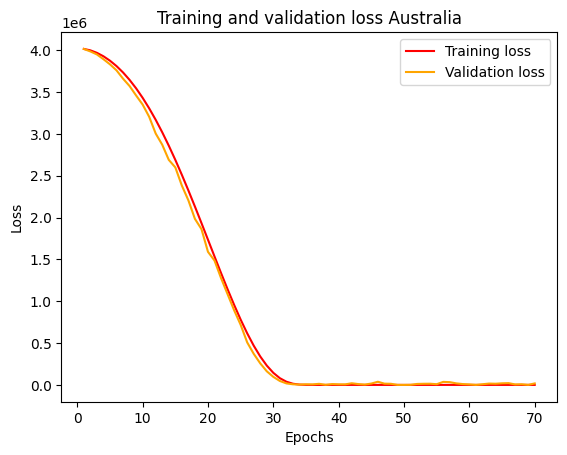

1/1 [==============================] - 0s 22ms/step


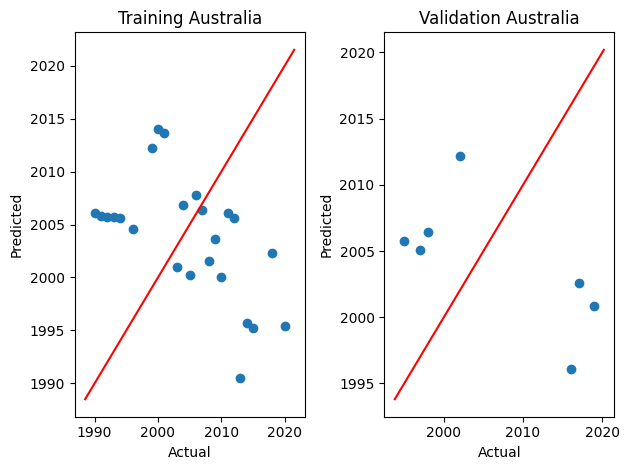

1/1 [==============================] - 0s 21ms/step


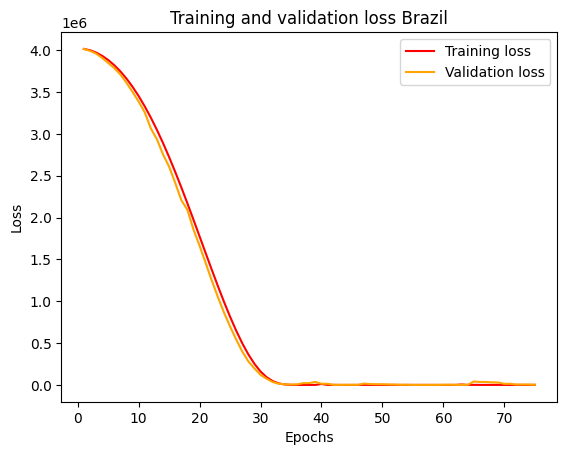

1/1 [==============================] - 0s 34ms/step


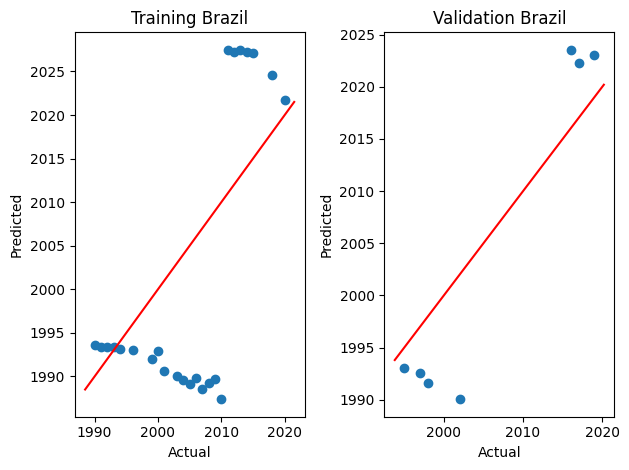

1/1 [==============================] - 0s 41ms/step


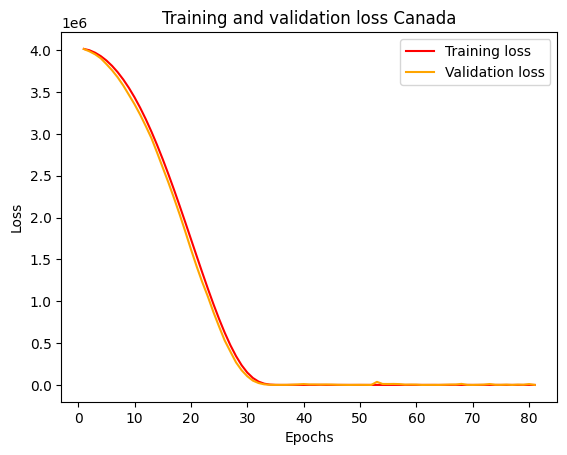

1/1 [==============================] - 0s 22ms/step


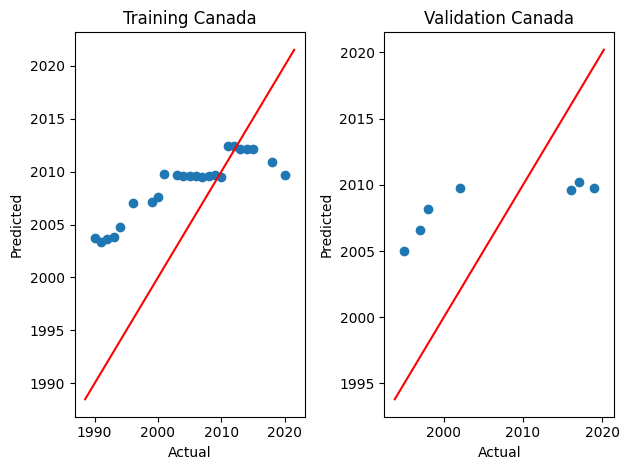

1/1 [==============================] - 0s 22ms/step


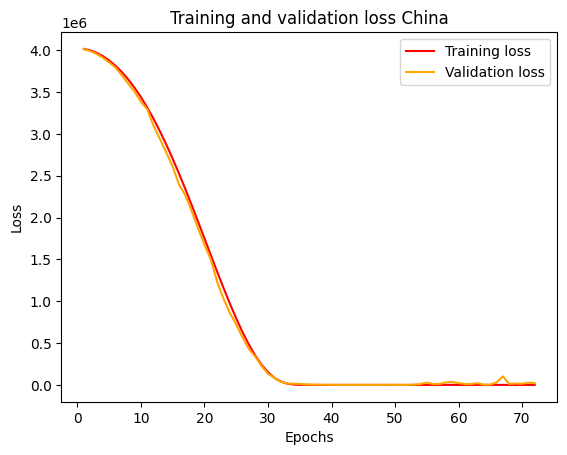

1/1 [==============================] - 0s 36ms/step


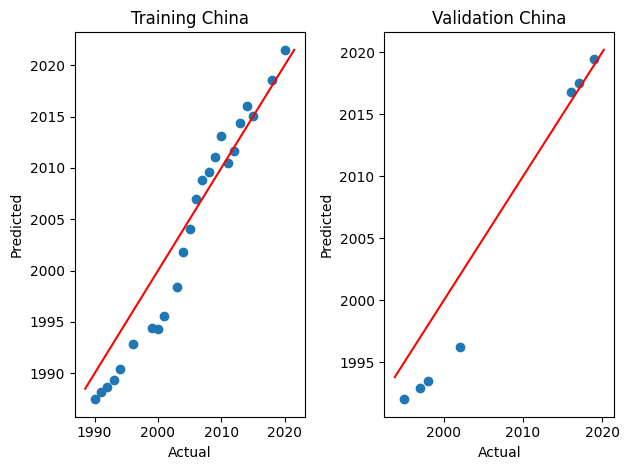

1/1 [==============================] - 0s 33ms/step


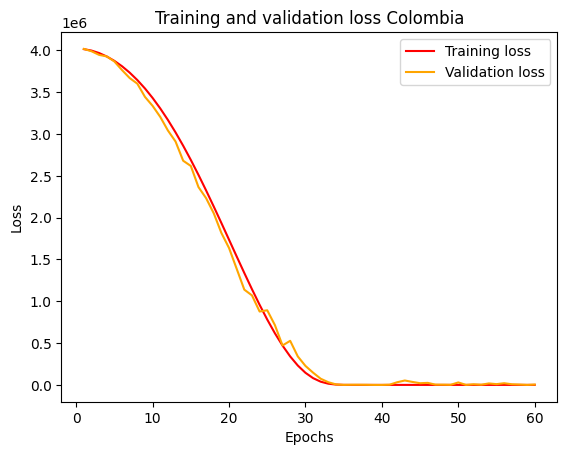

1/1 [==============================] - 0s 25ms/step


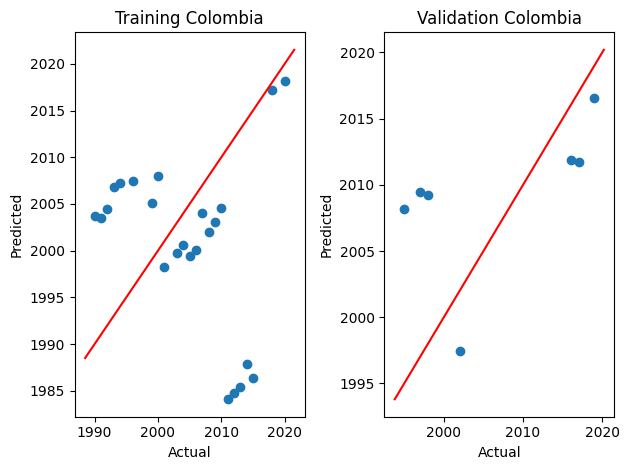

1/1 [==============================] - 0s 27ms/step


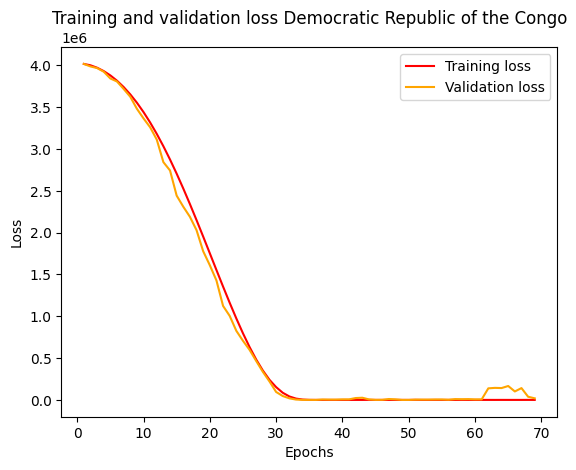

1/1 [==============================] - 0s 28ms/step


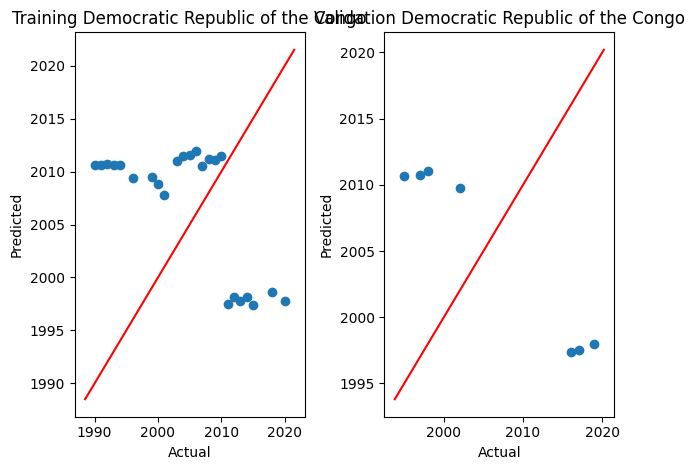

1/1 [==============================] - 0s 21ms/step


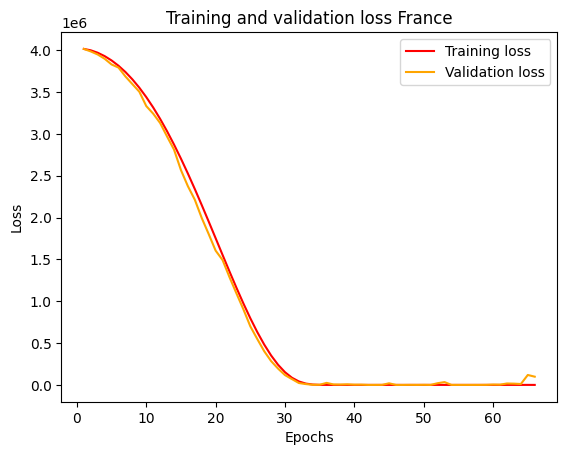

1/1 [==============================] - 0s 27ms/step


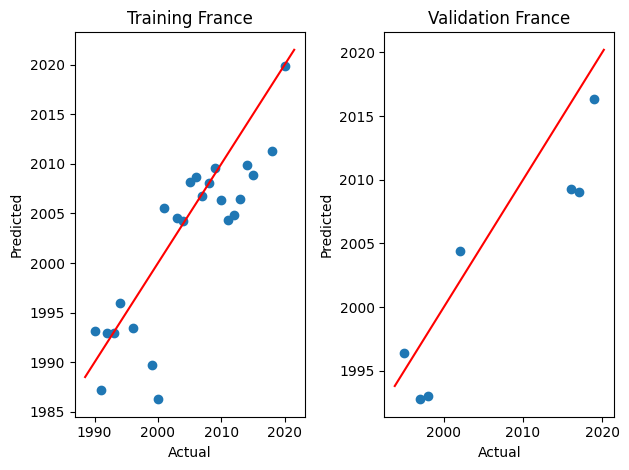

1/1 [==============================] - 0s 26ms/step


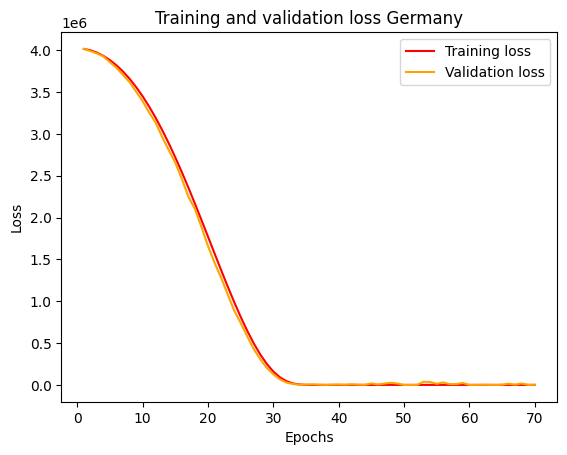

1/1 [==============================] - 0s 26ms/step


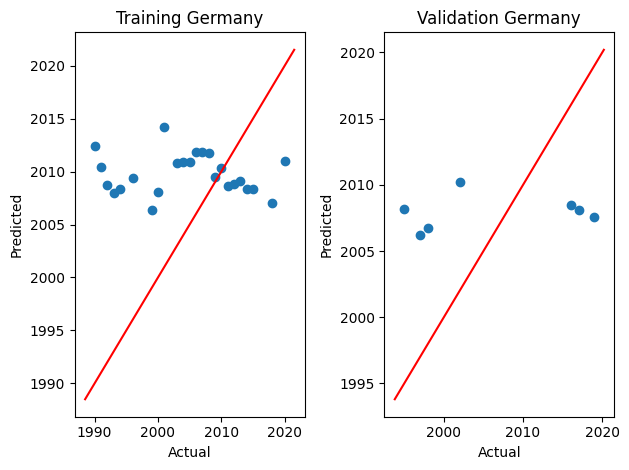

1/1 [==============================] - 0s 28ms/step


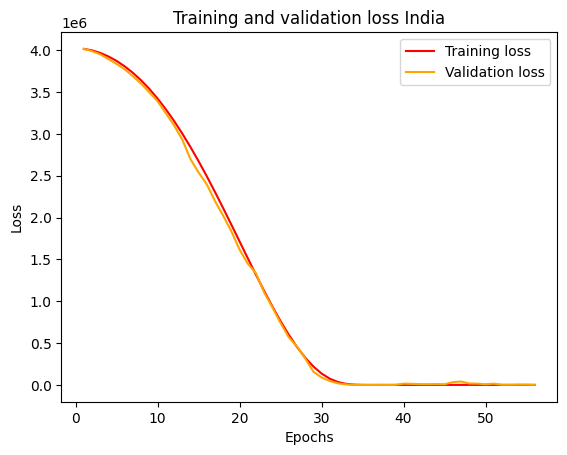

1/1 [==============================] - 0s 32ms/step


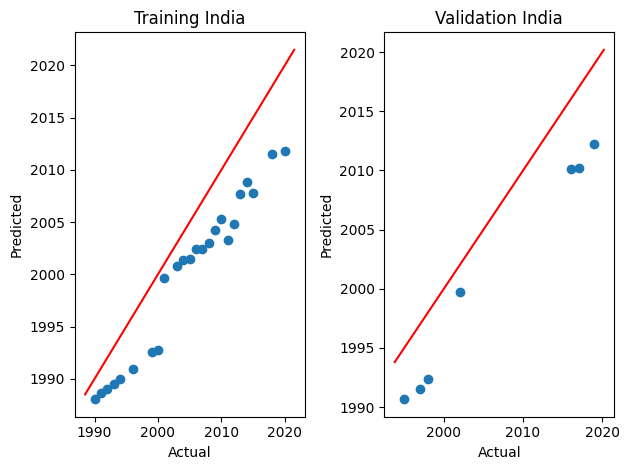

1/1 [==============================] - 0s 39ms/step


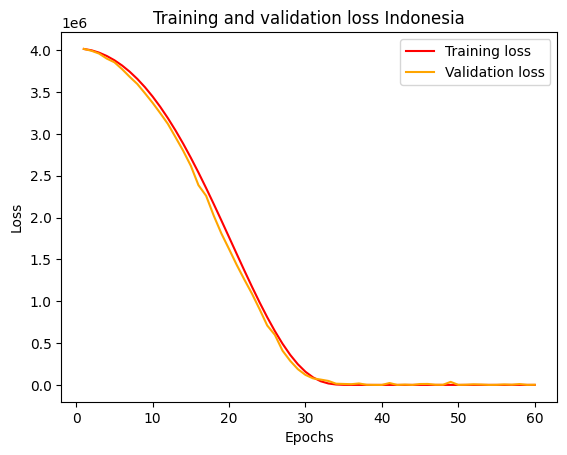

1/1 [==============================] - 0s 23ms/step


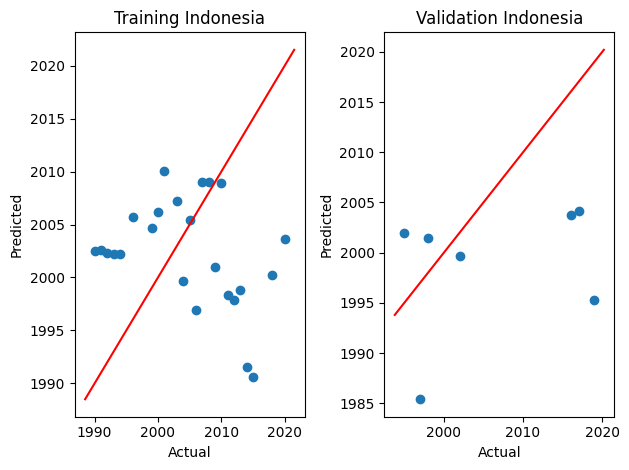

1/1 [==============================] - 0s 23ms/step


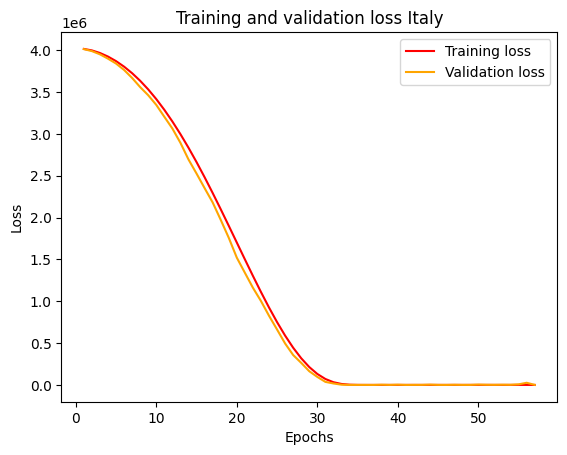

1/1 [==============================] - 0s 36ms/step


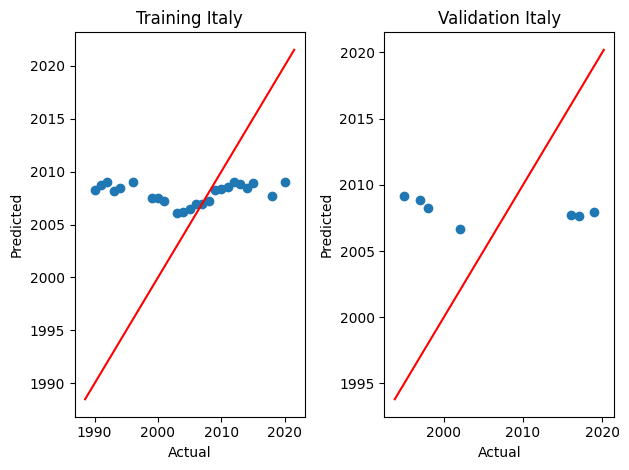

1/1 [==============================] - 0s 31ms/step


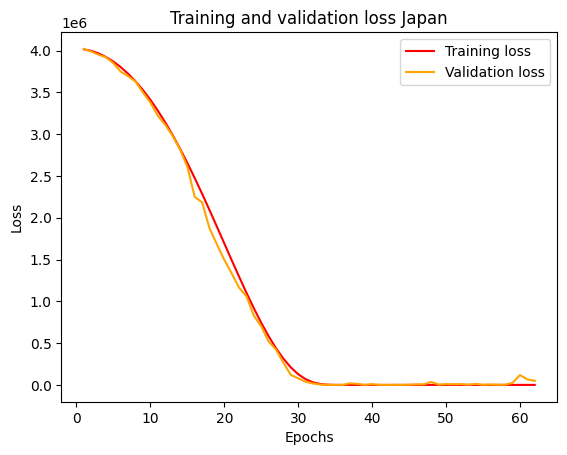

1/1 [==============================] - 0s 24ms/step


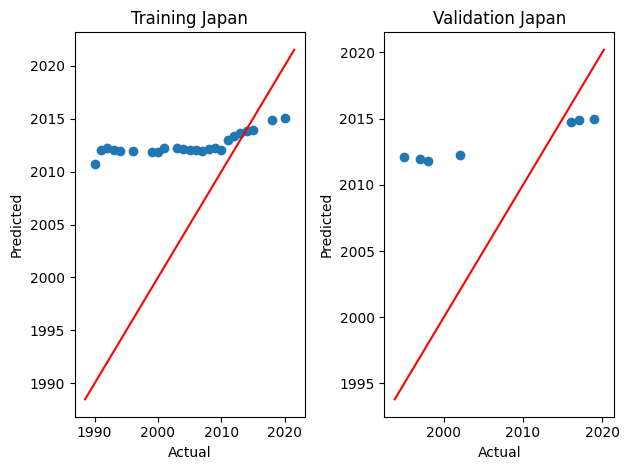

1/1 [==============================] - 0s 30ms/step


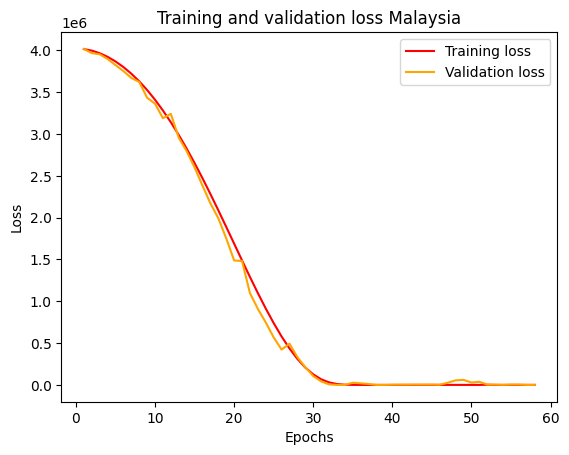

1/1 [==============================] - 0s 21ms/step


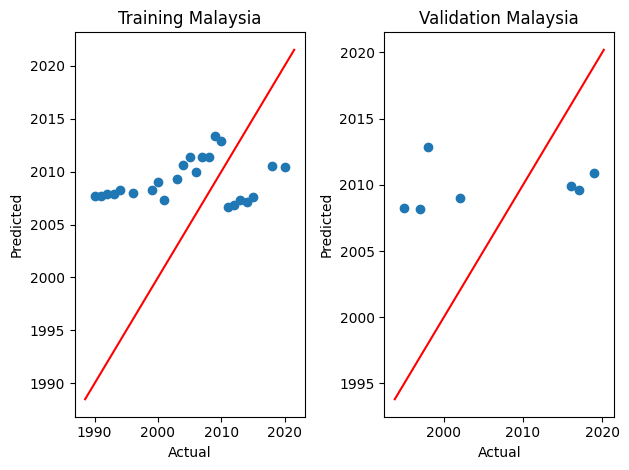

1/1 [==============================] - 0s 22ms/step


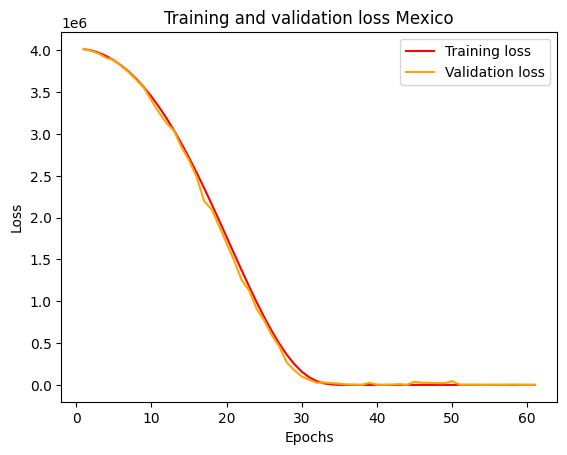

1/1 [==============================] - 0s 22ms/step


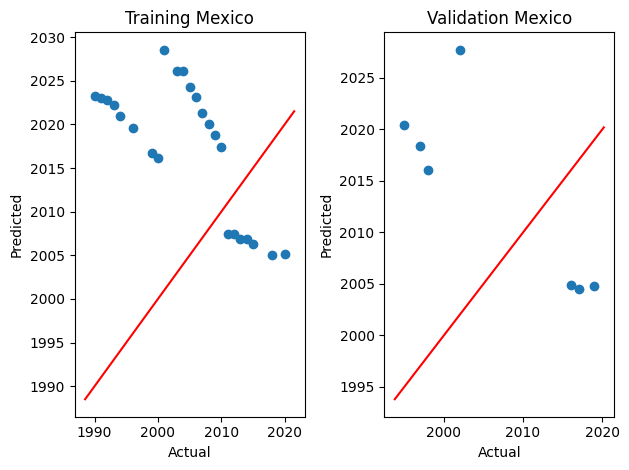

1/1 [==============================] - 0s 23ms/step


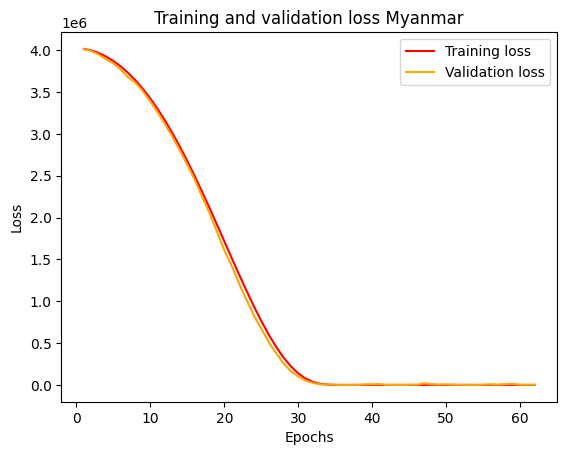

1/1 [==============================] - 0s 23ms/step


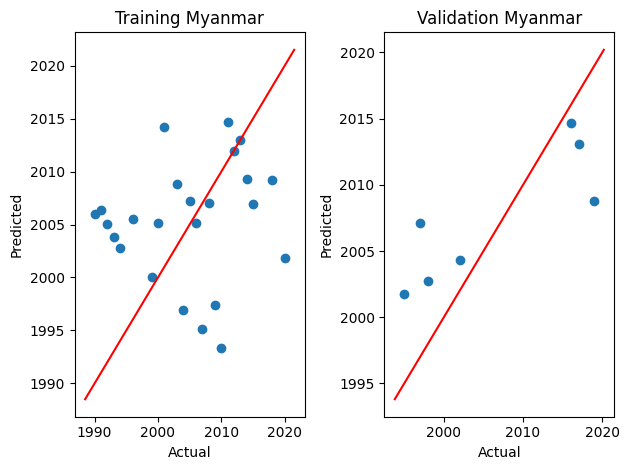

1/1 [==============================] - 0s 22ms/step


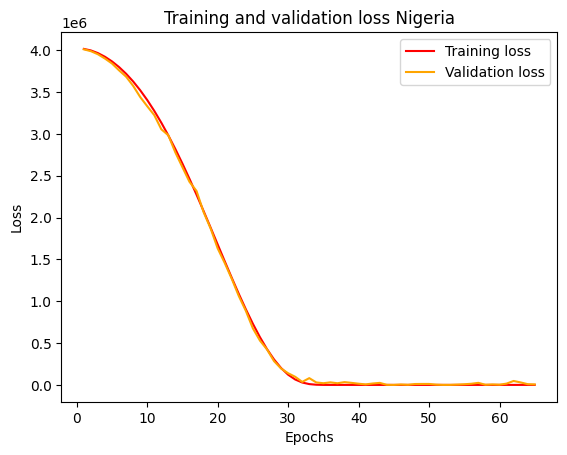

1/1 [==============================] - 0s 27ms/step


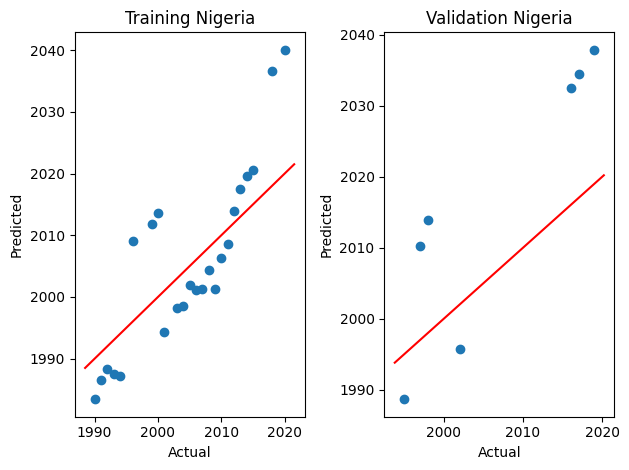

1/1 [==============================] - 0s 25ms/step


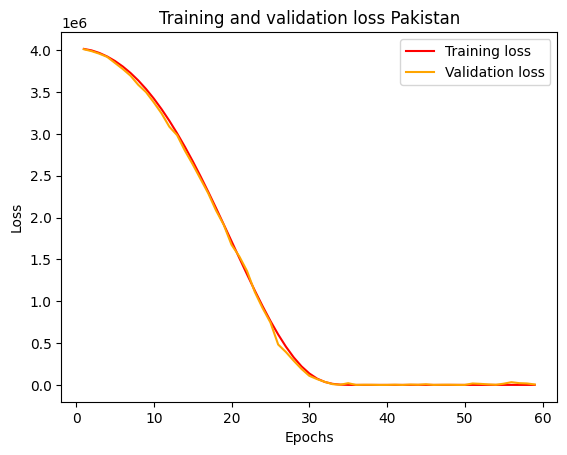

1/1 [==============================] - 0s 21ms/step


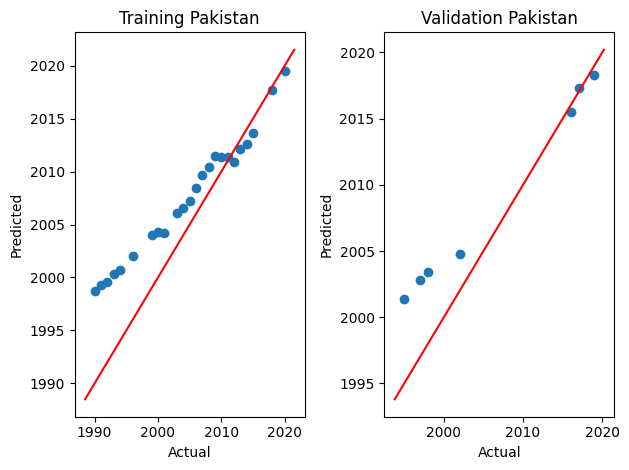

1/1 [==============================] - 0s 23ms/step


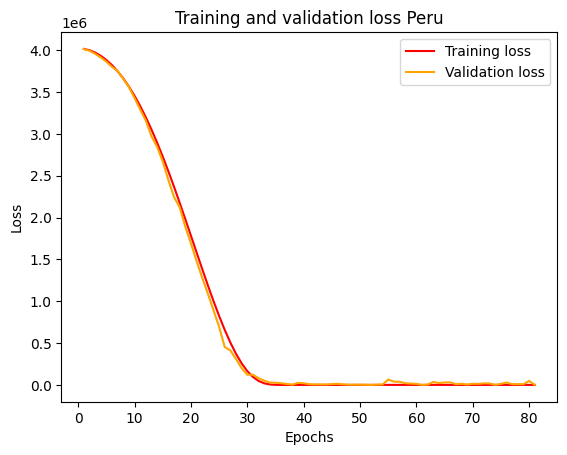

1/1 [==============================] - 0s 23ms/step


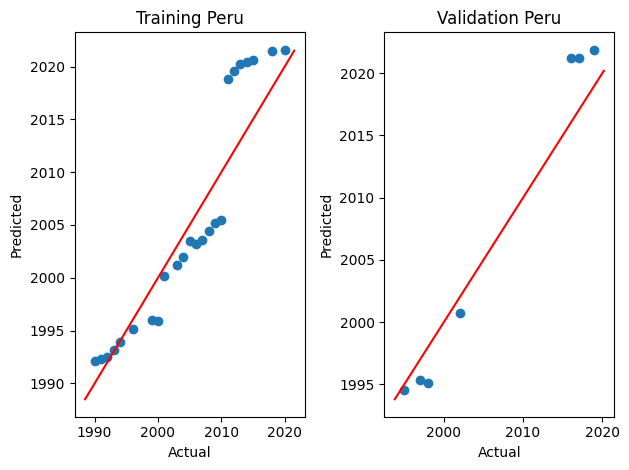

1/1 [==============================] - 0s 34ms/step


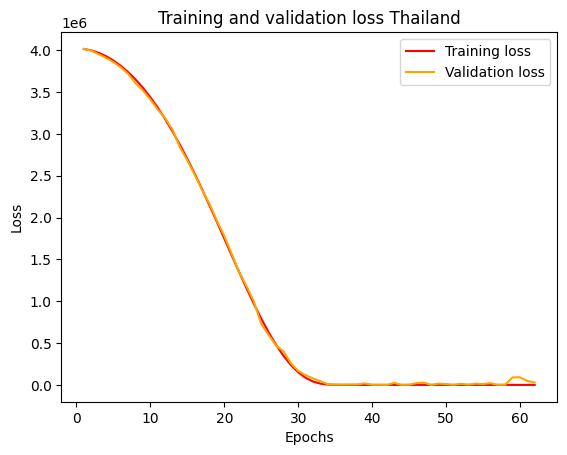

1/1 [==============================] - 0s 23ms/step


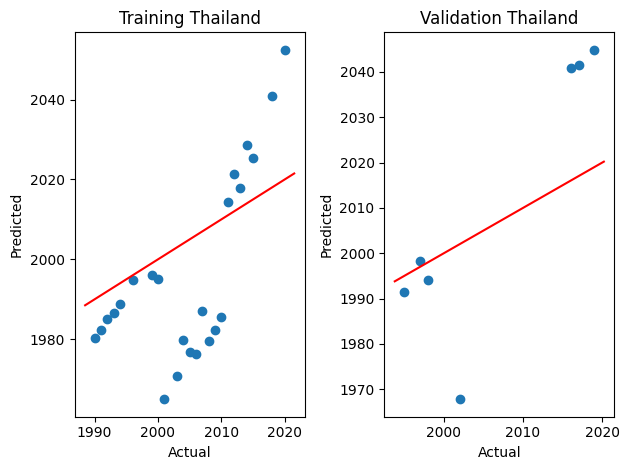

1/1 [==============================] - 0s 24ms/step


In [ ]:
r2_scores = []

for country in df1_top["Area"].unique():
  df_country = df1_top[df1_top['Area'] == country]

  X = df_country['total_emission']
  y = df_country['Year']

  #Shift values to numpy array
  X = np.array(X)
  y = np.array(y)

  #Establish the train and test data split
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 123)

  min_max_scaler = MinMaxScaler()
  X_train_scaled = min_max_scaler.fit_transform(X_train.reshape(-1, 1))
  X_test_scaled = min_max_scaler.transform(X_test.reshape(-1, 1))

  #Build the model
  model = Sequential()
  model.add(Dense(200, input_shape = (X_train_scaled.shape[1],), activation='relu'))
  model.add(BatchNormalization())
  model.add(Dense(100, activation='linear'))
  model.add(BatchNormalization())
  model.add(Dense(50, activation='linear'))
  #model.add(BatchNormalization())
  model.add(Dense(1, activation='linear'))

  from keras.optimizers import RMSprop
  optimizer = RMSprop(learning_rate=0.003)

  #Compile
  model.compile(optimizer=optimizer, loss = 'mse', metrics=['mae'])

  #Implement the early stopping callback
  es = EarlyStopping(monitor = 'val_loss', mode ='min', patience = 20, restore_best_weights = True)

  #Fit the model
  records = model.fit(X_train_scaled, y_train,
                      validation_data = (X_test_scaled, y_test),
                      callbacks=[es],
                      epochs = 150,
                      batch_size = 4,
                      verbose = 0)

  #Evaluate the model
  records_dict = records.history
  loss_values = records_dict['loss']
  val_loss_values = records_dict['val_loss']
  epochs = range(1, len(loss_values) + 1)
  plt.plot(epochs, loss_values, 'red', label='Training loss')
  plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
  plt.title('Training and validation loss ' + country)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

  fig, axes = plt.subplots(1,2)

  #Training Results
  axes[0].scatter(x=y_train, y=model.predict(X_train_scaled))
  axes[0].set_xlabel("Actual", fontsize=10)
  axes[0].set_ylabel("Predicted",  fontsize=10)
  axes[0].set_title("Training " + country)

  x = np.linspace(*axes[0].get_xlim())
  axes[0].plot(x, x, color='red')

  #Validation Results
  axes[1].scatter(x=y_test, y=model.predict(X_test_scaled))
  axes[1].set_xlabel("Actual", fontsize=10)
  axes[1].set_ylabel("Predicted",  fontsize=10)
  axes[1].set_title("Validation " + country)

  x = np.linspace(*axes[1].get_xlim())
  axes[1].plot(x, x, color='red')
  fig.tight_layout()
  plt.show()

  y_pred = model.predict(X_test_scaled)
  r2 = r2_score(y_test, y_pred)
  r2_scores.append(r2)



In [ ]:
from statistics import mean
print(r2_scores)
print(mean(r2_scores))

#-0.39 learning rate .003
#-0.99 learning rate .004
# batch size 5 -2.269
# patience 15 -1.5
# epochs 150 -0.26 -0.76 -0.32 -0.28
# first layer 150 neurons -0.97
# first layer 250 -2.66

[0.07485635714962124, -0.9190446774154266, 0.5405371737099709, 0.21124514265580385, 0.8806060957020901, 0.21756846354045767, -1.7287013794259822, 0.7524309649239196, 0.0058916182086823365, 0.6837455665684761, -0.6024894504566141, -0.11037864820120169, -0.2428322299997856, -0.0836835924710364, -2.8322591652927245, 0.5588978275783518, -1.141609175179867, 0.832014779267793, 0.9005058866675864, -3.6006031657628554]
-0.280165080411637


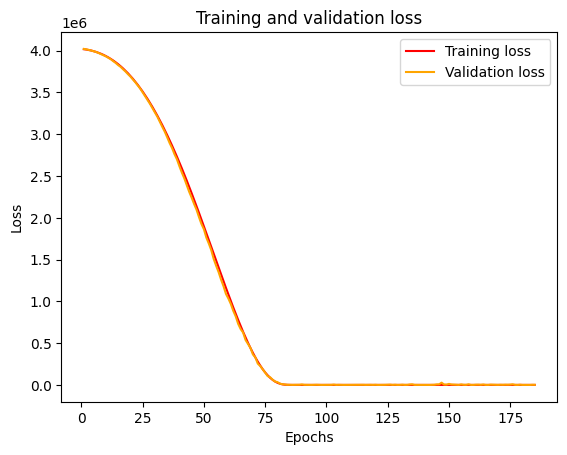

In [ ]:
#Evaluate the model
records_dict = records.history
loss_values = records_dict['loss']
val_loss_values = records_dict['val_loss']
epochs = range(1, len(loss_values) + 1)
plt.plot(epochs, loss_values, 'red', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

1/1 [==============================] - 0s 23ms/step


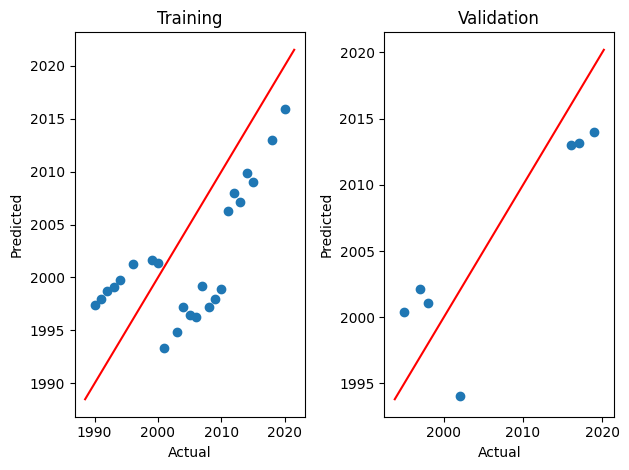

In [ ]:

fig, axes = plt.subplots(1,2)

#Training Results
axes[0].scatter(x=y_train, y=model.predict(X_train_scaled))
axes[0].set_xlabel("Actual", fontsize=10)
axes[0].set_ylabel("Predicted",  fontsize=10)
axes[0].set_title("Training")

x = np.linspace(*axes[0].get_xlim())
axes[0].plot(x, x, color='red')

#Validation Results
axes[1].scatter(x=y_test, y=model.predict(X_test_scaled))
axes[1].set_xlabel("Actual", fontsize=10)
axes[1].set_ylabel("Predicted",  fontsize=10)
axes[1].set_title("Validation")

x = np.linspace(*axes[1].get_xlim())
axes[1].plot(x, x, color='red')


fig.tight_layout()
plt.show()

In [ ]:
#Metrics
pred = model.predict(X_test_scaled)
pred

trainpreds = model.predict(X_train_scaled)

from sklearn.metrics import mean_absolute_error
print(mean_absolute_error(y_train, trainpreds))
print(mean_absolute_error(y_test, pred))

NameError: ignored